# Data Analysis Using Python: A Beginner’s Guide Featuring NYC Open Data  
## Part 4: Working with geospatial data and mapping

Mark Bauer

Table of Contents
=================

   * [1. Importing Libraries](#1-Importing-Libraries)
       
       
   * [2. Reading and Writing Files](#2-Reading-and-Writing-Files)
       * [2.1 Reading Spatial Data](#21-Reading-Spatial-Data)
       * [2.2 Writing Spatial Data](#22-Writing-Spatial-Data)
       
       
   * [3. Data Structures](#3-Data-Structures)
       * [3.1 GeoSeries](#31-GeoSeries)
       * [3.2 GeoDataFrame](#32-GeoDataFrame) 
   
   
   * [4. Attributes and Methods](#4-Attributes-and-Methods)
       * [4.1 Basic Attributes](#41-Basic-Attributes)
       * [4.2 Basic Methods](#42-Basic-Methods)
       * [4.3 Create Centroids from Polygons](#43-Create-Centroids-from-Polygons)
       * [4.4 Creating a GeoDataFrame from a DataFrame with Coordinates](#44-Creating-a-GeoDataFrame-from-a-DataFrame-with-Coordinates)
       * [4.5 Relationship Tests](#45-Relationship-Tests)
       

   * [5. Making Maps](#5-Making-Maps)
       * [5.1 Points](#51-Points)
       * [5.2 Lines](#52-Lines)
       * [5.3 Polygons](#53-Polygon)
       * [5.4 Maps with Layers](#54-Maps-with-Layers)
       * [5.5 Adding Background Map](#55-Adding-Background-Map)
       * [5.6 Clip Data](#56-Clip-Data)
       
       
   * [6. Types of Maps](#6-Types-of-Maps)
       * [6.1 Choropleth Maps](#6-Choropleth-Maps)
       * [6.2 Heat Maps](#62-Heat-Maps)
       * [6.3 Hexbin Map](#63-Hexbin-Map)
       * [6.4 Proportional Symbol Map](#64-Proportional-Symbol-Map)
       * [6.5 Graduated Symbol Map](#65-Graduated-Symbol-Map)
       * [6.6 One-to-One Dot Density Map](#66-One-to-One-Dot-Density-Map)
       * [6.7 One-to-One Dot Density Map with Joint Grids](#67-One-to-One-Dot-Density-Map-with-Joint-Grids)
       * [6.8 Cartogram Map](#68-Cartogram-Map)
       * [6.9 Voroni Map](#69-Voroni-Map)
       * [6.10 Quadtree Map](#610-Quadtree-Map)
       * [6.11 Aesthetics for Maps](#611-Aesthetics-for-Maps)
       
       
   * [7. Joining Data](#7-Joining-Data)
       * [7.1 Attribute Join](#71-Attribute-Join)
       * [7.2 Spatial Join](#72-Spatial-Join)

       
   * [8. Indexing and Selecting Data](#8-Indexing-and-Selecting-Data)

       
   * [9. Coordinate Reference Systems](#9-Coordinate-Reference-Systems)

       
   * [10. Set Operations with Overlay](#10-Set-Operations-with-Overlay)
       * [10.1 Union](#101-Union)
       * [10.2 Intersection](#102-Intersection)
       * [10.3 Symmetric Difference](#103-Symmetric-Difference)
       * [10.4 Difference](#104-Difference)
       * [10.5 Identity](#105-Identity)
       
       
   * [11. Aggregation with Dissolve](#11-Aggregation-with-Dissolve)


   * [12. Additional Attributes and Methods](#12-Additional-Attributes-and-Methods)
       * [12.1 Unary Predicates](#121-Unary-Predicates)
       * [12.2 Binary Predicates](#122-Binary-Predicates)
           * [12.2.1 Centroids vs. Representative Points](#1221-Centroids-vs-Representative-Points)
           * [12.2.2 Intersects](#1222-Intersects)
           * [12.2.3 Contains](#1223-Contains)  
           * [12.2.4 Within](#1224-Within)
           * [12.2.5 Crosses](#1225-Crosses)
           * [12.2.6 Overlaps](##1226-Overlaps)
           * [12.2.7 Touches](##1227-Touches)
           * [12.2.8 Covers](#1228-Covers)
       * [12.3 Set-Theoretic Methods](#123-Set-Theoretic-Methods)
       * [12.4 Constructive Methods](#124-Constructive-Methods)
           * [12.4.1 Buffer](#1241-Buffer)
           * [12.4.2 Convex Hull](#1242-Convex-Hull)
           * [12.4.3 Envelope](#1243-Envelope)  
           * [12.4.4 Simplify](#1244-Simplify)
           
       * [12.5 Affine Transformations](#125-Affine-Transformations)
           * [12.5.1 Rotate](#1251-Rotate)
           * [12.5.2 Scale](#1252-Scale)
           * [12.5.3 Skew](#1253-Skew)  
           * [12.5.4 Translate/Offset](#1254-Translate-Offset)
           
       
   * [13. Conclusion](#13-Conclusion)

**Goal:** In this notebook, we will review various workflows of working with geospatial data and mapping.

**Main Libraries:** 

[GeoPandas](https://geopandas.org/index.html) is an open source project to make working with geospatial data in python easier. GeoPandas extends the datatypes used by pandas to allow spatial operations on geometric types. Geometric operations are performed by shapely. Geopandas further depends on fiona for file access and descartes and matplotlib for plotting.

[geoplot](https://residentmario.github.io/geoplot/index.html#) is a high-level Python geospatial plotting library. It’s an extension to cartopy and matplotlib which makes mapping easy: like seaborn for geospatial.

[Matplotlib](https://matplotlib.org/3.1.1/index.html#) is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms.

[Seaborn](https://seaborn.pydata.org/index.html) is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

[pandas](https://pandas.pydata.org/) is a fast, powerful, flexible and easy to use open source data analysis and manipulation tool, built on top of the Python programming language.

# 1. Importing Libraries

In [1237]:
# importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
import mapclassify as mc
import fiona
from fiona.crs import from_epsg
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import matplotlib.patheffects as pe
from mpl_toolkits.axes_grid1 import make_axes_locatable
import urllib
import json
from io import BytesIO
import requests
from sodapy import Socrata
import os
import zipfile
from zipfile import ZipFile
from os.path import basename
import contextily as ctx

Printing verions of Python modules and packages with **watermark** - the IPython magic extension.

In [1238]:
%load_ext watermark

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark


In [1239]:
%watermark -v -p numpy,pandas,geopandas,geoplot,matplotlib.pyplot,json,requests,sodapy

CPython 3.7.1
IPython 7.18.1

numpy 1.19.2
pandas 1.0.0
geopandas 0.8.1
geoplot 0.4.0
matplotlib.pyplot 3.3.2
json 2.0.9
requests 2.24.0
sodapy 2.0.0


Documention for installing watermark: https://github.com/rasbt/watermark

In [1240]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# 2. Reading and Writing Files

## 2.1 Reading Spatial Data

In [1241]:
# Reading in GeoJSON
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [1242]:
# Reading in shapefile inside a zip folder
zipfile = 'https://data.cityofnewyork.us/download/jfju-ynrr/application%2Fzip'
school_points = gpd.read_file(zipfile)

school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,STATE_CODE,ZIP,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.000,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,NY,11220,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759)
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.000,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,NY,11226,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911)
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.000,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,NY,11223,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361)
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.000,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,NY,11204,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993)
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.000,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,NY,11223,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591)


In [1243]:
ls data/

nta_shape.cpg      nta_shape.geojson  nta_shape.shp
nta_shape.dbf      nta_shape.prj      nta_shape.shx


## 2.2 Writing Spatial Data

In [1244]:
# Writing to Shapefile:
nta_shape.to_file("data/nta_shape.shp")

# Writing to GeoJSON:
nta_shape.to_file("data/nta_shape.geojson", driver='GeoJSON')

In [1245]:
ls data/

nta_shape.cpg      nta_shape.geojson  nta_shape.shp
nta_shape.dbf      nta_shape.prj      nta_shape.shx


# 3. Data Structures

In [1246]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


## 3.1 GeoSeries

In [1247]:
type(nta_shape['geometry'])

geopandas.geoseries.GeoSeries

## 3.2 GeoDataFrame

In [1248]:
type(nta_shape)

geopandas.geodataframe.GeoDataFrame

# 4. Attributes and Methods

## 4.1 Basic Attributes

In [1249]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [1250]:
nta_shape.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [1251]:
nta_shape.to_crs(epsg=2263, inplace=True)

nta_shape.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [1252]:
nta_shape.geometry.name

'geometry'

In [1253]:
nta_shape.area

0      54005019.048
1      52488277.591
2      19726946.569
3      14522603.592
4      22887772.809
           ...     
190   225338344.201
191    50978402.862
192    47308036.617
193   100210684.532
194   309063340.069
Length: 195, dtype: float64

In [1254]:
nta_shape.length

0      39247.228
1      33266.905
2      19816.685
3      18756.702
4      20976.336
         ...    
190   385525.873
191    33792.263
192    43696.365
193   119014.571
194   487054.164
Length: 195, dtype: float64

In [1255]:
nta_shape.bounds

,minx,miny,maxx,maxy
0,982208.206,162478.112,991773.079,174107.999
1,1032285.263,215407.440,1042341.099,223347.719
2,1018489.773,214963.455,1024560.201,220477.853
3,995708.028,171874.264,999315.731,178131.302
4,1047476.922,195242.429,1053433.777,201532.097
...,...,...,...,...
190,977420.822,149419.880,1030453.459,197615.718
191,1025988.075,187476.975,1036764.145,195882.129
192,1035162.882,191039.730,1048446.277,200102.186
193,1000721.907,136686.831,1035685.834,163473.152


In [1256]:
nta_shape.total_bounds

array([ 913175.10900879,  120121.88126113, 1067382.50860596,
        272844.29400627])

In [1257]:
nta_shape.geom_type

0      MultiPolygon
1      MultiPolygon
2      MultiPolygon
3      MultiPolygon
4      MultiPolygon
           ...     
190    MultiPolygon
191    MultiPolygon
192    MultiPolygon
193    MultiPolygon
194    MultiPolygon
Length: 195, dtype: object

In [1258]:
nta_shape.geom_type.value_counts()

MultiPolygon    195
dtype: int64

In [1259]:
nta_shape.is_valid

0      True
1      True
2      True
3      True
4      True
       ... 
190    True
191    True
192    True
193    True
194    True
Length: 195, dtype: bool

In [1260]:
nta_shape.is_valid.value_counts()

True    195
dtype: int64

In [1261]:
zipfile = 'https://data.cityofnewyork.us/download/jfju-ynrr/application%2Fzip'
school_points = gpd.read_file(zipfile)

school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,STATE_CODE,ZIP,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.000,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,NY,11220,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759)
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.000,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,NY,11226,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911)
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.000,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,NY,11223,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361)
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.000,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,NY,11204,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993)
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.000,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,NY,11223,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591)


In [1262]:
school_points['geometry'].x

0       980985.054
1       997785.136
2       991224.983
3       988439.681
4       988205.073
           ...    
1704   1000974.837
1705   1027676.631
1706   1008199.775
1707   1008239.820
1708   1006497.117
Length: 1709, dtype: float64

In [1263]:
school_points['geometry'].y

0      175780.759
1      178431.911
2      156323.361
3      160709.993
4      158329.591
          ...    
1704   216289.829
1705   251468.398
1706   259137.237
1707   259105.897
1708   235553.859
Length: 1709, dtype: float64

## 4.2 Basic Methods

In [1264]:
nta_shape.centroid

0       POINT (987397.463 169148.408)
1      POINT (1037005.224 219265.318)
2      POINT (1020706.745 217413.871)
3       POINT (997674.726 174677.650)
4      POINT (1050471.492 198271.804)
                    ...              
190    POINT (1006576.015 166297.653)
191    POINT (1031134.609 192361.611)
192    POINT (1041371.284 195964.278)
193    POINT (1018636.191 147566.096)
194    POINT (1030807.168 190601.758)
Length: 195, dtype: geometry

In [1265]:
nta_shape.distance(nta_shape.centroid)

0        0.000
1        0.000
2        0.000
3        0.000
4        0.000
        ...   
190   5659.268
191      0.000
192      0.000
193   2256.884
194   4906.539
Length: 195, dtype: float64

In [1266]:
distance = nta_shape.distance(nta_shape.centroid)

distance.value_counts()

0.000       186
1428.477      1
211.828       1
368.429       1
2256.884      1
4906.539      1
5659.268      1
224.812       1
310.705       1
6158.447      1
dtype: int64

In [1267]:
nta_shape.representative_point()

0       POINT (987147.799 168296.940)
1      POINT (1037188.868 219481.436)
2      POINT (1020704.334 217630.915)
3       POINT (997512.057 175092.435)
4      POINT (1050352.622 198427.878)
                    ...              
190    POINT (1013094.270 155382.640)
191    POINT (1031657.891 191801.466)
192    POINT (1039609.012 195562.861)
193    POINT (1005567.231 141616.367)
194    POINT (1018631.541 192785.274)
Length: 195, dtype: geometry

In [1268]:
distance = nta_shape.distance(nta_shape.representative_point())

distance.value_counts()

0.000    195
dtype: int64

In [1269]:
print("CRS: " + str(nta_shape.crs))
print("CRS: " + str(nta_shape.to_crs(epsg=4326).crs))

CRS: epsg:2263
CRS: epsg:4326


<AxesSubplot:>

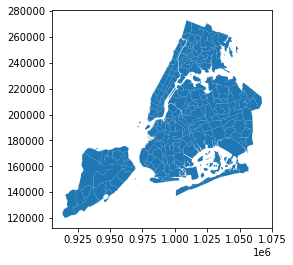

In [1270]:
nta_shape.plot()

<AxesSubplot:>

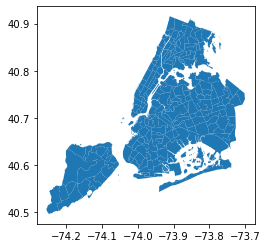

In [1271]:
nta_shape.to_crs(epsg=4326).plot()

## 4.3 Create Centroids from Polygons

In [1272]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588...."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339...."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192..."


<AxesSubplot:>

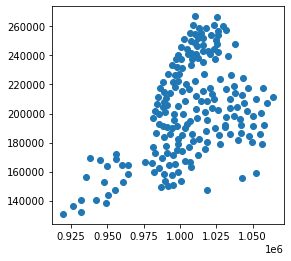

In [1273]:
nta_shape['centroid_column'] = nta_shape.centroid

nta_shape.set_geometry('centroid_column').plot()

## 4.4 Creating a GeoDataFrame from a DataFrame with Coordinates

In [1274]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [1275]:
nta_shape['centroid_column'] = nta_shape.centroid
nta_shape.set_geometry('centroid_column', inplace=True)
nta_shape['x'], nta_shape['y'] = nta_shape.centroid_column.x, nta_shape.centroid_column.y
nta_shape_no_geometry = nta_shape[['ntaname', 'x', 'y']]

nta_shape_no_geometry.head()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """Entry point for launching an IPython kernel.


,ntaname,x,y
0,Borough Park,-73.989,40.631
1,Murray Hill,-73.810,40.768
2,East Elmhurst,-73.868,40.763
3,Erasmus,-73.952,40.646
4,Hollis,-73.761,40.711


In [1276]:
print(type(nta_shape_no_geometry))

<class 'pandas.core.frame.DataFrame'>


In [1277]:
nta_shape_with_geometry = gpd.GeoDataFrame(nta_shape_no_geometry, 
                              geometry=gpd.points_from_xy(nta_shape_no_geometry.x, 
                              nta_shape_no_geometry.y))

In [1278]:
nta_shape_with_geometry.head()

,ntaname,x,y,geometry
0,Borough Park,-73.989,40.631,POINT (-73.98866 40.63095)
1,Murray Hill,-73.810,40.768,POINT (-73.80955 40.76835)
2,East Elmhurst,-73.868,40.763,POINT (-73.86840 40.76335)
3,Erasmus,-73.952,40.646,POINT (-73.95162 40.64612)
4,Hollis,-73.761,40.711,POINT (-73.76114 40.71064)


In [1279]:
type(nta_shape_with_geometry)

geopandas.geodataframe.GeoDataFrame

<AxesSubplot:>

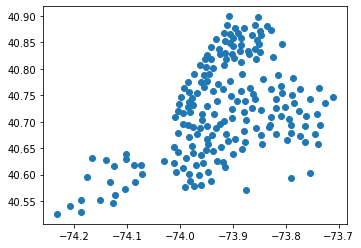

In [1280]:
nta_shape_with_geometry.plot()

## 4.5 Relationship Tests

In [1281]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)
nta_shape['centroid_column'] = nta_shape.centroid

nta_shape.head()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  This is separate from the ipykernel package so we can avoid doing imports until


,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,centroid_column
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ...",POINT (-73.98866 40.63095)
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ...",POINT (-73.80955 40.76835)
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ...",POINT (-73.86840 40.76335)
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ...",POINT (-73.95162 40.64612)
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ...",POINT (-73.76114 40.71064)


In [1282]:
nta_shape['geometry'].contains(nta_shape['centroid_column']).value_counts()

True     186
False      9
dtype: int64

In [1283]:
nta_shape['centroid_column'].within(nta_shape['geometry']).value_counts()

True     186
False      9
dtype: int64

In [1284]:
nta_shape.representative_point().within(nta_shape['geometry']).value_counts()

True    195
dtype: int64

In [1285]:
nta_shape['centroid_column'].intersects(nta_shape['geometry']).value_counts()

True     186
False      9
dtype: int64

In [1286]:
nta_shape['within'] = nta_shape.centroid_column.within(nta_shape['geometry'])

print(nta_shape[nta_shape['within'] == False].shape)
nta_shape[nta_shape['within'] == False].head()

(9, 10)


,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,centroid_column,within
11,BX10,40134533.2335,005,Pelham Bay-Country Club-City Island,138249.436712,Bronx,2,"MULTIPOLYGON (((-73.78833 40.83467, -73.78931 ...",POINT (-73.80654 40.84657),False
92,BX03,40256794.2545,005,Eastchester-Edenwald-Baychester,59164.9993069,Bronx,2,"MULTIPOLYGON (((-73.82367 40.88990, -73.82268 ...",POINT (-73.83664 40.88094),False
110,MN99,91543352.7608,061,park-cemetery-etc-Manhattan,155354.846333,Manhattan,1,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ...",POINT (-73.95478 40.78798),False
125,SI22,56030445.2217,085,West New Brighton-New Brighton-St. George,66054.251684,Staten Island,5,"MULTIPOLYGON (((-74.07258 40.63794, -74.07330 ...",POINT (-74.10231 40.63897),False
138,BX99,220837194.772,005,park-cemetery-etc-Bronx,223421.140891,Bronx,2,"MULTIPOLYGON (((-73.86956 40.81616, -73.86954 ...",POINT (-73.84812 40.87246),False


In [1287]:
nta_shape[nta_shape['within'] == False]['ntaname'].value_counts()

park-cemetery-etc-Manhattan                              1
Stapleton-Rosebank                                       1
Eastchester-Edenwald-Baychester                          1
park-cemetery-etc-Bronx                                  1
park-cemetery-etc-Brooklyn                               1
Pelham Bay-Country Club-City Island                      1
Breezy Point-Belle Harbor-Rockaway Park-Broad Channel    1
West New Brighton-New Brighton-St. George                1
park-cemetery-etc-Queens                                 1
Name: ntaname, dtype: int64

In [1288]:
multi_shapes = nta_shape[nta_shape['within'] == False]

multi_shapes[['ntaname', 'geometry']]

,ntaname,geometry
11,Pelham Bay-Country Club-City Island,"MULTIPOLYGON (((-73.78833 40.83467, -73.78931 ..."
92,Eastchester-Edenwald-Baychester,"MULTIPOLYGON (((-73.82367 40.88990, -73.82268 ..."
110,park-cemetery-etc-Manhattan,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
125,West New Brighton-New Brighton-St. George,"MULTIPOLYGON (((-74.07258 40.63794, -74.07330 ..."
138,park-cemetery-etc-Bronx,"MULTIPOLYGON (((-73.86956 40.81616, -73.86954 ..."
176,Stapleton-Rosebank,"MULTIPOLYGON (((-74.07258 40.63794, -74.07257 ..."
190,park-cemetery-etc-Brooklyn,"MULTIPOLYGON (((-73.91513 40.58627, -73.91510 ..."
193,Breezy Point-Belle Harbor-Rockaway Park-Broad ...,"MULTIPOLYGON (((-73.88347 40.56848, -73.88337 ..."
194,park-cemetery-etc-Queens,"MULTIPOLYGON (((-73.86523 40.57046, -73.86454 ..."


# Identifying centroids not located within their shape

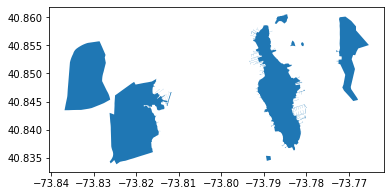

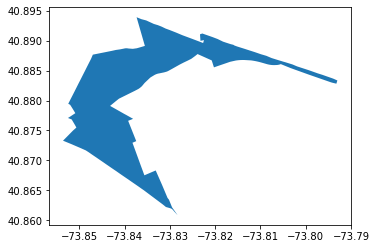

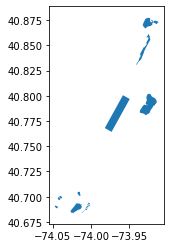

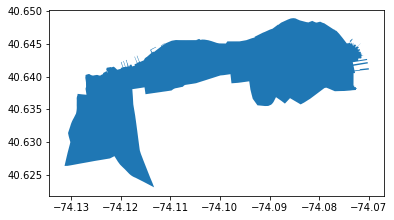

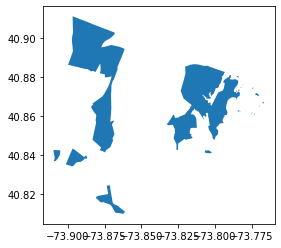

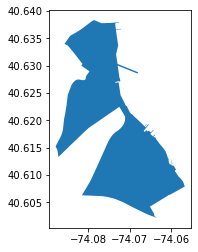

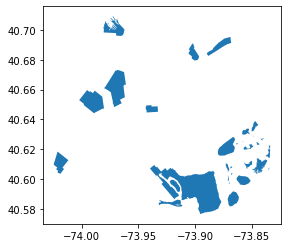

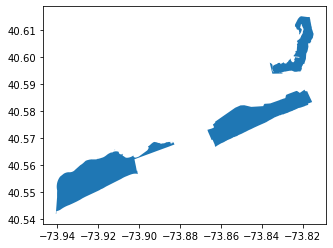

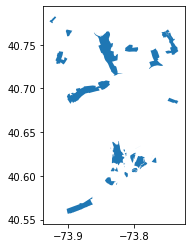

In [1289]:
for i in range(len(multi_shapes)):
    multi_shapes.iloc[[i]].plot()

# 5. Making Maps

GeoPandas has three basic classes of geometric objects (which are actually shapely objects):

- Points / Multi-Points

- Lines / Multi-Lines

- Polygons / Multi-Polygons

## 5.1 Points

In [1290]:
zipfile = 'https://data.cityofnewyork.us/download/jfju-ynrr/application%2Fzip'
school_points = gpd.read_file(zipfile)

school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,STATE_CODE,ZIP,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.000,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,NY,11220,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759)
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.000,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,NY,11226,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911)
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.000,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,NY,11223,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361)
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.000,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,NY,11204,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993)
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.000,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,NY,11223,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591)


<AxesSubplot:>

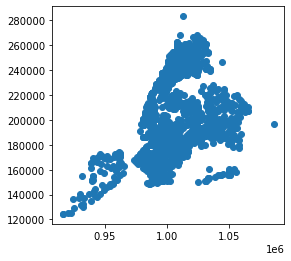

In [1291]:
school_points.plot()

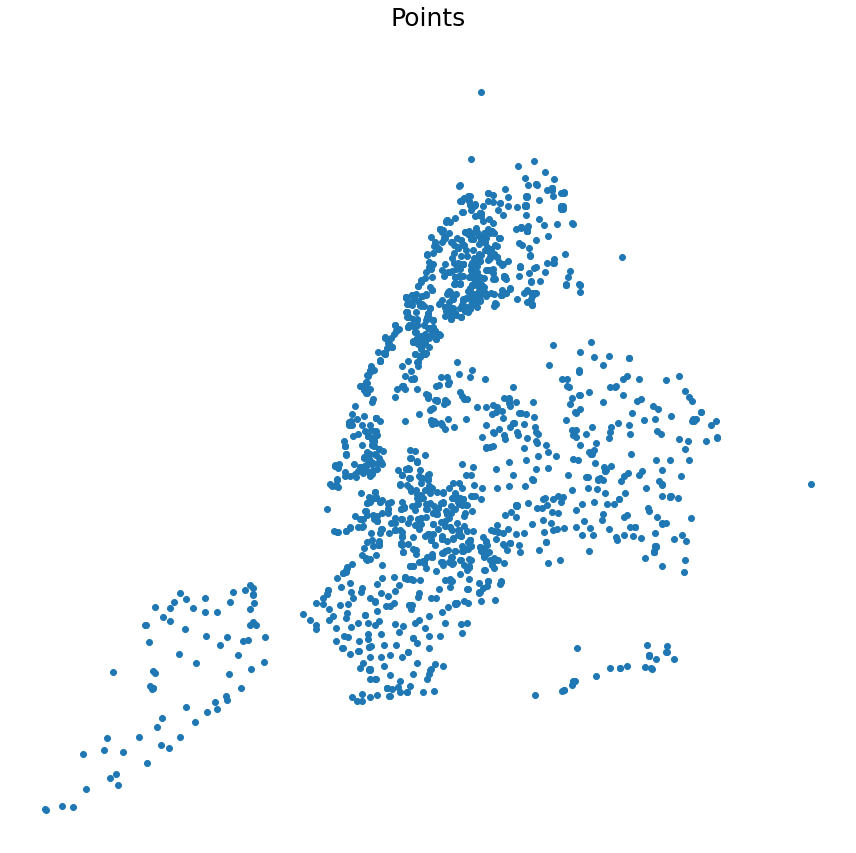

In [1292]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

school_points = school_points.to_crs(epsg=2263) # converting to more accurate coordinate referance system
school_points.plot(ax=ax, 
                   color='#1f77b4') # plotting geodataframe as color blue

plt.axis('off') # turning off figure axis
ax.set_title('Points', pad=30, fontsize=25)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/5-1-a')

## 5.2 Lines

In [1293]:
url = 'https://data.cityofnewyork.us/api/geospatial/exjm-f27b?method=export&format=GeoJSON'
streets = gpd.read_file(url)

streets.head()

,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,bike_trafd,...,snow_pri,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry
0,6,None,None,0,10458,None,None,TRL,0,None,...,None,2,NV,None,MITSUBISHI WILD WETLAND TRL,164809,MITSUBISHI WILD WETLAND,2014-08-19T00:00:00,None,"MULTILINESTRING ((-73.87862 40.86192, -73.8786..."
1,1,215-001,None,35,11360,215-000,None,AVE,112262650,None,...,S,4,TW,None,28 AVE,6110,28,2007-11-29T00:00:00,215-027,"MULTILINESTRING ((-73.77290 40.77780, -73.7720..."
2,1,5631,None,42,10471,5602,None,AVE,1522601877,None,...,H,2,TW,None,ARLINGTON AVE,61140,ARLINGTON,2007-11-29T00:00:00,5699,"MULTILINESTRING ((-73.90711 40.90519, -73.9067..."
3,1,317,None,50,11217,316,2,ST,1922612977,TW,...,C,3,TW,None,SCHERMERHORN ST,145494,SCHERMERHORN,2007-11-29T00:00:00,399,"MULTILINESTRING ((-73.98182 40.68733, -73.9805..."
4,1,120-011,None,40,11415,0,None,BLVD,92269521,None,...,C,4,TF,None,QUEENS BLVD,12438,QUEENS,2007-11-29T00:00:00,120-011,"MULTILINESTRING ((-73.83002 40.71401, -73.8298..."


<AxesSubplot:>

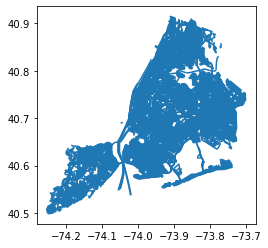

In [1294]:
streets.plot()

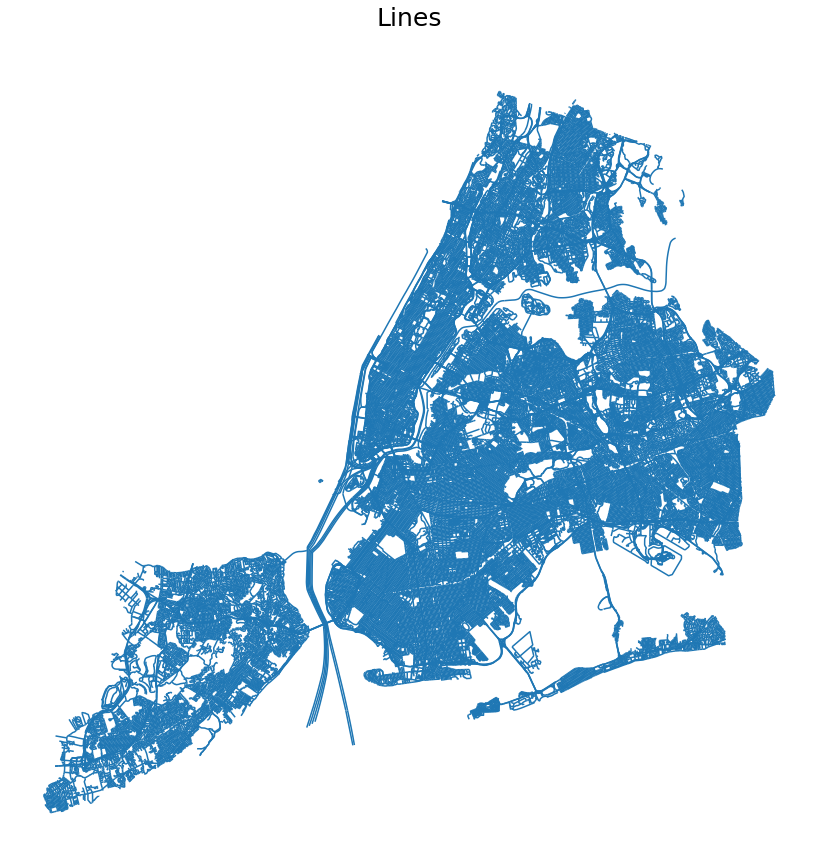

In [1295]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

streets = streets.to_crs(epsg=2263) # converting to more accurate coordinate referance system
streets.plot(ax=ax, color='#1f77b4') # plotting geodataframe as color blue

plt.axis('off') # turning off figure axis
ax.set_title('Lines', pad=30, fontsize=25)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/5-2-a')

## 5.3 Polygons

In [1296]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


<AxesSubplot:>

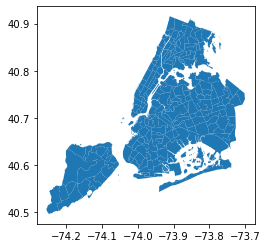

In [1297]:
nta_shape.plot()

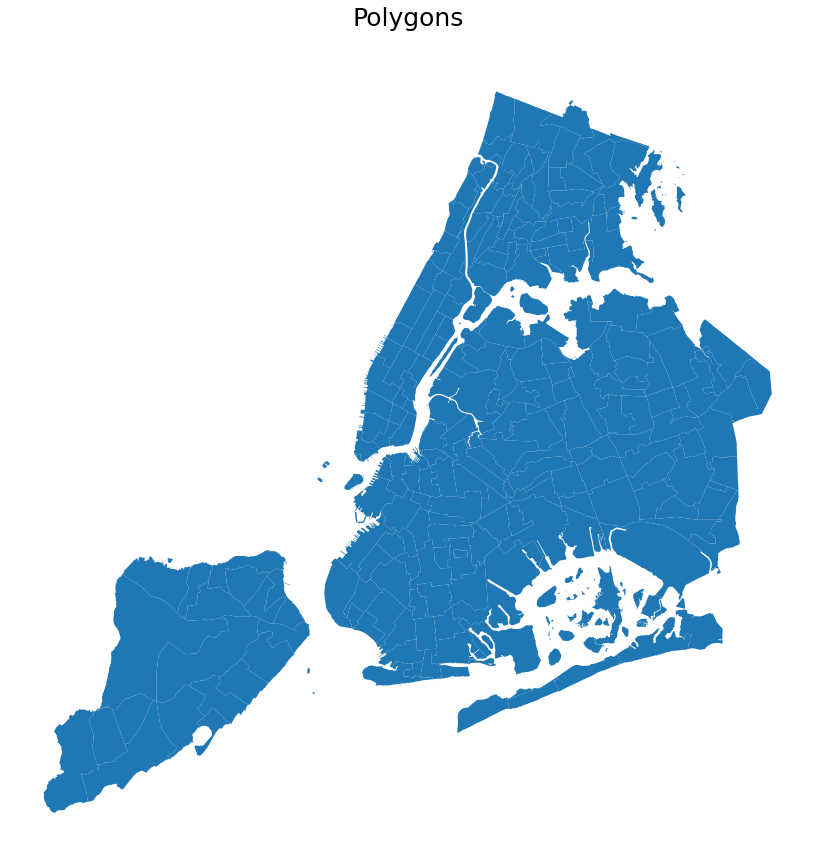

In [1298]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape = nta_shape.to_crs(epsg=2263) # converting to more accurate coordinate referance system
nta_shape.plot(ax=ax, 
               color='#1f77b4') # plotting geodataframe as color blue
plt.axis('off') # turning off figure axis
ax.set_title('Polygons', pad=30, fontsize=25)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/5-3-a')

## 5.4 Maps with Layers

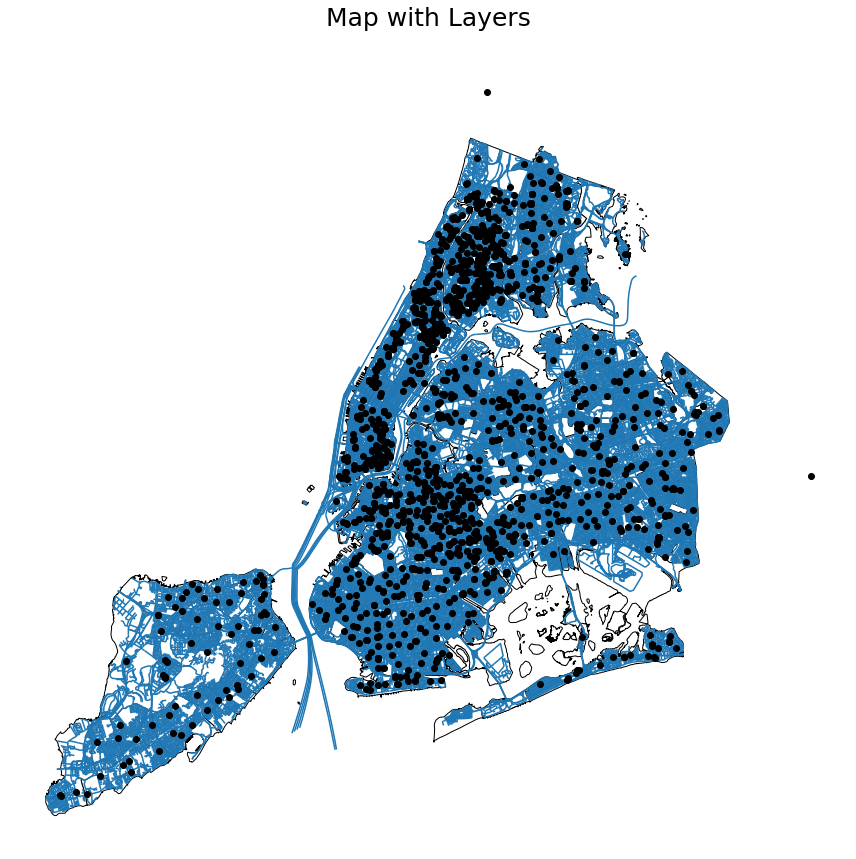

In [1299]:
fig, ax = plt.subplots(figsize=(12,12))

nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black', 
               zorder=1)
streets.plot(ax=ax, 
             zorder=2)
school_points.plot(ax=ax, 
                   color='black', 
                   zorder=3)

plt.axis('off')
ax.set_title('Map with Layers', pad=30, fontsize=25)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/5-4-a')

## 5.5 Adding Background Map

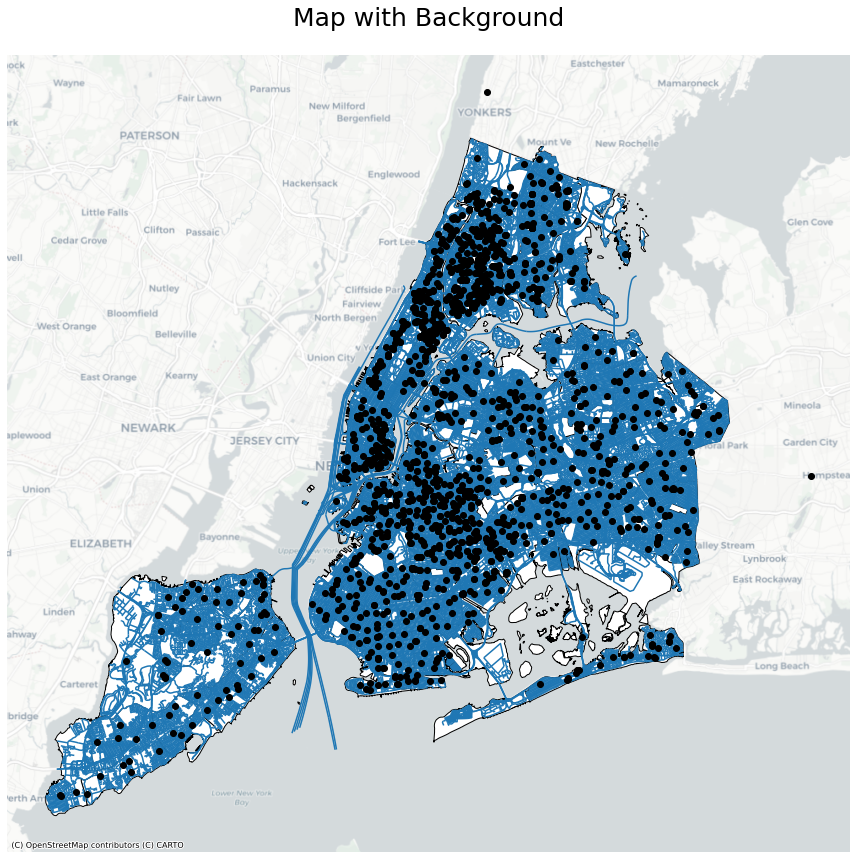

In [1300]:
fig, ax = plt.subplots(figsize=(12,12))

nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black', 
               zorder=1)
streets.plot(ax=ax, 
             zorder=2)
school_points.plot(ax=ax, 
                   color='black', 
                   zorder=3)

ctx.add_basemap(ax, 
                crs=2263, 
                source=ctx.providers.CartoDB.Positron)

plt.axis('off')
ax.set_title('Map with Background', pad=30, fontsize=25)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/5-5-a')

## 5.6 Clip Data

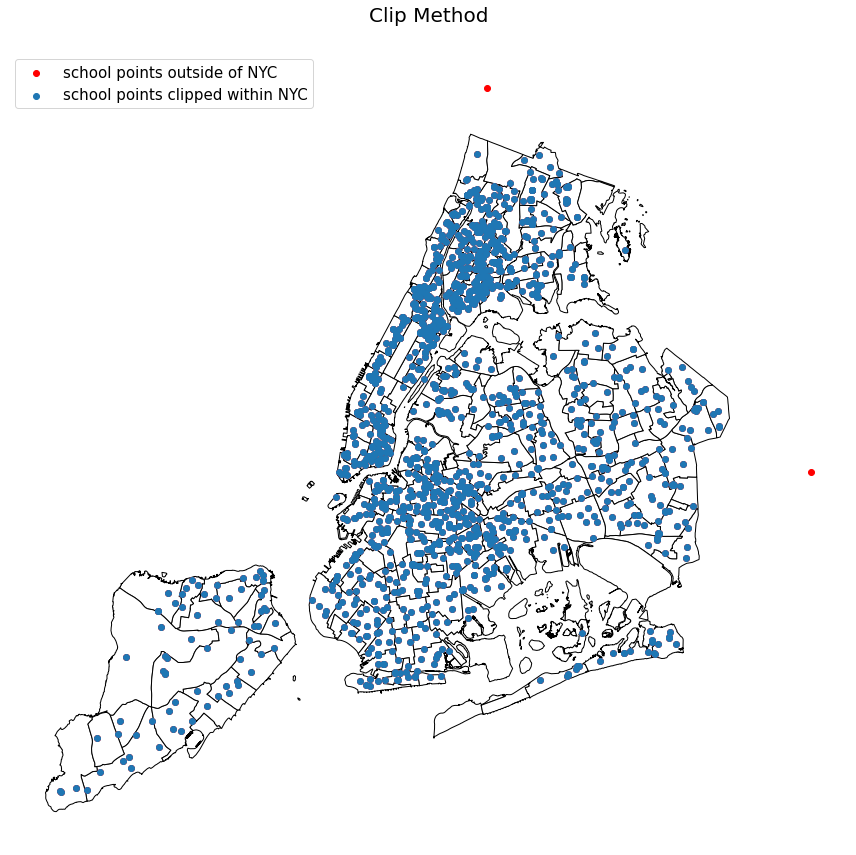

In [1301]:
school_points_clipped = gpd.clip(school_points, nta_shape)

fig, ax = plt.subplots(figsize=(12,12))

nta_shape.plot(ax=ax, 
               color="white", 
               edgecolor='black', 
               zorder=0)    

school_points.plot(ax=ax, 
                   color='red', 
                   zorder=1,
                   label='school points outside of NYC')

school_points_clipped.plot(ax=ax, 
                           color='#1f77b4', 
                           zorder=2, 
                           label='school points clipped within NYC')

plt.legend(loc='upper left', 
           fontsize=15)
plt.axis('off')
ax.set_title('Clip Method', pad=30, fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/5-6-a')

# 6. Types of Maps

In [1302]:
url = 'https://data.cityofnewyork.us/api/views/swpk-hqdp/rows.csv?accessType=DOWNLOAD'
nyc_pop = pd.read_csv(url)

nyc_pop.head()

,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,Bronx,2000,5,BX01,Claremont-Bathgate,28149
1,Bronx,2000,5,BX03,Eastchester-Edenwald-Baychester,35422
2,Bronx,2000,5,BX05,Bedford Park-Fordham North,55329
3,Bronx,2000,5,BX06,Belmont,25967
4,Bronx,2000,5,BX07,Bronxdale,34309


In [1303]:
nyc_pop['Year'].unique()

array([2000, 2010])

In [1304]:
nyc_pop = nyc_pop.loc[nyc_pop['Year'] == 2010]

In [1305]:
nyc_pop['Year'].unique()

array([2010])

In [1306]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [1307]:
nta_pop = nta_shape.merge(nyc_pop, 
                          left_on='ntacode', 
                          right_on='NTA Code', 
                          how='inner')

In [1308]:
nta_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ...",Brooklyn,2010,47,BK88,Borough Park,106357
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ...",Queens,2010,81,QN51,Murray Hill,51739
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ...",Queens,2010,81,QN27,East Elmhurst,23150
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ...",Brooklyn,2010,47,BK95,Erasmus,29938
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ...",Queens,2010,81,QN07,Hollis,20269


In [1309]:
nta_pop.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [1310]:
nta_pop.to_crs(epsg=2263, inplace=True)
nta_pop.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [1311]:
nta_pop['sq_ft'] = nta_pop.area
nta_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population,sq_ft
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",Brooklyn,2010,47,BK88,Borough Park,106357,54005019.048
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",Queens,2010,81,QN51,Murray Hill,51739,52488277.591
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",Queens,2010,81,QN27,East Elmhurst,23150,19726946.569
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....",Brooklyn,2010,47,BK95,Erasmus,29938,14522603.592
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...",Queens,2010,81,QN07,Hollis,20269,22887772.809


In [1312]:
nta_pop['sq_mi'] = nta_pop['sq_ft'] / 27878400

nta_pop.head()   

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population,sq_ft,sq_mi
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",Brooklyn,2010,47,BK88,Borough Park,106357,54005019.048,1.937
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",Queens,2010,81,QN51,Murray Hill,51739,52488277.591,1.883
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",Queens,2010,81,QN27,East Elmhurst,23150,19726946.569,0.708
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....",Brooklyn,2010,47,BK95,Erasmus,29938,14522603.592,0.521
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...",Queens,2010,81,QN07,Hollis,20269,22887772.809,0.821


In [1313]:
nta_pop['density (pop/sq_mi)'] = nta_pop['Population'] / nta_pop['sq_mi']

In [1314]:
nta_pop.sort_values(by='density (pop/sq_mi)', ascending=False).iloc[:5,-6:]

,NTA Code,NTA Name,Population,sq_ft,sq_mi,density (pop/sq_mi)
79,MN32,Yorkville,77942,13602039.796,0.488,159747.971
90,BX40,Fordham South,28262,6308875.236,0.226,124887.450
126,MN22,East Village,44136,10894242.599,0.391,112944.158
61,MN14,Lincoln Square,61489,15805523.623,0.567,108456.700
87,MN12,Upper West Side,132378,34379942.456,1.233,107344.183


## 6.1 Choropleth Maps

<AxesSubplot:>

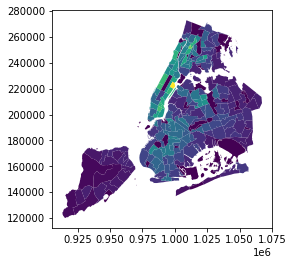

In [1315]:
nta_pop.plot(column='density (pop/sq_mi)')

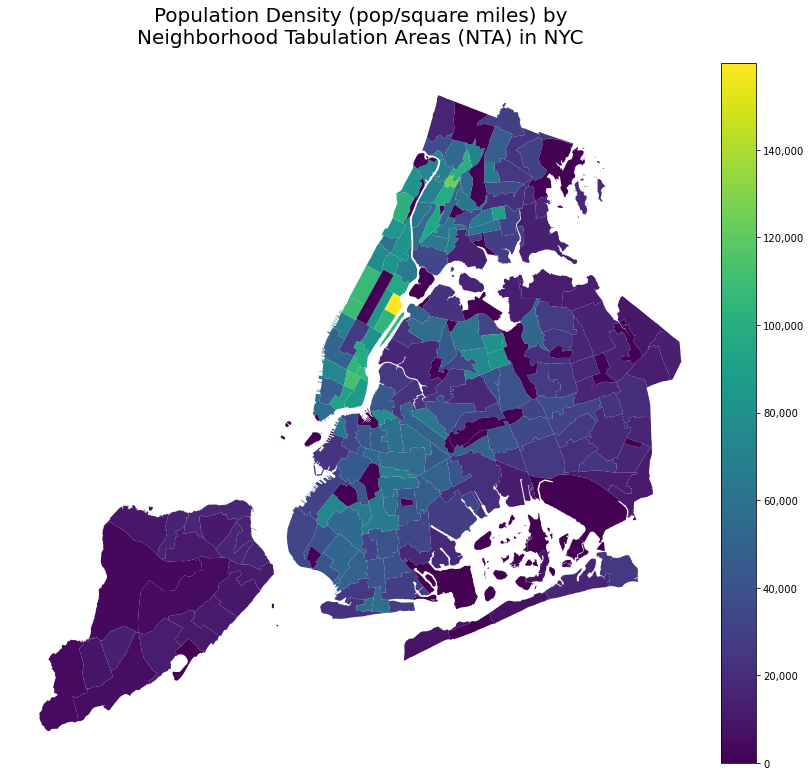

In [1316]:
fig, ax = plt.subplots(figsize=(12,12))

comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

nta_pop.plot(column='density (pop/sq_mi)', 
             ax=ax, 
             cax=cax,
             legend=True,
             legend_kwds={'format':comma_fmt})

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)

ax.set_aspect('equal', 'box')
fig.tight_layout()
ax.axis('off')
plt.savefig('figures/6-1-a')

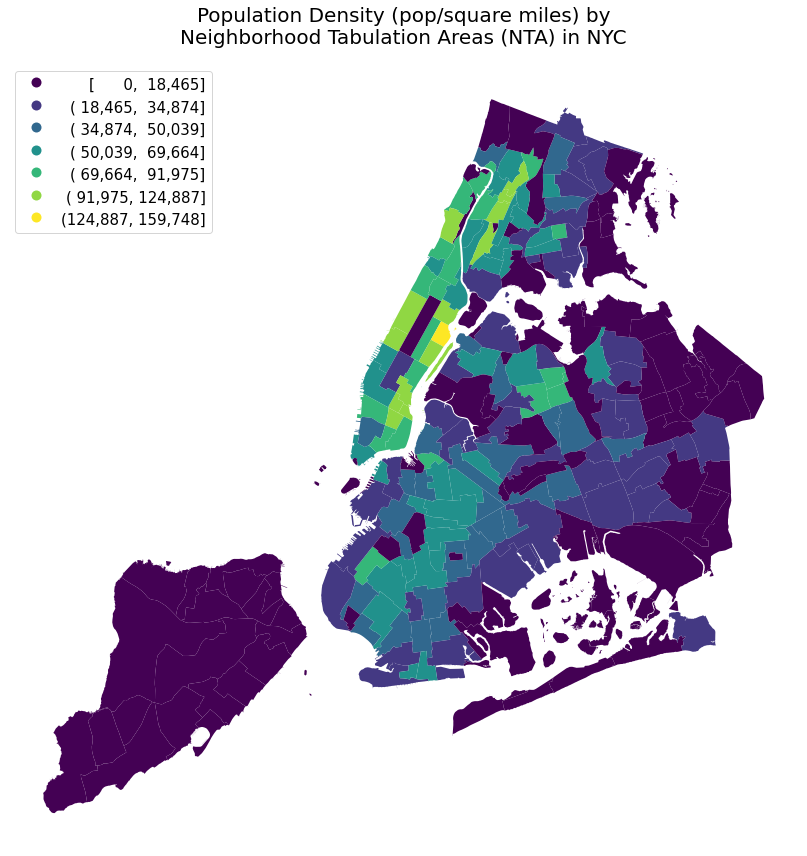

In [1317]:
fig, ax = plt.subplots(figsize=(12,12))

nta_pop.plot(column='density (pop/sq_mi)', 
             ax=ax, 
             legend=True, 
             scheme='fisher_jenks',
             k=7,
             legend_kwds={'loc': "upper left", 
                          'fmt': "{:,.0f}",
                          'fontsize': "15"})

leg = ax.get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(185)  # need to adapt this manually
        row.mode= "expand"
        row.align="right"     
        
ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/6-1-b')

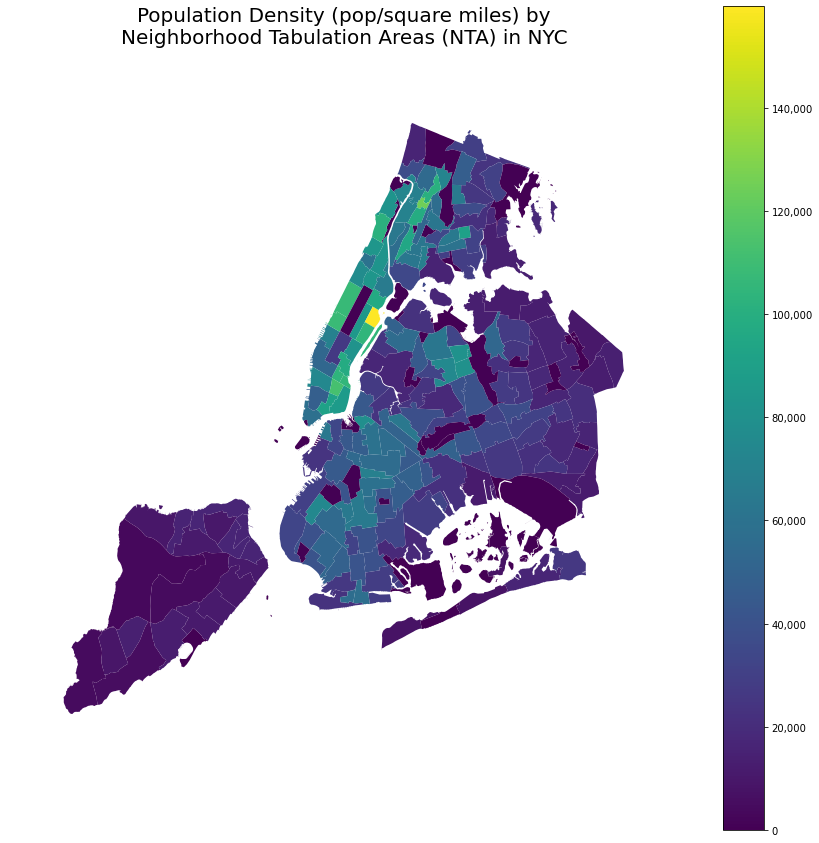

In [1318]:
comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))

ax = gplt.choropleth(nta_pop.to_crs(4326), 
                     hue='density (pop/sq_mi)', 
                     projection=gcrs.AlbersEqualArea(),
                     edgecolor='None', 
                     linewidth=1,
                     cmap='viridis',
                     legend=True,
                     legend_kwargs={'format': comma_fmt},
                     figsize=(12,12),
                     zorder=0)

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=1,
              edgecolor='None')

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-1-c')

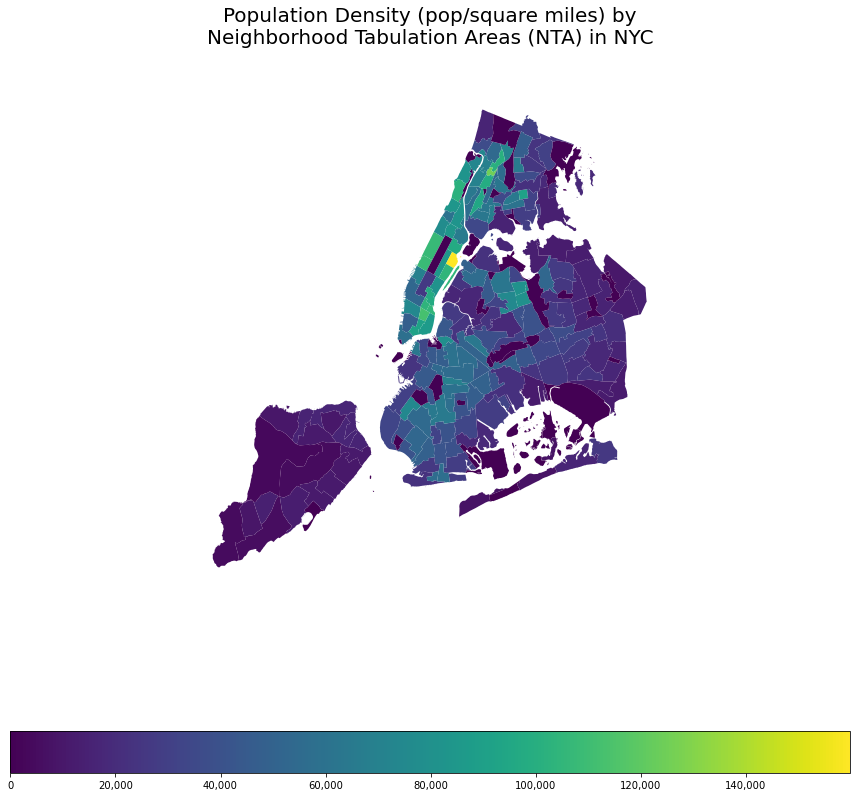

In [1319]:
comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))

ax = gplt.choropleth(nta_pop.to_crs(4326), 
                     hue='density (pop/sq_mi)', 
                     projection=gcrs.AlbersEqualArea(),
                     edgecolor='None', 
                     linewidth=1,
                     cmap='viridis',
                     legend=True,
                     legend_kwargs={'format': comma_fmt,
                                    'orientation': 'horizontal'},
                     figsize=(12,12),
                     zorder=0)

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=1,
              edgecolor='None')

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-1-d')

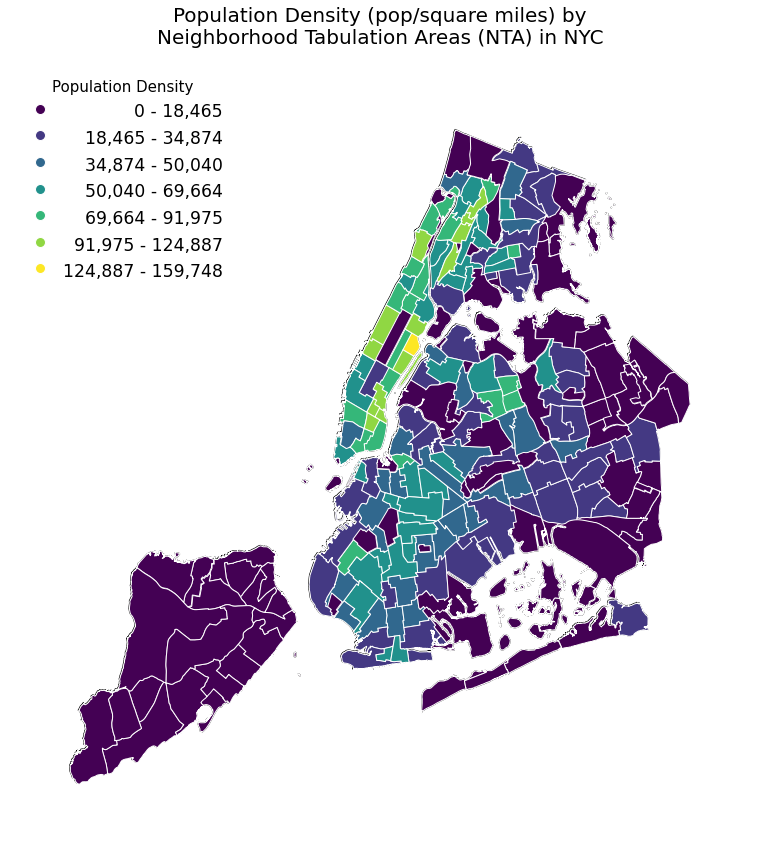

In [1320]:
scheme = mc.FisherJenks(nta_pop['density (pop/sq_mi)'], k=7)

ax = gplt.choropleth(nta_pop.to_crs(4326), 
                     hue='density (pop/sq_mi)', 
                     projection=gcrs.AlbersEqualArea(),
                     edgecolor='white', 
                     cmap='viridis',
                     legend=True, 
                     legend_kwargs={'frameon': False, 
                              'loc': 'upper left', 
                              'fontsize':'xx-large', 
                              'title':'Population Density',
                              'title_fontsize':'15'},
                     scheme=scheme, 
                     figsize=(12,12),
                     zorder=1)

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=0)

leg = ax.get_legend()

for lbl in leg.get_texts():
    label_text = lbl.get_text()
    lower = label_text.split()[0]
    upper = label_text.split()[2]
    new_text = f'{float(lower):,.0f} - {float(upper):,.0f}'
    lbl.set_text(new_text)
    
hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(200)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-1-e')

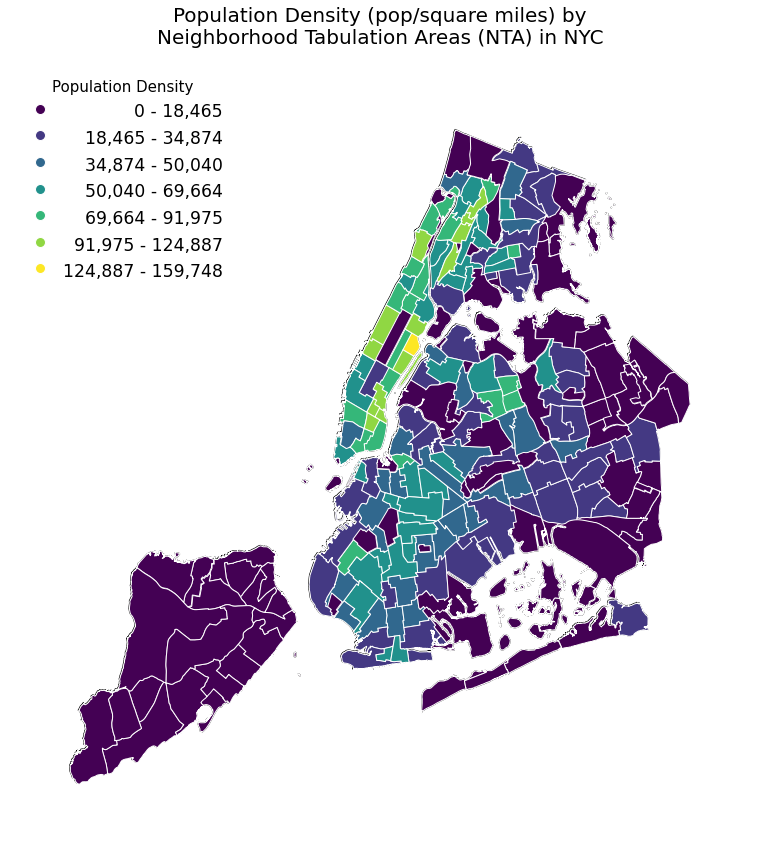

In [1321]:
scheme = mc.FisherJenks(nta_pop['density (pop/sq_mi)'], k=7)

ax = gplt.choropleth(nta_pop.to_crs(4326), 
                     hue='density (pop/sq_mi)', 
                     projection=gcrs.AlbersEqualArea(),
                     edgecolor='white',
                     cmap='viridis',
                     legend=True, 
                     legend_kwargs={'frameon': False, 
                                    'loc': 'upper left', 
                                    'fontsize':'xx-large', 
                                    'title':'Population Density',
                                    'title_fontsize':'15'},
                     scheme=scheme, 
                     figsize=(12,12),
                     zorder=1)

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=0)

leg = ax.get_legend()

for lbl in leg.get_texts():
    label_text = lbl.get_text()
    lower = label_text.split()[0]
    upper = label_text.split()[2]
    new_text = f'{float(lower):,.0f} - {float(upper):,.0f}'
    lbl.set_text(new_text)
    
hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(200)  # need to adapt this manually
        row.mode= "expand"
        row.align="right"    

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-1-f')

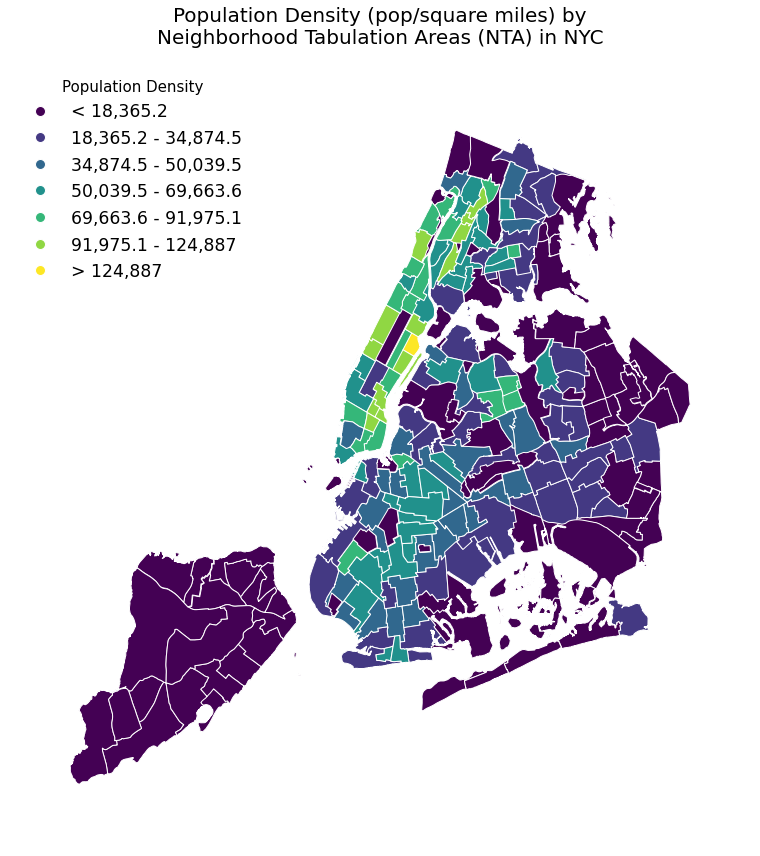

In [1322]:
scheme = mc.FisherJenks(nta_pop['density (pop/sq_mi)'], k=7)

ax = gplt.choropleth(nta_pop.to_crs(4326), 
                     hue='density (pop/sq_mi)', 
                     projection=gcrs.AlbersEqualArea(),
                     edgecolor='white', 
                     linewidth=1,
                     cmap='viridis',
                     legend=True, 
                     legend_kwargs={'frameon': False, 
                                    'loc': 'upper left', 
                                    'fontsize':'xx-large', 
                                    'title':'Population Density',
                                    'title_fontsize':'15'},
                     scheme=scheme, 
                     figsize=(12,12),
                     legend_labels=[
                                    '< 18,365.2', 
                                    '18,365.2 - 34,874.5', 
                                    '34,874.5 - 50,039.5',
                                    '50,039.5 - 69,663.6', 
                                    '69,663.6 - 91,975.1',
                                    '91,975.1 - 124,887',
                                    '> 124,887',
                                    ])

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=0,
              edgecolor='None')

ax.set_title('Population Density (pop/square miles) by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20, 
             pad=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-1-g')

## 6.2 Heat Maps

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:1678: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


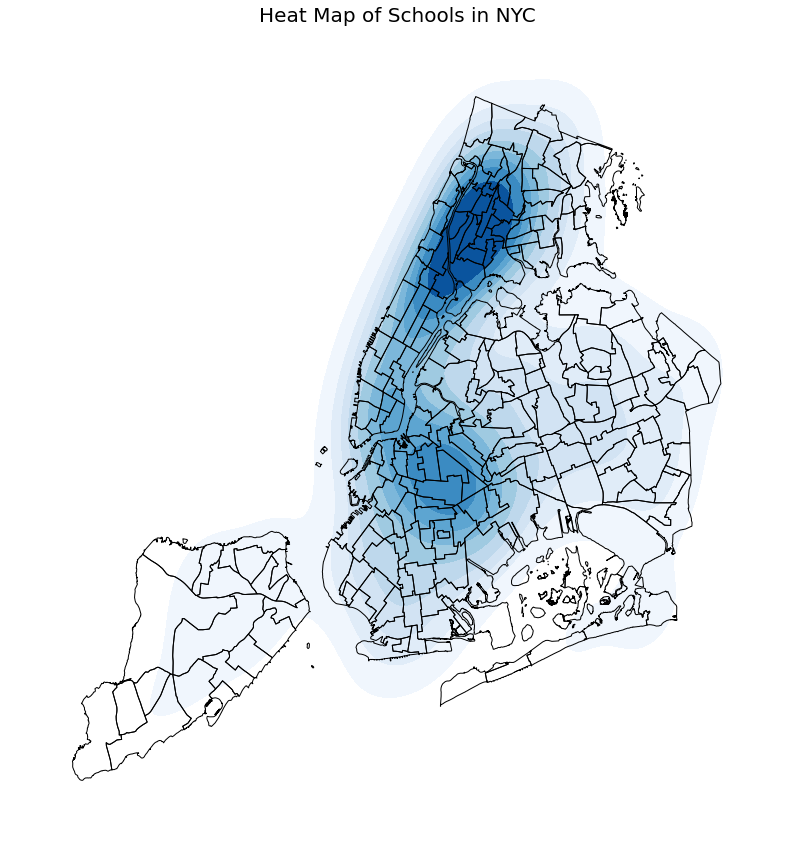

In [1323]:
ax = gplt.kdeplot(school_points.to_crs(4326),
                  shade=True, 
                  cmap='Blues',
                  projection=gplt.crs.AlbersEqualArea(), 
                  figsize=(12,12))

gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=1)

ax.set_title('Heat Map of Schools in NYC', fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-2-a')

## 6.3 Hexbin Map

/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:298: MatplotlibDeprecationWarning: 
The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.
  layout[ax.rowNum, ax.colNum] = ax.get_visible()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:304: MatplotlibDeprecationWarning: 
The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.
  if not layout[ax.rowNum + 1, ax.colNum]:
/Users/geribauer/anaconda3/li

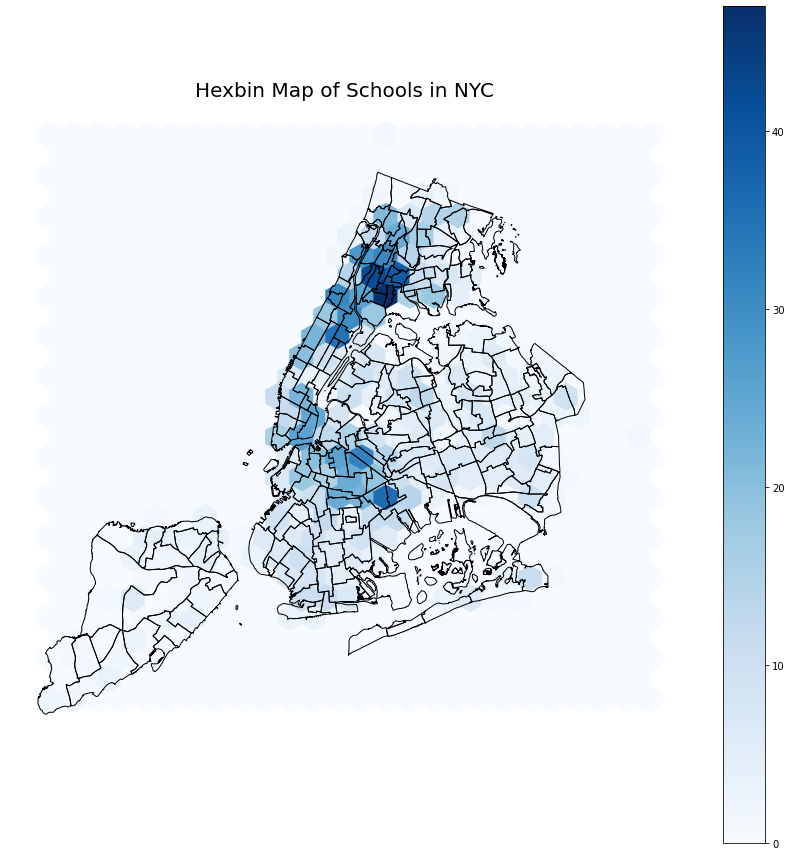

In [1324]:
fig, ax = plt.subplots(figsize=(12,12))

school_points['x'] = school_points['geometry'].x
school_points['y'] = school_points['geometry'].y
df = pd.DataFrame(school_points)

df.plot.hexbin(x='x', 
               y='y', 
               gridsize=25, 
               ax=ax,
               cmap='Blues')

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black')

ax.set_title('Hexbin Map of Schools in NYC', fontsize=20, pad=10)
plt.axis('off')
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/6-3-a')

## 6.4 Proportional Symbol Map

In [1325]:
nta_pop['centroid'] = nta_pop.centroid
nta_pop = nta_pop.set_geometry('centroid')

nta_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population,sq_ft,sq_mi,density (pop/sq_mi),centroid
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",Brooklyn,2010,47,BK88,Borough Park,106357,54005019.048,1.937,54903.471,POINT (987397.463 169148.408)
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",Queens,2010,81,QN51,Murray Hill,51739,52488277.591,1.883,27480.432,POINT (1037005.224 219265.318)
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",Queens,2010,81,QN27,East Elmhurst,23150,19726946.569,0.708,32715.908,POINT (1020706.745 217413.871)
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....",Brooklyn,2010,47,BK95,Erasmus,29938,14522603.592,0.521,57470.655,POINT (997674.726 174677.650)
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...",Queens,2010,81,QN07,Hollis,20269,22887772.809,0.821,24688.610,POINT (1050471.492 198271.804)


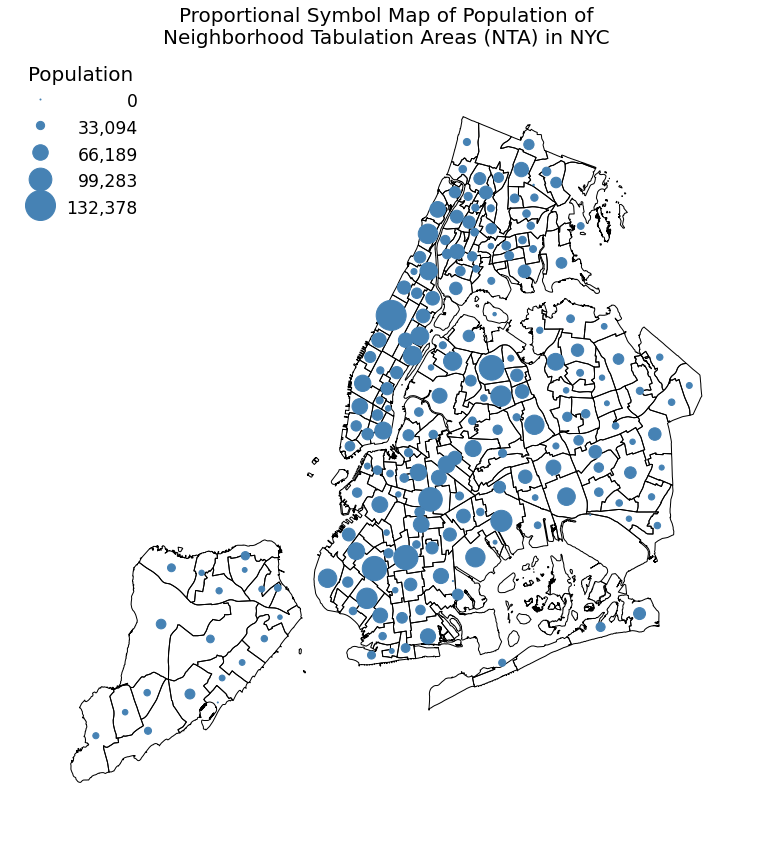

In [1326]:
ax = gplt.pointplot(nta_pop.set_geometry('centroid').to_crs(4326), 
                    projection=gcrs.AlbersEqualArea(),
                    figsize=(12,12),
                    scale='Population', 
                    limits=(1, 30), 
                    legend=True,
                    legend_kwargs={'frameon': False, 
                                   'loc': 'upper left', 
                                   'fontsize':'xx-large', 
                                   'title':'Population',
                                   'title_fontsize':'20'})

gplt.polyplot(nta_shape.to_crs(4326), 
              projection=gcrs.AlbersEqualArea(),
              ax=ax)

leg = ax.get_legend()

for lbl in leg.get_texts():
    label_text = lbl.get_text()
    lower = label_text.split()[0]
    new_text = f'{int(lower):,.0f}'
    lbl.set_text(new_text)

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(115)  # need to adapt this manually
        row.mode= "expand"
        row.align="right"

ax.set_title('Proportional Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-4-a')

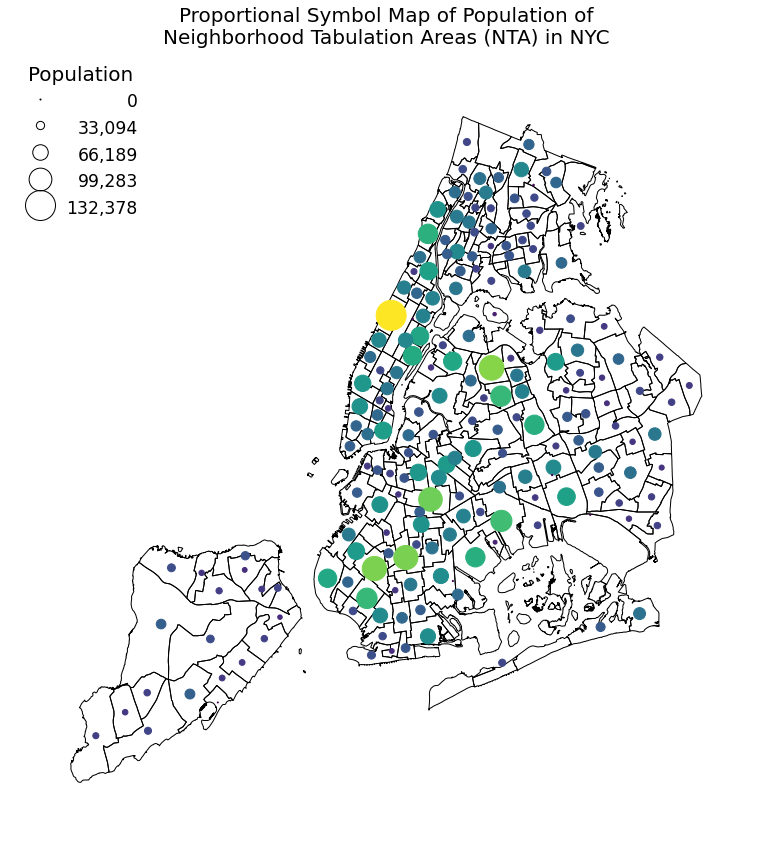

In [1327]:
ax = gplt.pointplot(nta_pop.set_geometry('centroid').to_crs(4326), 
                    projection=gcrs.AlbersEqualArea(),
                    figsize=(12,12),
                    hue='Population', 
                    scale='Population',
                    legend_var='scale',
                    limits=(1, 30),
                    legend=True,
                    legend_kwargs={'frameon': False, 
                                   'loc': 'upper left', 
                                   'fontsize':'xx-large', 
                                   'title':'Population',
                                   'title_fontsize':'20'})

gplt.polyplot(nta_shape.to_crs(4326), 
              projection=gcrs.AlbersEqualArea(),
              ax=ax)

leg = ax.get_legend()

for lbl in leg.get_texts():
    label_text = lbl.get_text()
    lower = label_text.split()[0]
    new_text = f'{int(lower):,.0f}'
    lbl.set_text(new_text) 

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(115)  # need to adapt this manually
        row.mode= "expand"
        row.align="right"
        
ax.set_title('Proportional Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-4-b')

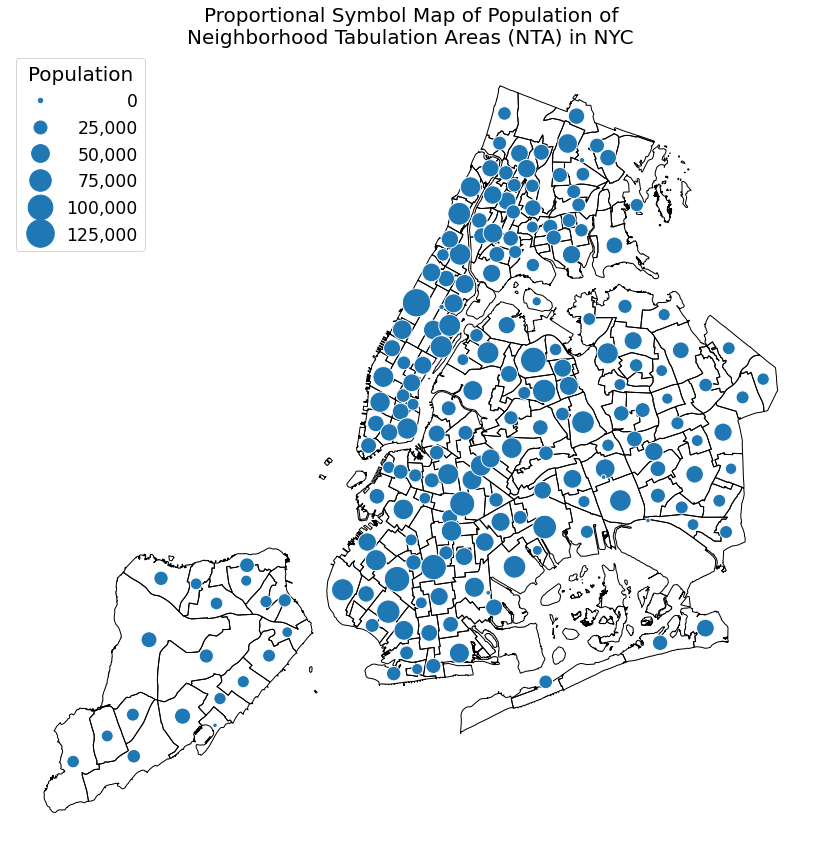

In [1328]:
fig, ax = plt.subplots(figsize=(12,12))

ax = sns.scatterplot(x=nta_pop['centroid'].x,
                     y=nta_pop['centroid'].y, 
                     data=nta_pop, 
                     size="Population",
                     sizes=(20, 800))

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black',
                                 zorder=0)

current_handles, current_labels = plt.gca().get_legend_handles_labels()
       
for i in range(len(current_labels)):
    current_labels[i] = int(current_labels[i])
    current_labels[i] = "{:,}".format((current_labels[i])) 
    
    
leg = ax.legend(current_handles, current_labels, 
                loc='upper left', 
                fontsize='xx-large', 
                title='Population',
                title_fontsize=20)

for i in range(len(current_handles)):
    leg.legendHandles[i].set_color('#1f77b4')

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(115)  # need to adapt this manually
        row.mode= "expand"
        row.align="right"
        
ax.set_title('Proportional Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-4-c')

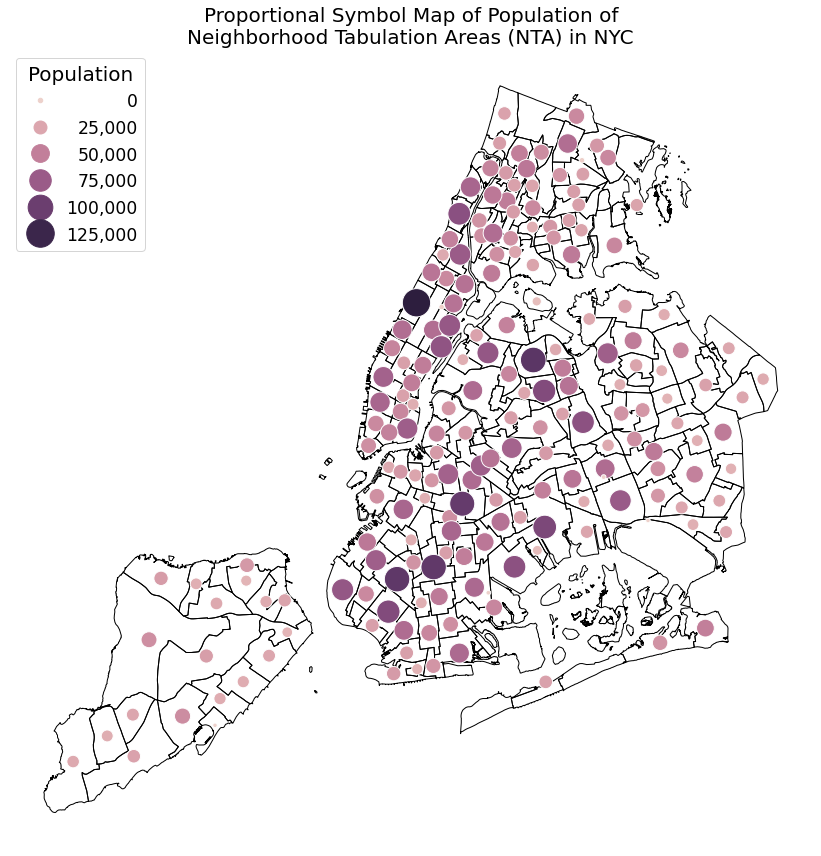

In [1329]:
fig, ax = plt.subplots(figsize=(12,12))

ax = sns.scatterplot(x=nta_pop['centroid'].x,
                     y=nta_pop['centroid'].y, 
                     data=nta_pop, 
                     size="Population",
                     hue='Population',
                     sizes=(20, 800))

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black',
                                 zorder=0)

current_handles, current_labels = plt.gca().get_legend_handles_labels()
       
for i in range(len(current_labels)):
    current_labels[i] = int(current_labels[i])
    current_labels[i] = "{:,}".format((current_labels[i])) 
    
    
leg = ax.legend(current_handles, current_labels, 
                loc='upper left', 
                fontsize='xx-large', 
                title='Population',  
                title_fontsize=20)

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(115)  # need to adapt this manually
        row.mode= "expand"
        row.align="right"

ax.set_title('Proportional Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-4-d')

## 6.5 Graduated Symbol Map

In [1330]:
nta_pop.loc[(nta_pop['Population'] <= 13354), 'size'] = 100
nta_pop.loc[(nta_pop['Population'].between(13355, 31078)), 'size'] = 200
nta_pop.loc[(nta_pop['Population'].between(31079, 44316)), 'size'] = 300
nta_pop.loc[(nta_pop['Population'].between(44317, 58300)), 'size'] = 400
nta_pop.loc[(nta_pop['Population'].between(58301, 72957)), 'size'] = 500
nta_pop.loc[(nta_pop['Population'].between(72958, 91958)), 'size'] = 600
nta_pop.loc[(nta_pop['Population'] >= 91959), 'size'] = 700

nta_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population,sq_ft,sq_mi,density (pop/sq_mi),centroid,size
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....",Brooklyn,2010,47,BK88,Borough Park,106357,54005019.048,1.937,54903.471,POINT (987397.463 169148.408),700.000
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...",Queens,2010,81,QN51,Murray Hill,51739,52488277.591,1.883,27480.432,POINT (1037005.224 219265.318),400.000
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...",Queens,2010,81,QN27,East Elmhurst,23150,19726946.569,0.708,32715.908,POINT (1020706.745 217413.871),200.000
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....",Brooklyn,2010,47,BK95,Erasmus,29938,14522603.592,0.521,57470.655,POINT (997674.726 174677.650),200.000
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...",Queens,2010,81,QN07,Hollis,20269,22887772.809,0.821,24688.610,POINT (1050471.492 198271.804),200.000


In [1331]:
nta_pop['size'].describe()

count   195.000
mean    323.590
std     143.079
min     100.000
25%     200.000
50%     300.000
75%     400.000
max     700.000
Name: size, dtype: float64

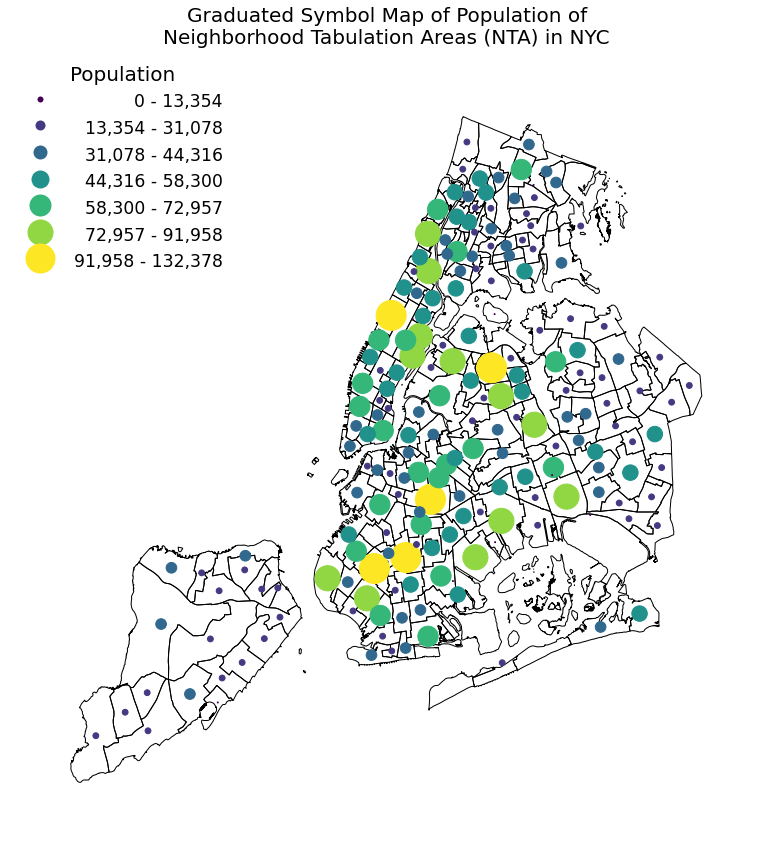

In [1332]:
scheme = mc.FisherJenks(nta_pop['Population'], k=7)

ax = gplt.pointplot(nta_pop.set_geometry('centroid').to_crs(4326), 
                    projection=gcrs.AlbersEqualArea(),
                    figsize=(12,12),
                    limits=(1, 30),
                    hue='Population',
                    scale='size',
                    scheme=scheme,    
                    legend=True,
                    legend_var='hue',
                    legend_kwargs={'frameon': False, 
                                  'loc': 'upper left', 
                                  'fontsize':'xx-large', 
                                  'title':'Population',
                                  'title_fontsize':'20'})

gplt.polyplot(nta_shape.to_crs(4326), 
              projection=gcrs.AlbersEqualArea(),
              ax=ax,
              zorder=0)

leg = ax.get_legend()

for lbl in leg.get_texts():
    label_text = lbl.get_text()
    lower = label_text.split()[0]
    upper = label_text.split()[2]
    new_text = f'{float(lower):,.0f} - {float(upper):,.0f}'
    lbl.set_text(new_text)
    
hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(200)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 
            
#change the marker size manually
leg.legendHandles[0]._legmarker.set_markersize(6)
leg.legendHandles[1]._legmarker.set_markersize(10) 
leg.legendHandles[2]._legmarker.set_markersize(14)
leg.legendHandles[3]._legmarker.set_markersize(18) 
leg.legendHandles[4]._legmarker.set_markersize(22)
leg.legendHandles[5]._legmarker.set_markersize(26) 
leg.legendHandles[6]._legmarker.set_markersize(30)

ax.set_title('Graduated Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-5-a')

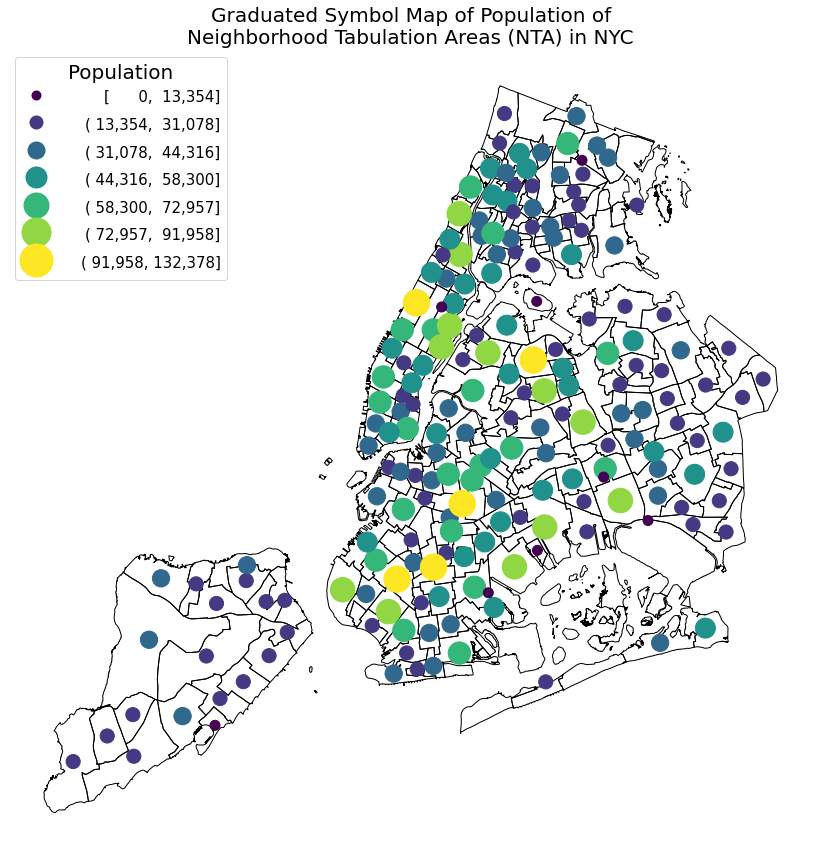

In [1333]:
ax = nta_pop.set_geometry('centroid').plot(column='Population',  
                                           legend=True, 
                                           figsize=(12,12),
                                           markersize=nta_pop['size'],
                                           scheme='fisher_jenks',
                                           k=7,
                                           legend_kwds={'loc': "upper left", 
                                                        'fmt': "{:,.0f}",
                                                        'fontsize': "15",
                                                        'title':'Population',
                                                        'title_fontsize':'20'})

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black', 
                                 zorder=0)

leg = ax.get_legend()

#change the marker size manually
leg.legendHandles[0]._legmarker.set_markersize(10)
leg.legendHandles[1]._legmarker.set_markersize(14) 
leg.legendHandles[2]._legmarker.set_markersize(18)
leg.legendHandles[3]._legmarker.set_markersize(22) 
leg.legendHandles[4]._legmarker.set_markersize(26)
leg.legendHandles[5]._legmarker.set_markersize(30) 
leg.legendHandles[6]._legmarker.set_markersize(34)

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(200) # need to adapt this manually
        row.set_height(20)
        row.mode= "expand"
        row.align="right" 

ax.set_title('Graduated Symbol Map of Population of\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-5-b')

## 6.6 One-to-One Dot Density Map

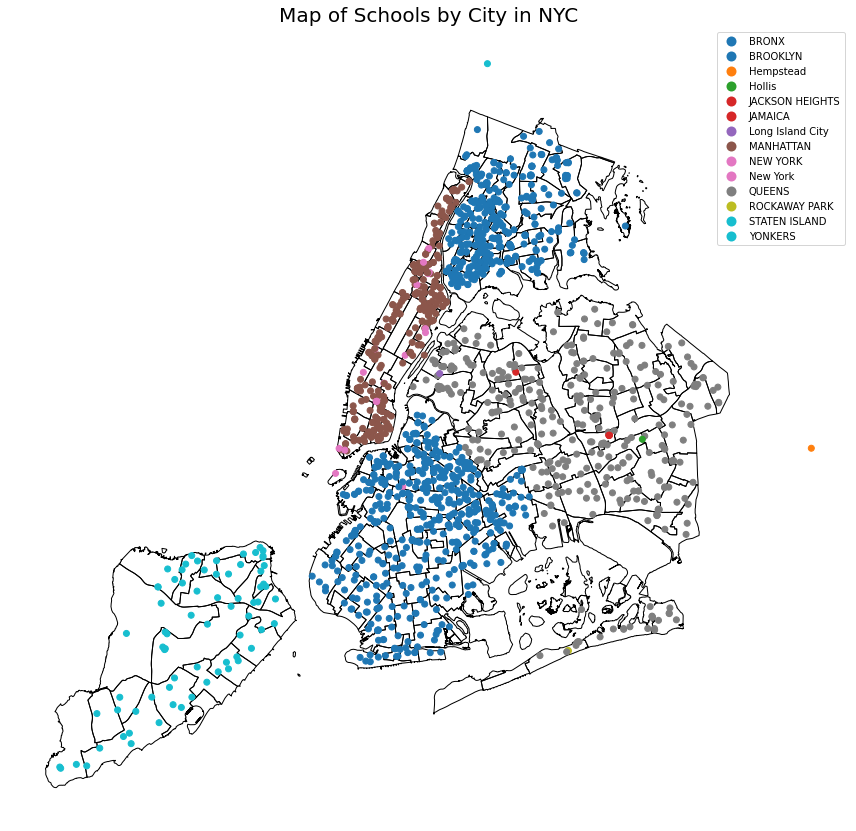

In [1334]:
fig, ax = plt.subplots(figsize=(12,12))

school_points.plot(ax=ax, 
                   column='City',
                   legend=True)

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black',
                                 zorder=0)

ax.set_title('Map of Schools by City in NYC', fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-6-a')

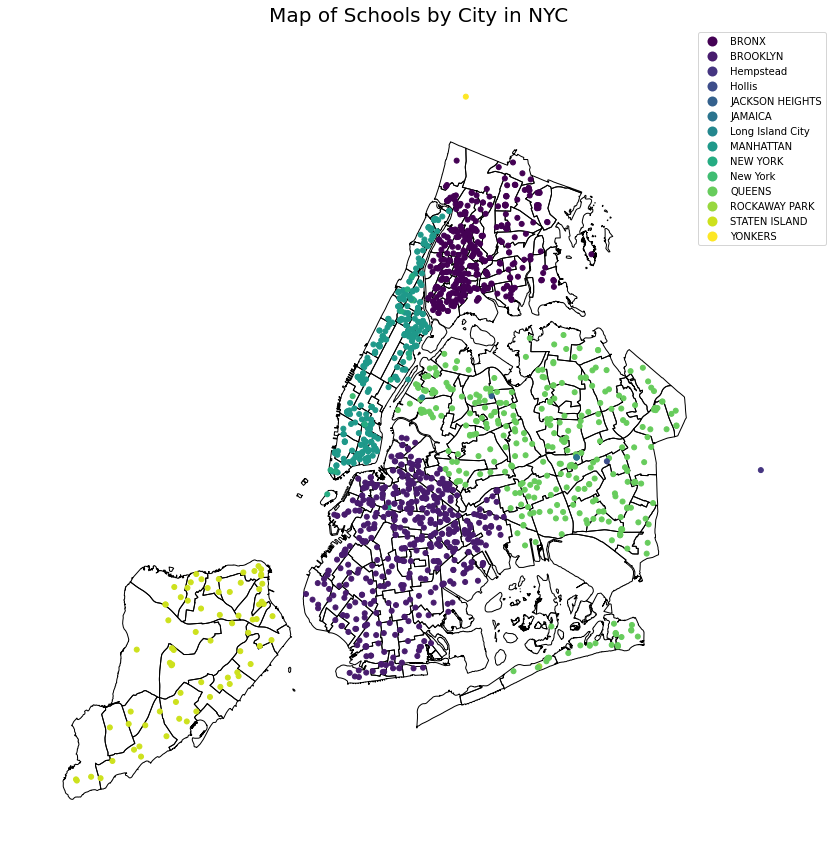

In [1335]:
ax = gplt.polyplot(nta_shape.to_crs(4326), 
                   projection=gcrs.AlbersEqualArea(), 
                   figsize=(12,12))

gplt.pointplot(school_points.to_crs(4326),
               hue='City', 
               ax=ax, 
               legend=True,
               zorder=1)

ax.set_title('Map of Schools by City in NYC', fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-6-b')

## 6.7 One-to-One Dot Density Map with Joint Grids

In [1336]:
school_points['lon'], school_points['lat'] = school_points.to_crs(4326)['geometry'].x, school_points.to_crs(4326)['geometry'].y

school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,...,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry,x,y,lon,lat
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.000,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,...,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759),980985.054,175780.759,-74.012,40.649
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.000,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,...,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911),997785.136,178431.911,-73.951,40.656
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.000,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,...,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361),991224.983,156323.361,-73.975,40.596
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.000,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,...,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993),988439.681,160709.993,-73.985,40.608
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.000,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,...,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591),988205.073,158329.591,-73.986,40.601


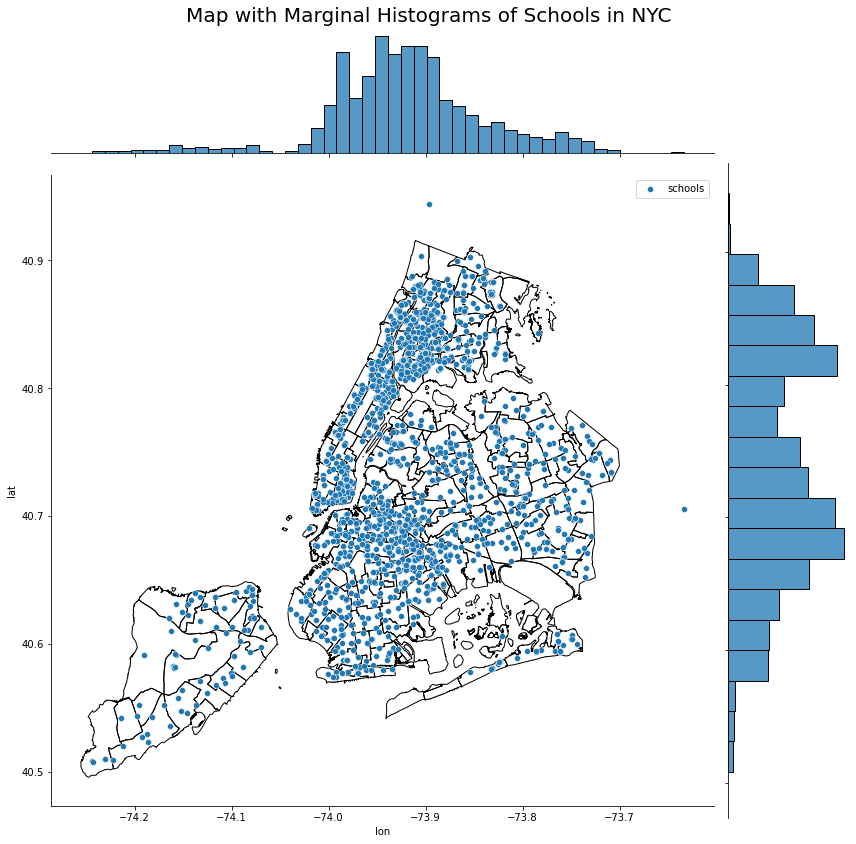

In [1337]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12, 
                  label='schools', 
                  legend=True)

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')


g.fig.suptitle("Map with Marginal Histograms of Schools in NYC", fontsize=20)
g.fig.subplots_adjust(top=0.95)
ax.set_title('Map of Schools by City in NYC', fontsize=25)
plt.tight_layout()
plt.savefig('figures/6-7-a')

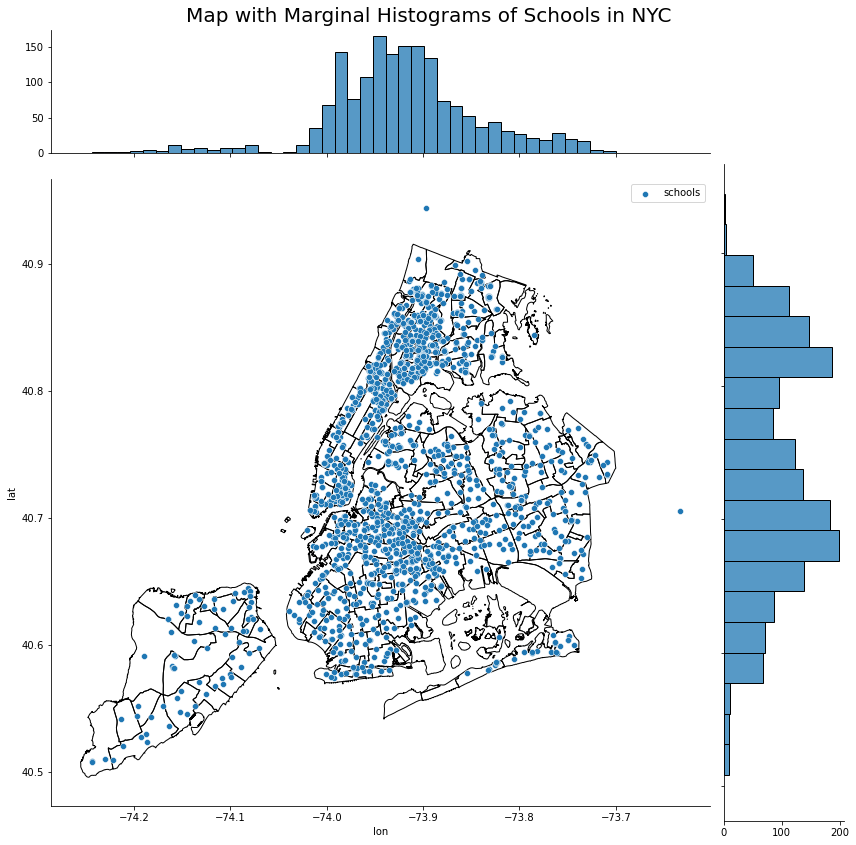

In [1338]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12,
                  marginal_ticks=True,
                  label='schools', 
                  legend=True)

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map with Marginal Histograms of Schools in NYC", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-b')

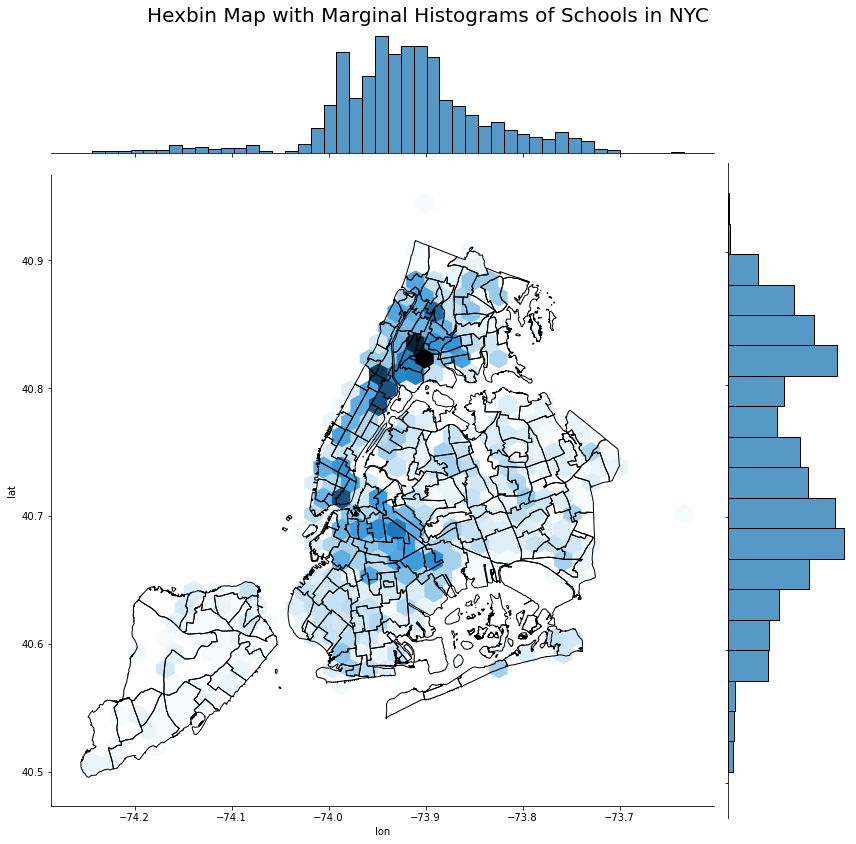

In [1339]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12,
                  kind='hex')

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=1, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Hexbin Map with Marginal Histograms of Schools in NYC", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-c')

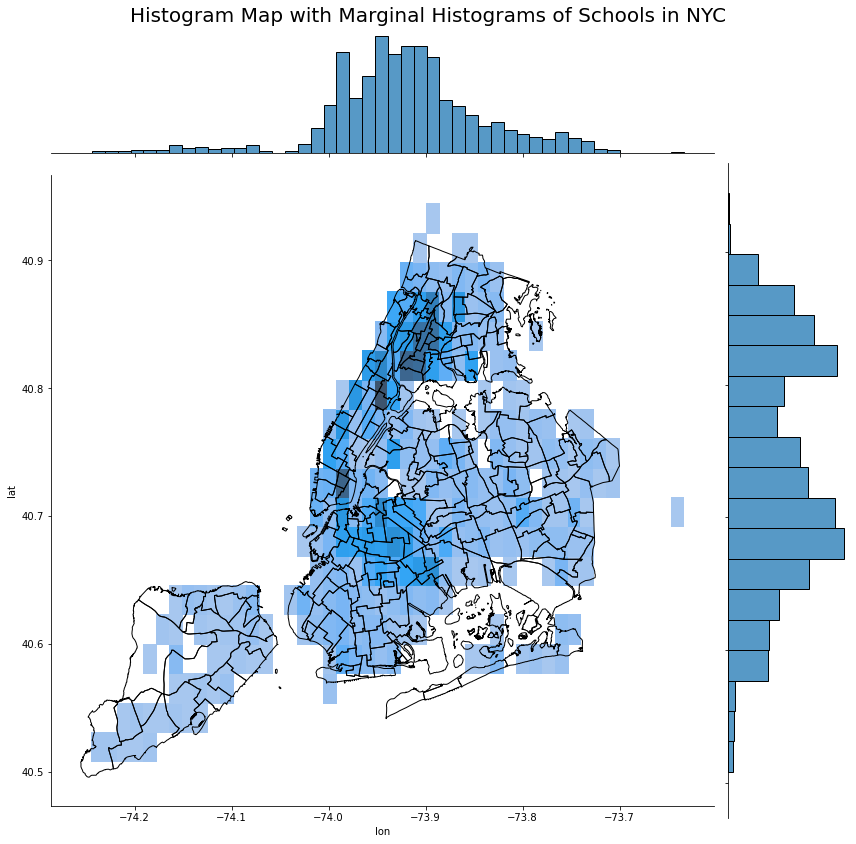

In [1340]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12,
                  kind='hist')


nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=1, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Histogram Map with Marginal Histograms of Schools in NYC", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-d')

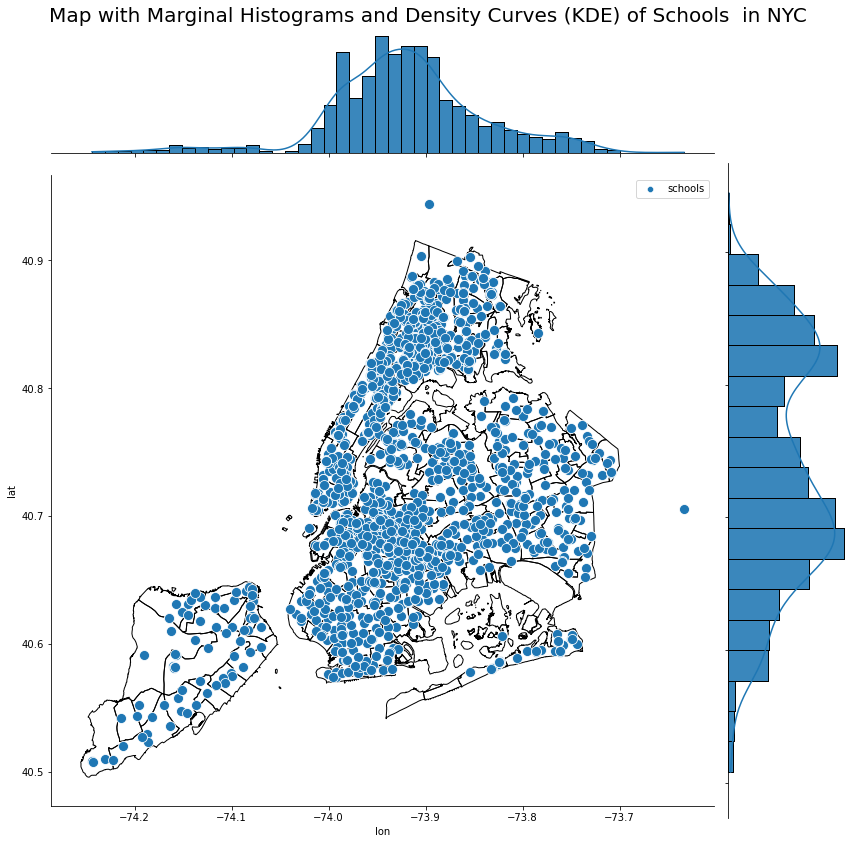

In [1341]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12,
                  label='schools', 
                  legend=True)

g.plot_joint(sns.scatterplot, 
             s=100)

g.plot_marginals(sns.histplot, 
                 kde=True)

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map with Marginal Histograms and Density Curves (KDE) of Schools  in NYC", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-e')

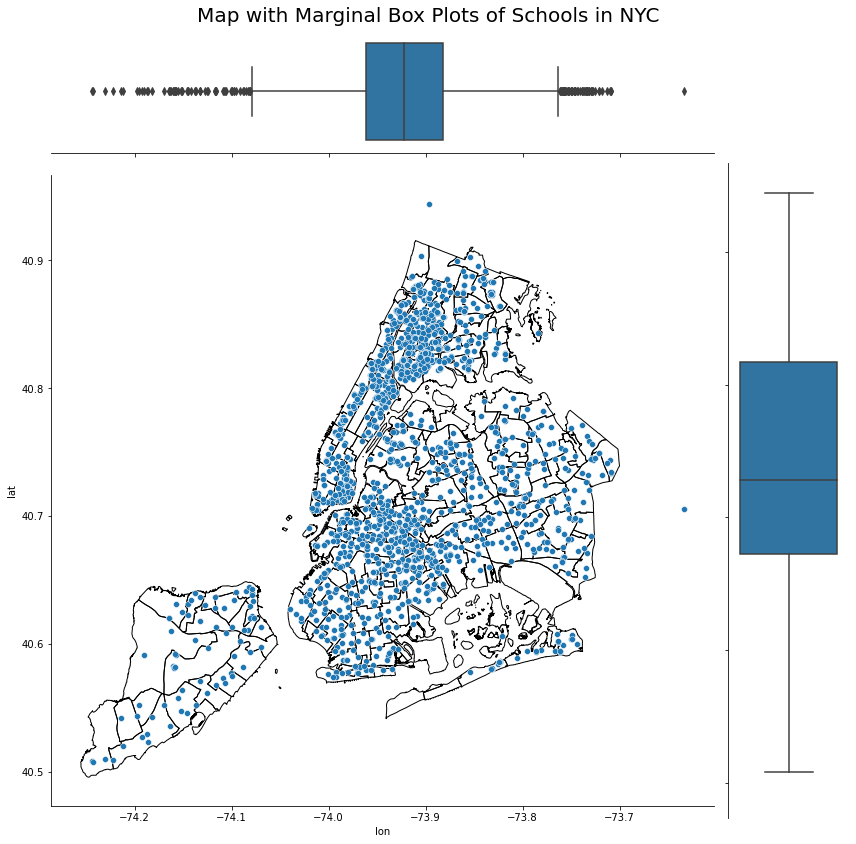

In [1342]:
g = sns.JointGrid(x='lon',
                  y='lat', 
                  data=school_points,
                  height=12)

g.plot(sns.scatterplot, 
       sns.boxplot)


nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map with Marginal Box Plots of Schools in NYC", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-f')

/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/geribauer/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


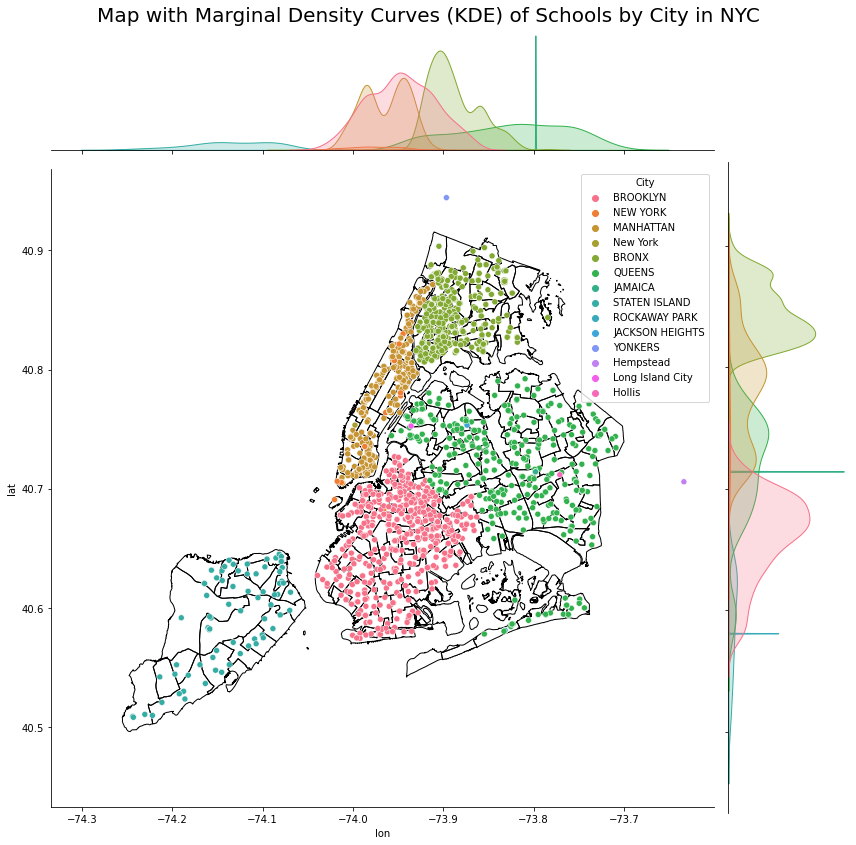

In [1343]:
g = sns.jointplot(x='lon',
                  y='lat', 
                  data=school_points,
                  hue='City',
                  height=12)

nta_shape.to_crs(epsg=4326).plot(ax=g.ax_joint, 
                                 zorder=0, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map with Marginal Density Curves (KDE) of Schools by City in NYC", fontsize=20)
g.fig.subplots_adjust(top=0.95)
plt.tight_layout()
plt.savefig('figures/6-7-g')

## 6.8 Cartogram Map

/Users/geribauer/anaconda3/lib/python3.7/site-packages/geoplot/geoplot.py:257: UserWarning: Please specify "legend_var" explicitly when both "hue" and "scale" are specified. Defaulting to "legend_var='hue'".
  f'Please specify "legend_var" explicitly when both "hue" and "scale" are '


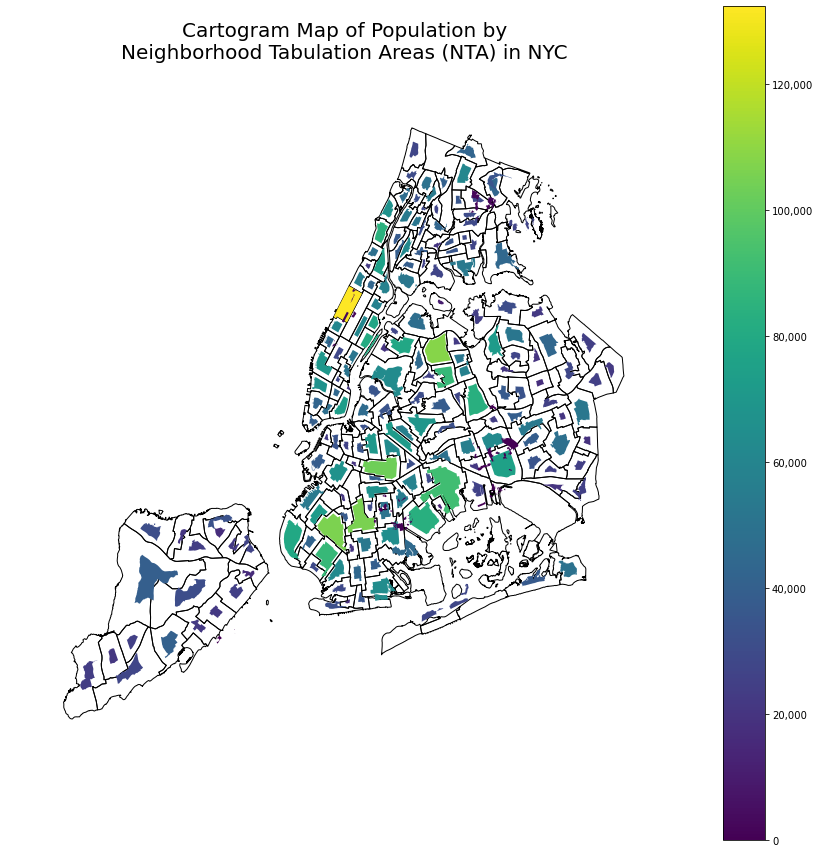

In [1344]:
nta_pop.set_geometry('geometry', inplace=True)

comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))

ax = gplt.cartogram(nta_pop.to_crs(4326), 
                    scale='Population', 
                    projection=gcrs.AlbersEqualArea(),
                    figsize=(12,12), 
                    legend=True, 
                    hue='Population',
                    legend_kwargs={'format':comma_fmt})


gplt.polyplot(nta_shape.to_crs(4326), 
              ax=ax, 
              zorder=0)

ax.set_title('Cartogram Map of Population by\nNeighborhood Tabulation Areas (NTA) in NYC', 
             fontsize=20,
             pad=10)
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-8-a')

## 6.9 Voroni Map

/Users/geribauer/anaconda3/lib/python3.7/site-packages/geopandas/geoseries.py:371: UserWarning: GeoSeries.isna() previously returned True for both missing (None) and empty geometries. Now, it only returns True for missing values. Since the calling GeoSeries contains empty geometries, the result has changed compared to previous versions of GeoPandas.
Given a GeoSeries 's', you can use 's.is_empty | s.isna()' to get back the old behaviour.

To further ignore this warning, you can do: 
import warnings; warnings.filterwarnings('ignore', 'GeoSeries.isna', UserWarning)
  return self.isna()
/Users/geribauer/anaconda3/lib/python3.7/site-packages/geopandas/geodataframe.py:852: UserWarning: Geometry column does not contain geometry.
  warnings.warn("Geometry column does not contain geometry.")


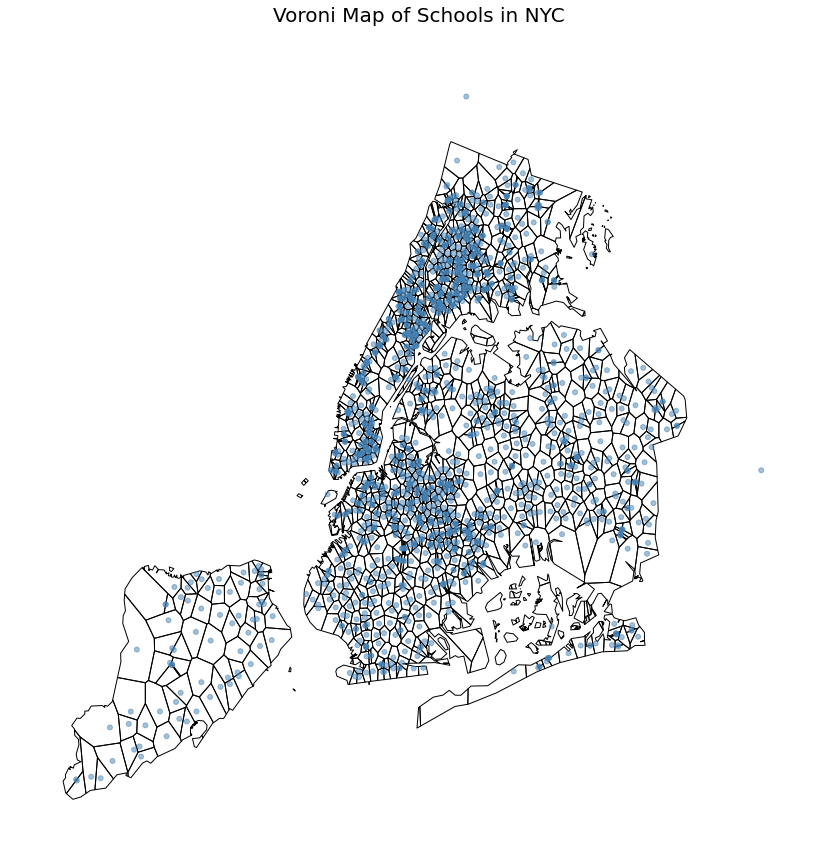

In [1345]:
boros = gpd.read_file(gpd.datasets.get_path('nybb'))

ax = gplt.voronoi(school_points.to_crs(4326), 
                  projection=gcrs.AlbersEqualArea(),
                  clip=boros.to_crs(4326).simplify(0.001),
                  figsize=(12,12),
                  zorder=0)

gplt.pointplot(school_points.to_crs(4326), 
               alpha=.5,
               ax=ax)

ax.set_title('Voroni Map of Schools in NYC', fontsize=20)
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-9-a')

## 6.10 Quadtree Map

/Users/geribauer/anaconda3/lib/python3.7/site-packages/geopandas/geoseries.py:371: UserWarning: GeoSeries.isna() previously returned True for both missing (None) and empty geometries. Now, it only returns True for missing values. Since the calling GeoSeries contains empty geometries, the result has changed compared to previous versions of GeoPandas.
Given a GeoSeries 's', you can use 's.is_empty | s.isna()' to get back the old behaviour.

To further ignore this warning, you can do: 
import warnings; warnings.filterwarnings('ignore', 'GeoSeries.isna', UserWarning)
  return self.isna()


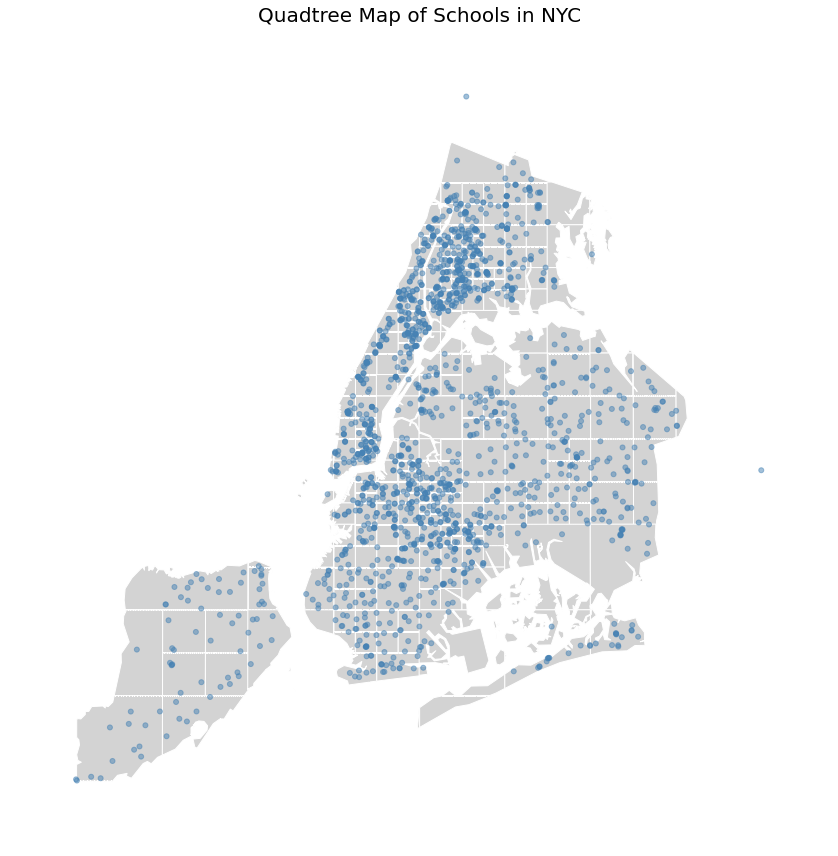

In [1346]:
boros = gpd.read_file(gpd.datasets.get_path('nybb'))

ax = gplt.quadtree(school_points.to_crs(4326), 
                   nmax=1,
                   projection=gcrs.AlbersEqualArea(), 
                   clip=boros.to_crs(4326).simplify(0.001),
                   facecolor='lightgray', 
                   edgecolor='white', 
                   figsize=(12,12),
                   zorder=0)

gplt.pointplot(school_points.to_crs(4326), 
               alpha=.5,
               ax=ax)

ax.set_title('Quadtree Map of Schools in NYC', fontsize=20)
ax.set_aspect('equal', 'box')
plt.tight_layout()
plt.savefig('figures/6-10-a')

## 6.11 Aesthetics for Maps

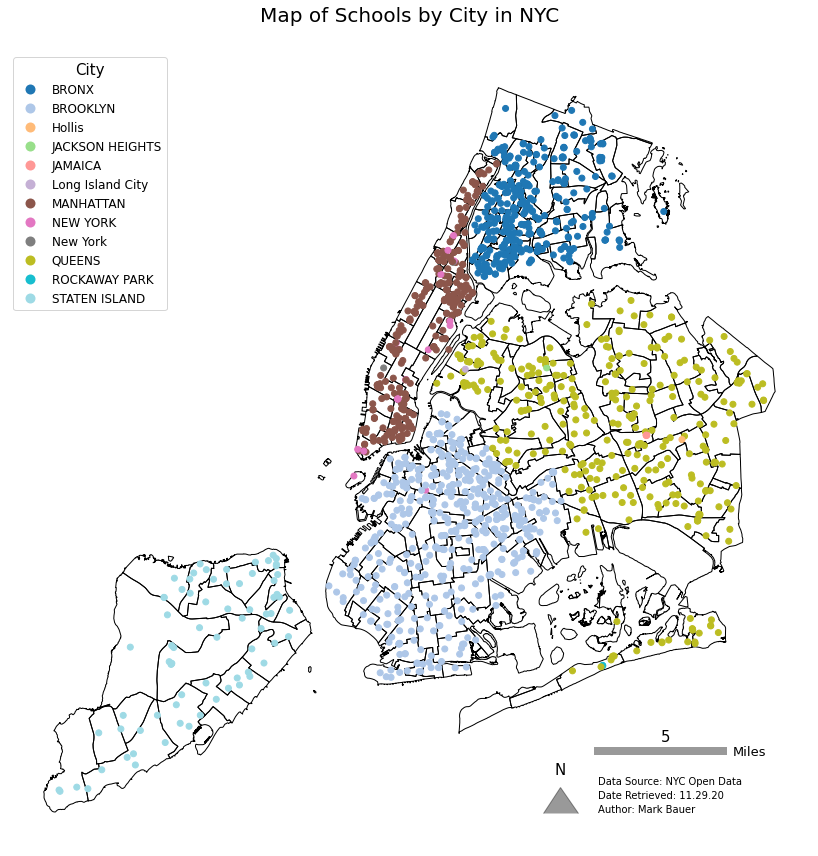

In [1347]:
fig, ax = plt.subplots(figsize=(12,12))

school_points_clipped = gpd.clip(school_points, nta_shape.to_crs(epsg=2263))

school_points_clipped.plot(ax=ax, 
                           column='City',
                           cmap='tab20',
                           legend=True,
                           legend_kwds={'loc': "upper left",
                                        'title':'City',
                                        'fontsize': "12",
                                        'title_fontsize':'15'})

nta_shape.to_crs(epsg=2263).plot(ax=ax, 
                                 color='None', 
                                 edgecolor='black',
                                 zorder=0)

x2, y2 = [1030000, 1030000+5280*5], [120000 + 13000, 120000 + 13000]
plt.plot(x2, 
         y2, 
         linewidth=8,
         color='black',
         alpha=.4)

plt.text(1030000 + (5280*5/2), 120000 + 15000, '5', dict(size=15))
plt.text(1030000+5280*5 + 2000, 120000 + 12000, 'Miles', dict(size=13))

plt.plot([1030000 - 8000], [120000], 
         marker=10, 
         markersize=35, 
         mfc='black', 
         mec='black',
         alpha=.4)

plt.text(1030000 - 9200, 120000 + 8000, 'N', dict(size=15))

plt.text(1030000, 120000 + 6000, 'Data Source: NYC Open Data', dict(size=10))
plt.text(1030000, 120000 + 3000, 'Date Retrieved: 11.29.20', dict(size=10))
plt.text(1030000, 120000, 'Author: Mark Bauer', dict(size=10))

ax.set_title('Map of Schools by City in NYC', pad=30, fontsize=20)
plt.axis('off')
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/6-11-a')

# 7. Joining Data

## 7.1 Attribute Join

In [1348]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [1349]:
url = 'https://data.cityofnewyork.us/api/views/swpk-hqdp/rows.csv?accessType=DOWNLOAD'
nyc_pop = pd.read_csv(url)

nyc_pop.head()

,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,Bronx,2000,5,BX01,Claremont-Bathgate,28149
1,Bronx,2000,5,BX03,Eastchester-Edenwald-Baychester,35422
2,Bronx,2000,5,BX05,Bedford Park-Fordham North,55329
3,Bronx,2000,5,BX06,Belmont,25967
4,Bronx,2000,5,BX07,Bronxdale,34309


In [1350]:
print(nyc_pop['Year'].unique())

nyc_pop = nyc_pop.loc[nyc_pop['Year'] == 2010]

print(nyc_pop['Year'].unique())

[2000 2010]
[2010]


In [1351]:
print(nta_shape['ntaname'].dtype)
print(nyc_pop['NTA Name'].dtype)

object
object


In [1352]:
nta_shape.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   ntacode      195 non-null    object  
 1   shape_area   195 non-null    object  
 2   county_fips  195 non-null    object  
 3   ntaname      195 non-null    object  
 4   shape_leng   195 non-null    object  
 5   boro_name    195 non-null    object  
 6   boro_code    195 non-null    object  
 7   geometry     195 non-null    geometry
dtypes: geometry(1), object(7)
memory usage: 12.3+ KB


In [1353]:
nta_with_pop = nta_shape.merge(nyc_pop, 
                               left_on='ntacode', 
                               right_on='NTA Code')

In [1354]:
nta_with_pop.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ...",Brooklyn,2010,47,BK88,Borough Park,106357
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ...",Queens,2010,81,QN51,Murray Hill,51739
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ...",Queens,2010,81,QN27,East Elmhurst,23150
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ...",Brooklyn,2010,47,BK95,Erasmus,29938
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ...",Queens,2010,81,QN07,Hollis,20269


In [1355]:
nta_with_pop.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 195 entries, 0 to 194
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   ntacode           195 non-null    object  
 1   shape_area        195 non-null    object  
 2   county_fips       195 non-null    object  
 3   ntaname           195 non-null    object  
 4   shape_leng        195 non-null    object  
 5   boro_name         195 non-null    object  
 6   boro_code         195 non-null    object  
 7   geometry          195 non-null    geometry
 8   Borough           195 non-null    object  
 9   Year              195 non-null    int64   
 10  FIPS County Code  195 non-null    int64   
 11  NTA Code          195 non-null    object  
 12  NTA Name          195 non-null    object  
 13  Population        195 non-null    int64   
dtypes: geometry(1), int64(3), object(10)
memory usage: 22.9+ KB


## 7.2 Spatial Join

In [1356]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [1357]:
zipfile = 'https://data.cityofnewyork.us/download/jfju-ynrr/application%2Fzip'
school_points = gpd.read_file(zipfile)

school_points.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,STATE_CODE,ZIP,PRINCIPAL,PRIN_PH,FAX,GRADES,City,geometry
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.000,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,NY,11220,Jennifer Eusanio,718-567-7661,718-567-9771,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (980985.054 175780.759)
1,b'17K002 \xa0\xa0\xa0\xa0\xa0',K,2.000,K002,M.S. 002,Junior High-Intermediate-Middle,1,17,17,655 PARKSIDE AVENUE,NY,11226,ADRIENNE SPENCER,718-462-6992,718-284-7717,"06,07,08,SE",BROOKLYN,POINT (997785.136 178431.911)
2,b'21K095 \xa0\xa0\xa0\xa0\xa0',K,2.000,K095,P.S. 095 THE GRAVESEND,K-8,1,21,21,345 VAN SICKLEN STREET,NY,11223,Janet Ndzibah,718-449-5050,718-449-3047,"PK,0K,01,02,03,04,05,06,07,08,SE",BROOKLYN,POINT (991224.983 156323.361)
3,b'21K096 \xa0\xa0\xa0\xa0\xa0',K,2.000,K096,I.S. 096 SETH LOW,Junior High-Intermediate-Middle,1,21,21,99 AVENUE P,NY,11204,Denise Sandra Levinsky,718-236-1344,718-236-2397,"06,07,08,SE",BROOKLYN,POINT (988439.681 160709.993)
4,b'21K097 \xa0\xa0\xa0\xa0\xa0',K,2.000,K097,P.S. 97 THE HIGHLAWN,Elementary,1,21,21,1855 STILLWELL AVENUE,NY,11223,KRISTINE MUSTILLO,718-372-7393,718-372-3842,"PK,0K,01,02,03,04,05,SE",BROOKLYN,POINT (988205.073 158329.591)


In [1358]:
nta_shape.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [1359]:
school_points.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [1360]:
nta_shape.to_crs(epsg=2263, inplace=True)
nta_shape.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [1361]:
school_points.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1709 entries, 0 to 1708
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ATS_CODE    1707 non-null   object  
 1   BORO        1693 non-null   object  
 2   BORONUM     1709 non-null   float64 
 3   LOC_CODE    1709 non-null   object  
 4   SCHOOLNAME  1709 non-null   object  
 5   SCH_TYPE    1709 non-null   object  
 6   MANAGED_BY  1709 non-null   int64   
 7   GEO_DISTRI  1709 non-null   int64   
 8   ADMIN_DIST  1709 non-null   int64   
 9   ADDRESS     1709 non-null   object  
 10  STATE_CODE  1709 non-null   object  
 11  ZIP         1709 non-null   int64   
 12  PRINCIPAL   1693 non-null   object  
 13  PRIN_PH     1694 non-null   object  
 14  FAX         1657 non-null   object  
 15  GRADES      1708 non-null   object  
 16  City        1709 non-null   object  
 17  geometry    1709 non-null   geometry
dtypes: float64(1), geometry(1), int64(4), ob

In [1362]:
school_points_with_nta = gpd.sjoin(school_points, 
                                   nta_shape, 
                                   how="inner", 
                                   op='intersects')

In [1363]:
school_points_with_nta.head()

,ATS_CODE,BORO,BORONUM,LOC_CODE,SCHOOLNAME,SCH_TYPE,MANAGED_BY,GEO_DISTRI,ADMIN_DIST,ADDRESS,...,City,geometry,index_right,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code
0,b'15K001 \xa0\xa0\xa0\xa0\xa0',K,2.000,K001,P.S. 001 THE BERGEN,Elementary,1,15,15,309 47 STREET,...,BROOKLYN,POINT (980985.054 175780.759),121,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3
36,b'15K136 \xa0\xa0\xa0\xa0\xa0',K,2.000,K136,I.S. 136 CHARLES O. DEWEY,Junior High-Intermediate-Middle,1,15,15,4004 4 AVENUE,...,BROOKLYN,POINT (982218.628 176813.496),121,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3
65,b'15K172 \xa0\xa0\xa0\xa0\xa0',K,2.000,K172,P.S. 172 BEACON SCHOOL OF EXCELLENCE,Elementary,1,15,15,825 4 AVENUE,...,BROOKLYN,POINT (984158.590 178921.890),121,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3
168,b'15K295 \xa0\xa0\xa0\xa0\xa0',K,2.000,K295,P.S. 295,Elementary,1,15,15,330 18 STREET,...,BROOKLYN,POINT (987330.493 180120.659),121,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3
222,b'75K371 \xa0\xa0\xa0\xa0\xa0',K,2.000,K371,P.S. 371 - LILLIAN L. RASHKIS,High school,1,15,75,355 37 STREET,...,BROOKLYN,POINT (982776.837 177607.547),121,BK32,49990015.8359,047,Sunset Park West,83323.5061834,Brooklyn,3


In [1364]:
school_points_with_nta.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1707 entries, 0 to 1615
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   ATS_CODE     1707 non-null   object  
 1   BORO         1691 non-null   object  
 2   BORONUM      1707 non-null   float64 
 3   LOC_CODE     1707 non-null   object  
 4   SCHOOLNAME   1707 non-null   object  
 5   SCH_TYPE     1707 non-null   object  
 6   MANAGED_BY   1707 non-null   int64   
 7   GEO_DISTRI   1707 non-null   int64   
 8   ADMIN_DIST   1707 non-null   int64   
 9   ADDRESS      1707 non-null   object  
 10  STATE_CODE   1707 non-null   object  
 11  ZIP          1707 non-null   int64   
 12  PRINCIPAL    1693 non-null   object  
 13  PRIN_PH      1693 non-null   object  
 14  FAX          1656 non-null   object  
 15  GRADES       1706 non-null   object  
 16  City         1707 non-null   object  
 17  geometry     1707 non-null   geometry
 18  index_right  1707 no

<AxesSubplot:>

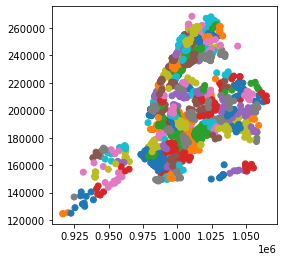

In [1365]:
school_points_with_nta.plot(column='ntaname')

# 8. Indexing and Selecting Data

In [1366]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


<AxesSubplot:>

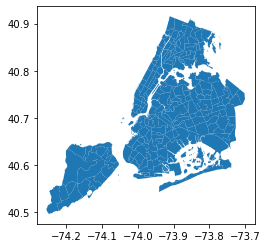

In [1367]:
nta_shape.plot()

In [1368]:
nta_shape = nta_shape.cx[:-74.1, :]
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
52,SI48,50410816.2219,085,Arden Heights,29689.3955312,Staten Island,5,"MULTIPOLYGON (((-74.17185 40.56152, -74.17223 ..."
59,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((-74.16983 40.56109, -74.16983 ..."
76,SI11,145674612.035,085,Charleston-Richmond Valley-Tottenville,84848.4551217,Staten Island,5,"MULTIPOLYGON (((-74.20700 40.55757, -74.20880 ..."
77,SI32,64963357.8609,085,Rossville-Woodrow,33247.2589139,Staten Island,5,"MULTIPOLYGON (((-74.20315 40.55606, -74.20318 ..."
96,SI08,37752553.4884,085,Grymes Hill-Clifton-Fox Hills,37119.899593,Staten Island,5,"MULTIPOLYGON (((-74.08155 40.60629, -74.08281 ..."


<AxesSubplot:>

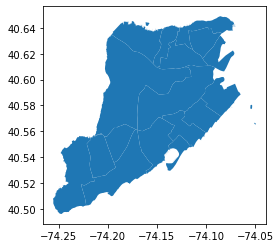

In [1369]:
nta_shape.plot()

In [1370]:
nta_shape = nta_shape.cx[:-74.1, 40.56:]
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
52,SI48,50410816.2219,085,Arden Heights,29689.3955312,Staten Island,5,"MULTIPOLYGON (((-74.17185 40.56152, -74.17223 ..."
59,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((-74.16983 40.56109, -74.16983 ..."
96,SI08,37752553.4884,085,Grymes Hill-Clifton-Fox Hills,37119.899593,Staten Island,5,"MULTIPOLYGON (((-74.08155 40.60629, -74.08281 ..."
98,SI45,55429451.2602,085,New Dorp-Midland Beach,34336.5208858,Staten Island,5,"MULTIPOLYGON (((-74.08469 40.57148, -74.08595 ..."
101,SI36,67009381.3856,085,Old Town-Dongan Hills-South Beach,41971.5822714,Staten Island,5,"MULTIPOLYGON (((-74.06503 40.58899, -74.06503 ..."


<AxesSubplot:>

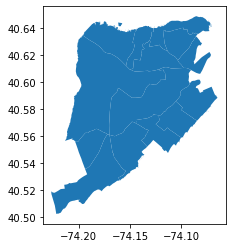

In [1371]:
nta_shape.plot()

# 9. Coordinate Reference Systems

In [1372]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [1373]:
nta_shape.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

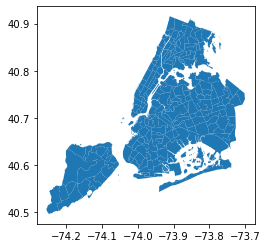

In [1374]:
nta_shape.plot()

In [1375]:
nta_shape.to_crs(epsg=2263, inplace=True)

nta_shape.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

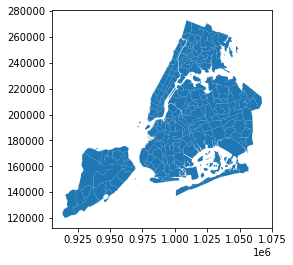

In [1376]:
nta_shape.plot()

# 10. Set Operations with Overlay

In [1540]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [1541]:
nta_shape = nta_shape.to_crs(epsg=2263)
nta_shape['offset'] = nta_shape.geometry.translate(10000, 10000)

In [1542]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....","MULTIPOLYGON (((1000897.900 179268.121, 100058..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...","MULTIPOLYGON (((1048593.459 231913.355, 104936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...","MULTIPOLYGON (((1032728.275 227530.808, 103305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....","MULTIPOLYGON (((1008608.334 181942.436, 100833..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...","MULTIPOLYGON (((1061539.660 211007.013, 106192..."


Text(0.5, 1.0, 'Offset = 10,000 ft in both x and y directions')

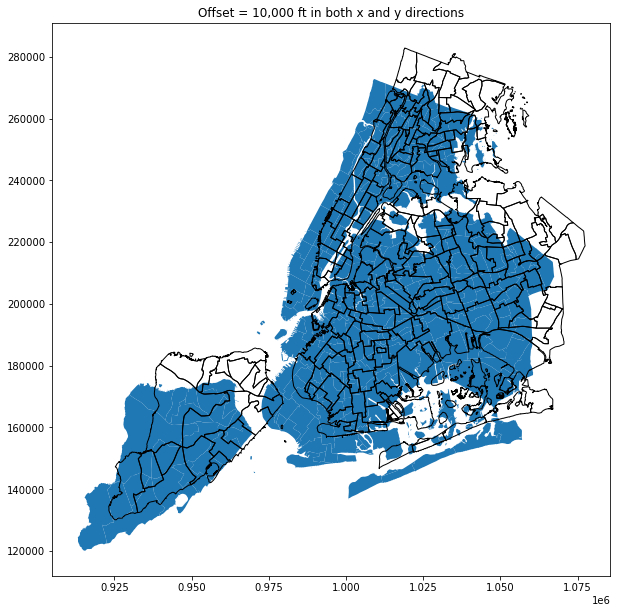

In [1543]:
fig, ax = plt.subplots(figsize=(10,15)) # creating a figure

nta_shape.plot(ax=ax)

nta_shape.set_geometry('offset').plot(ax=ax,
                                      color='none',
                                      edgecolor='black')

ax.set_title('Offset = 10,000 ft in both x and y directions')

In [1544]:
nta_shape = nta_shape.iloc[[59]]
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset
59,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((937062.469 143742.591, 937059....","MULTIPOLYGON (((947062.469 153742.591, 947059...."


In [1545]:
offset = nta_shape.set_geometry('offset')
offset.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset
59,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((937062.469 143742.591, 937059....","MULTIPOLYGON (((947062.469 153742.591, 947059...."


Text(0.5, 1.0, 'Overlay = None (Original Shapes)')

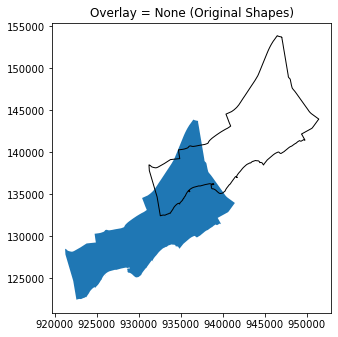

In [1546]:
fig, ax = plt.subplots(figsize=(5,15)) # creating a figure

nta_shape.plot(ax=ax)

offset.plot(ax=ax, color='None', edgecolor='black')
ax.set_title('Overlay = None (Original Shapes)')

## 10.1 Union

Text(0.5, 1.0, 'Overlay = Union')

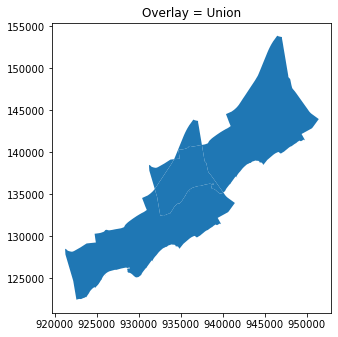

In [1547]:
fig, ax = plt.subplots(figsize=(5,15)) # creating a figure

union = gpd.overlay(nta_shape, offset, how='union')
union.plot(ax=ax)
ax.set_title('Overlay = Union')

## 10.2 Intersection

Text(0.5, 1.0, 'Overlay = Intersection')

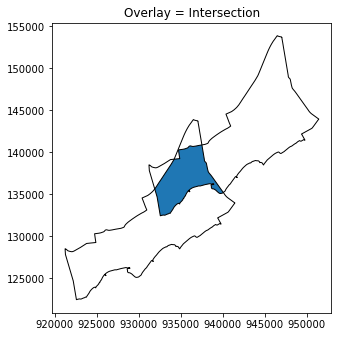

In [1548]:
fig, ax = plt.subplots(figsize=(5,15)) # creating a figure

intersection = gpd.overlay(nta_shape, offset, how='intersection')
intersection.plot(ax=ax)
offset.plot(ax=ax, color='None', edgecolor='black')
nta_shape.plot(ax=ax, color='None',  edgecolor='black')
ax.set_title('Overlay = Intersection')

## 10.3 Symmetric Difference

Text(0.5, 1.0, 'Overlay = Symmetric Difference')

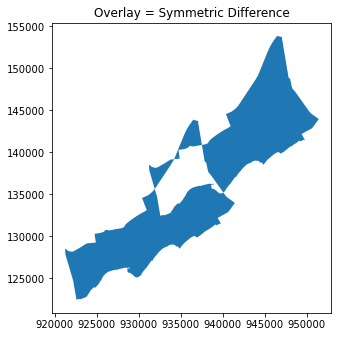

In [1549]:
fig, ax = plt.subplots(figsize=(5,15)) # creating a figure

symmetric_difference = gpd.overlay(nta_shape, offset, how='symmetric_difference')
symmetric_difference.plot(ax=ax)
ax.set_title('Overlay = Symmetric Difference')

## 10.4 Difference

Text(0.5, 1.0, 'Overlay = Difference')

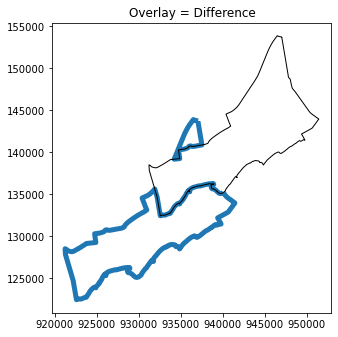

In [1550]:
fig, ax = plt.subplots(figsize=(5,15)) # creating a figure

difference = gpd.overlay(nta_shape, offset, how='difference')
difference.plot(ax=ax, color='None', edgecolor='#1f77b4', linewidth=5)
offset.plot(ax=ax, color='None', edgecolor='black', zorder=1)
ax.set_title('Overlay = Difference')

## 10.5 Identity

Text(0.5, 1.0, 'Overlay = Identity')

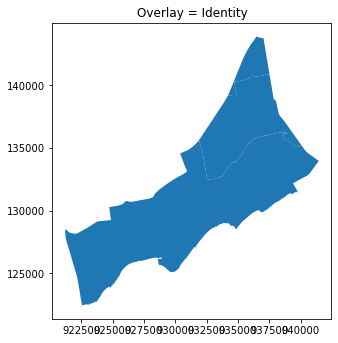

In [1551]:
fig, ax = plt.subplots(figsize=(5,15)) # creating a figure

identity = gpd.overlay(nta_shape, offset, how='identity')
identity.plot(ax=ax)
ax.set_title('Overlay = Identity')

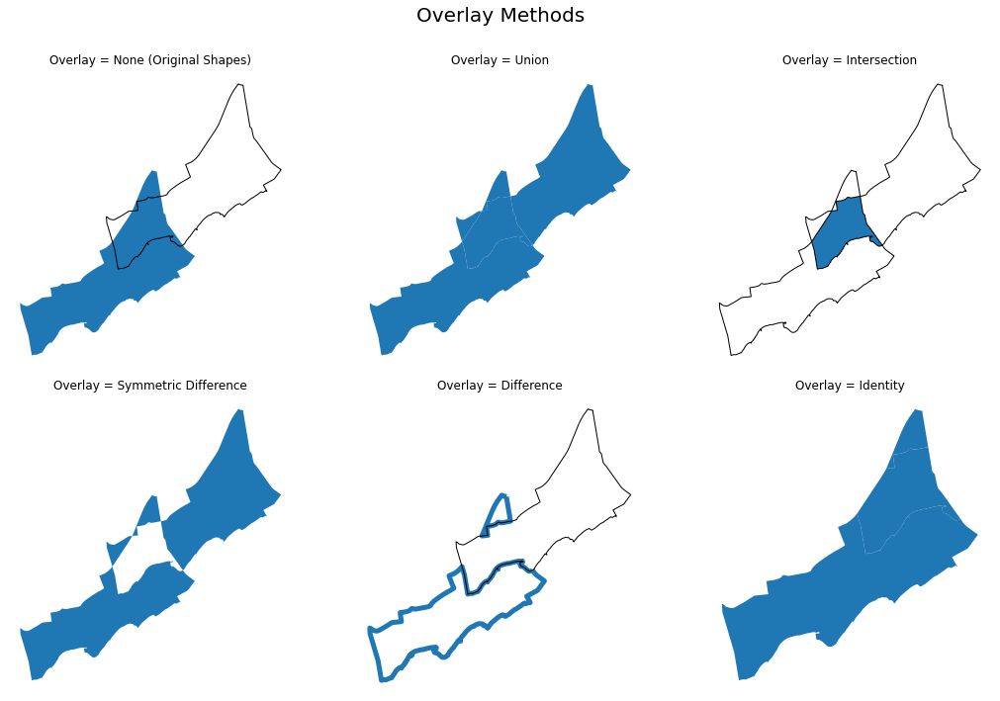

In [1553]:
fig, axs = plt.subplots(2, 3, sharey=False, figsize=(15,10))

nta_shape.plot(ax=axs[0, 0])
offset.plot(ax=axs[0, 0], color='None', edgecolor='black')
axs[0, 0].set_title('Overlay = None (Original Shapes)')
axs[0, 0].axis('off')

union = gpd.overlay(nta_shape, offset, how='union')
union.plot(ax=axs[0, 1])
axs[0, 1].set_title('Overlay = Union')
axs[0, 1].axis('off')

intersection = gpd.overlay(nta_shape, offset, how='intersection')
intersection.plot(ax=axs[0, 2])
offset.plot(ax=axs[0, 2], color='None', edgecolor='black')
nta_shape.plot(ax=axs[0, 2], color='None',  edgecolor='black')
axs[0, 2].set_title('Overlay = Intersection')
axs[0, 2].axis('off')

symmetric_difference = gpd.overlay(nta_shape, offset, how='symmetric_difference')
symmetric_difference.plot(ax=axs[1, 0])
axs[1, 0].set_title('Overlay = Symmetric Difference')
axs[1, 0].axis('off')

difference = gpd.overlay(nta_shape, offset, how='difference')
difference.plot(ax=axs[1, 1], color='None', edgecolor='#1f77b4', linewidth=5)
offset.plot(ax=axs[1, 1], color='None', edgecolor='black', zorder=1)
axs[1, 1].set_title('Overlay = Difference')
axs[1, 1].axis('off')

identity = gpd.overlay(nta_shape, offset, how='identity')
identity.plot(ax=axs[1, 2])
axs[1, 2].set_title('Overlay = Identity')
axs[1, 2].axis('off')

fig.suptitle("Overlay Methods\n", fontsize=20)
fig.tight_layout()
plt.savefig('figures/10-a')

# 11. Aggregation with Dissolve

In [1554]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


<AxesSubplot:>

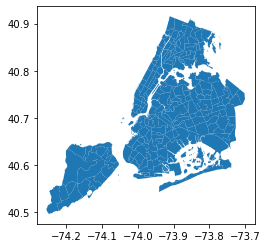

In [1555]:
nta_shape.plot()

In [1556]:
boro = nta_shape.dissolve(by='boro_name')
boro.head()

,geometry,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_code
boro_name,,,,,,,
Bronx,"MULTIPOLYGON (((-73.87287 40.78598, -73.87288 ...",BX33,10732452.1794,005,Longwood,18982.1296554,2
Brooklyn,"MULTIPOLYGON (((-73.95939 40.57391, -73.95983 ...",BK88,54005019.048,047,Borough Park,39247.2278309,3
Manhattan,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ...",MN21,7526913.95137,061,Gramercy,12096.8911742,1
Queens,"MULTIPOLYGON (((-73.88347 40.56848, -73.88337 ...",QN51,52488277.5915,081,Murray Hill,33266.9048721,4
Staten Island,"MULTIPOLYGON (((-74.09993 40.55907, -74.10021 ...",SI48,50410816.2219,085,Arden Heights,29689.3955312,5


<AxesSubplot:>

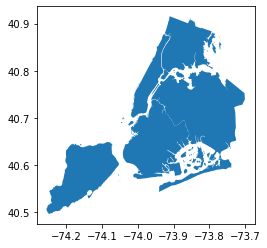

In [1557]:
boro.plot()

# 12. Additional Attributes and Methods

## 12.1 Unary Predicates

In [1558]:
nta_shape.geometry.is_empty.value_counts()

False    195
dtype: int64

In [1559]:
nta_shape.geometry.isna().value_counts()

False    195
Name: geometry, dtype: int64

In [1560]:
nta_shape['geometry'].is_simple.value_counts()

True    195
dtype: int64

## 12.2 Binary Predicates

In [1561]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.to_crs(epsg=2263, inplace=True)
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588...."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339...."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192..."


### 12.2.1 Centroids vs. Representative Points

In [1562]:
nta_shape.centroid.geom_almost_equals(nta_shape.centroid).value_counts()

True    195
dtype: int64

In [1563]:
nta_shape.centroid.geom_almost_equals(nta_shape.representative_point()).value_counts()

False    195
dtype: int64

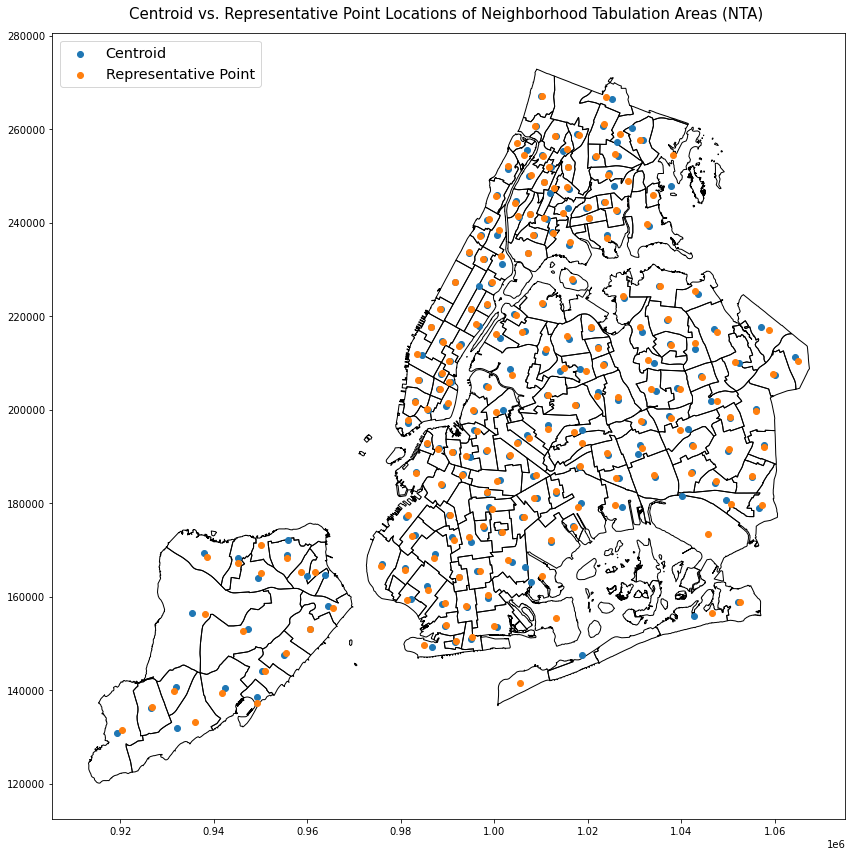

In [1564]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.plot(ax=ax, 
               color='none', 
               edgecolor='black')

nta_shape.centroid.plot(ax=ax, 
                        label='Centroid')

nta_shape.representative_point().plot(ax=ax, 
                                      label='Representative Point')

ax.legend(loc=2, fontsize='x-large')
ax.set_title('Centroid vs. Representative Point Locations of Neighborhood Tabulation Areas (NTA) ', 
             fontsize=15,
             pad=15)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-2-b')

In [1565]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588...."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339...."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192..."


In [1566]:
nta_shape['offset'] = nta_shape.geometry.translate(10000, 10000)
nta_shape['centroid_column'] = nta_shape.centroid

In [1567]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588....","MULTIPOLYGON (((1000897.900 179268.121, 100058...",POINT (987397.463 169148.408)
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936...","MULTIPOLYGON (((1048593.459 231913.355, 104936...",POINT (1037005.224 219265.318)
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305...","MULTIPOLYGON (((1032728.275 227530.808, 103305...",POINT (1020706.745 217413.871)
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339....","MULTIPOLYGON (((1008608.334 181942.436, 100833...",POINT (997674.726 174677.650)
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192...","MULTIPOLYGON (((1061539.660 211007.013, 106192...",POINT (1050471.492 198271.804)


Text(0.5, 1.0, 'Offset of 10,000 ft in both x and y directions')

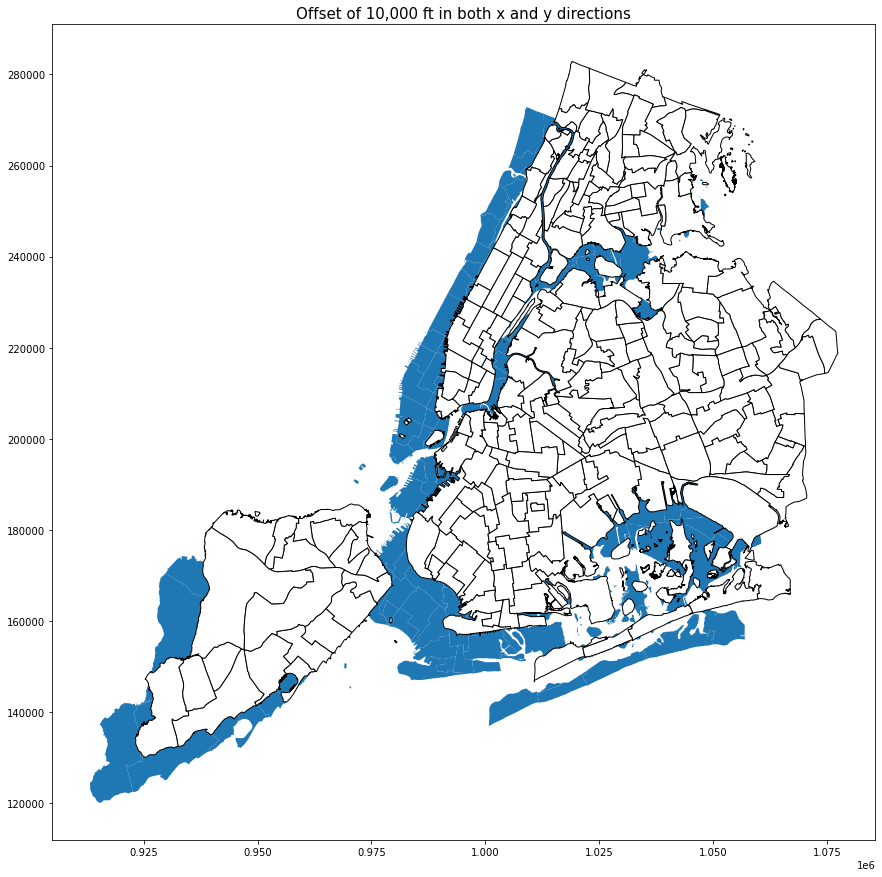

In [1568]:
fig, ax = plt.subplots(figsize=(20,15)) # creating a figure

nta_shape.plot(ax=ax, 
               label='original')

nta_shape.set_geometry('offset').plot(ax=ax,
                                      color='white',
                                      edgecolor='black', 
                                      label='offset')

ax.set_title('Offset of 10,000 ft in both x and y directions', fontsize=15)

### 12.2.2 Intersects

In [1569]:
nta_shape['geometry'].intersects(nta_shape.set_geometry('offset')).value_counts()

False    185
True      10
dtype: int64

In [1570]:
nta_shape.loc[nta_shape['geometry'].intersects(nta_shape.set_geometry('offset')) == True].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
59,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((937062.469 143742.591, 937059....","MULTIPOLYGON (((947062.469 153742.591, 947059....",POINT (932069.309 131939.902)
76,SI11,145674612.035,085,Charleston-Richmond Valley-Tottenville,84848.4551217,Staten Island,5,"MULTIPOLYGON (((926730.616 142481.322, 926228....","MULTIPOLYGON (((936730.616 152481.322, 936228....",POINT (919322.784 130818.739)
97,QN05,61569261.2362,081,Rosedale,64163.7256455,Queens,4,"MULTIPOLYGON (((1060282.018 188318.545, 106027...","MULTIPOLYGON (((1070282.018 198318.545, 107027...",POINT (1056539.403 179052.939)
138,BX99,220837194.772,005,park-cemetery-etc-Bronx,223421.140891,Bronx,2,"MULTIPOLYGON (((1020356.163 236653.068, 102035...","MULTIPOLYGON (((1030356.163 246653.068, 103035...",POINT (1026256.366 257174.837)
172,SI05,327290184.59,085,New Springville-Bloomfield-Travis,109065.873453,Staten Island,5,"MULTIPOLYGON (((941550.555 162375.099, 941570....","MULTIPOLYGON (((951550.555 172375.099, 951570....",POINT (935269.175 156417.849)


Text(0.5, 1.0, 'Intersects = True')

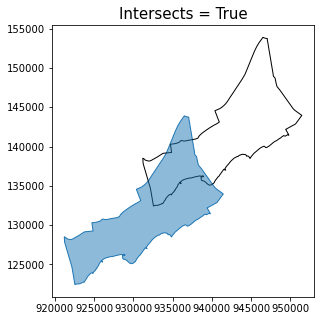

In [1571]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[59]].set_geometry('geometry').plot(ax=ax, 
                                                   color='none', 
                                                   edgecolor='#1f77b4')

nta_shape.iloc[[59]].set_geometry('offset').plot(ax=ax, 
                                                 color='none', 
                                                 edgecolor='black')

nta_shape.iloc[[59]].plot(ax=ax, alpha=.5)

ax.set_title('Intersects = True', fontsize=15)

Text(0.5, 1.0, 'Intersects = False')

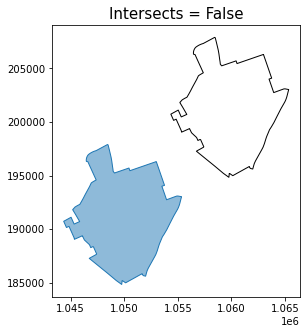

In [1572]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[9]].set_geometry('geometry').plot(ax=ax, 
                                                  color='none', 
                                                  edgecolor='#1f77b4')

nta_shape.iloc[[9]].set_geometry('offset').plot(ax=ax, 
                                                color='none', 
                                                edgecolor='black')

nta_shape.iloc[[9]].plot(ax=ax, alpha=.5)

ax.set_title('Intersects = False', fontsize=15)

### 12.2.3 Contains

In [1573]:
nta_shape['geometry'].contains(nta_shape['centroid_column']).value_counts()

True     186
False      9
dtype: int64

In [1574]:
nta_shape.loc[nta_shape['geometry'].contains(nta_shape['centroid_column']) == False].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
11,BX10,40134533.2335,005,Pelham Bay-Country Club-City Island,138249.436712,Bronx,2,"MULTIPOLYGON (((1042822.450 243439.814, 104255...","MULTIPOLYGON (((1052822.450 253439.814, 105255...",POINT (1037775.120 247764.710)
92,BX03,40256794.2545,005,Eastchester-Edenwald-Baychester,59164.9993069,Bronx,2,"MULTIPOLYGON (((1033004.041 263542.959, 103327...","MULTIPOLYGON (((1043004.041 273542.959, 104327...",POINT (1029422.433 260268.325)
110,MN99,91543352.7608,061,park-cemetery-etc-Manhattan,155354.846333,Manhattan,1,"MULTIPOLYGON (((981219.056 188655.316, 980940....","MULTIPOLYGON (((991219.056 198655.316, 990940....",POINT (996760.243 226350.078)
125,SI22,56030445.2217,085,West New Brighton-New Brighton-St. George,66054.251684,Staten Island,5,"MULTIPOLYGON (((964105.855 171704.149, 963907....","MULTIPOLYGON (((974105.855 181704.149, 973907....",POINT (955854.706 172087.534)
138,BX99,220837194.772,005,park-cemetery-etc-Bronx,223421.140891,Bronx,2,"MULTIPOLYGON (((1020356.163 236653.068, 102035...","MULTIPOLYGON (((1030356.163 246653.068, 103035...",POINT (1026256.366 257174.837)


Text(0.5, 1.0, 'Contains = True\n(shape contains point)')

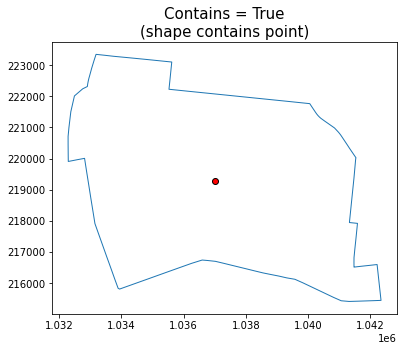

In [1575]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=ax, 
                                                  color='none', 
                                                  edgecolor='#1f77b4')

nta_shape.iloc[[1]].set_geometry('centroid_column').plot(ax=ax, 
                                                 color='red', 
                                                 edgecolor='black')

ax.set_title('Contains = True\n(shape contains point)', fontsize=15)

Text(0.5, 1.0, 'Contains = False\n(shape contains point)')

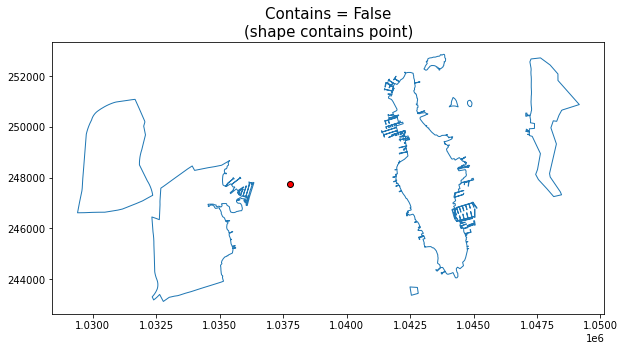

In [1576]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[11]].set_geometry('geometry').plot(ax=ax, 
                                                   color='none', 
                                                   edgecolor='#1f77b4')

nta_shape.iloc[[11]].set_geometry('centroid_column').plot(ax=ax, 
                                                 color='red', 
                                                 edgecolor='black')

ax.set_title('Contains = False\n(shape contains point)', fontsize=15)

### 12.2.4 Within

In [1577]:
nta_shape['centroid_column'].within(nta_shape['geometry']).value_counts()

True     186
False      9
dtype: int64

In [1578]:
nta_shape.loc[nta_shape['centroid_column'].within(nta_shape['geometry']) == False].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
11,BX10,40134533.2335,005,Pelham Bay-Country Club-City Island,138249.436712,Bronx,2,"MULTIPOLYGON (((1042822.450 243439.814, 104255...","MULTIPOLYGON (((1052822.450 253439.814, 105255...",POINT (1037775.120 247764.710)
92,BX03,40256794.2545,005,Eastchester-Edenwald-Baychester,59164.9993069,Bronx,2,"MULTIPOLYGON (((1033004.041 263542.959, 103327...","MULTIPOLYGON (((1043004.041 273542.959, 104327...",POINT (1029422.433 260268.325)
110,MN99,91543352.7608,061,park-cemetery-etc-Manhattan,155354.846333,Manhattan,1,"MULTIPOLYGON (((981219.056 188655.316, 980940....","MULTIPOLYGON (((991219.056 198655.316, 990940....",POINT (996760.243 226350.078)
125,SI22,56030445.2217,085,West New Brighton-New Brighton-St. George,66054.251684,Staten Island,5,"MULTIPOLYGON (((964105.855 171704.149, 963907....","MULTIPOLYGON (((974105.855 181704.149, 973907....",POINT (955854.706 172087.534)
138,BX99,220837194.772,005,park-cemetery-etc-Bronx,223421.140891,Bronx,2,"MULTIPOLYGON (((1020356.163 236653.068, 102035...","MULTIPOLYGON (((1030356.163 246653.068, 103035...",POINT (1026256.366 257174.837)


Text(0.5, 1.0, 'Within = True\n(point within shape)')

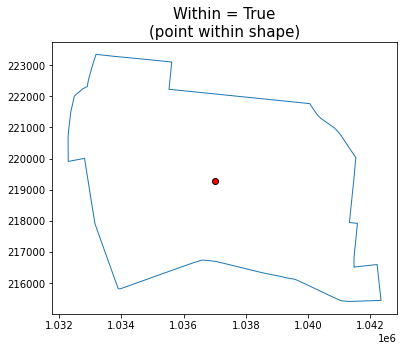

In [1579]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=ax, 
                                                   color='none', 
                                                   edgecolor='#1f77b4')

nta_shape.iloc[[1]].set_geometry('centroid_column').plot(ax=ax, 
                                                 color='red', 
                                                 edgecolor='black')

ax.set_title('Within = True\n(point within shape)', fontsize=15)

Text(0.5, 1.0, 'Within = False\n(point within shape)')

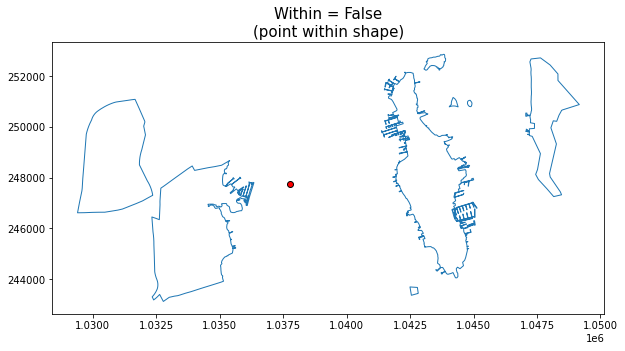

In [1580]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[11]].set_geometry('geometry').plot(ax=ax, 
                                                   color='none', 
                                                   edgecolor='#1f77b4')

nta_shape.iloc[[11]].set_geometry('centroid_column').plot(ax=ax, 
                                                 color='red', 
                                                 edgecolor='black')

ax.set_title('Within = False\n(point within shape)', fontsize=15)

In [1581]:
url = 'https://data.cityofnewyork.us/api/geospatial/exjm-f27b?method=export&format=GeoJSON'
streets = gpd.read_file(url, rows=195)
streets.to_crs(2263, inplace=True)

print(streets.shape)
streets.head()

(195, 32)


,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,bike_trafd,...,snow_pri,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry
0,6,None,None,0,10458,None,None,TRL,0,None,...,None,2,NV,None,MITSUBISHI WILD WETLAND TRL,164809,MITSUBISHI WILD WETLAND,2014-08-19T00:00:00,None,"MULTILINESTRING ((1017825.856 253319.853, 1017..."
1,1,215-001,None,35,11360,215-000,None,AVE,112262650,None,...,S,4,TW,None,28 AVE,6110,28,2007-11-29T00:00:00,215-027,"MULTILINESTRING ((1047146.080 222733.432, 1047..."
2,1,5631,None,42,10471,5602,None,AVE,1522601877,None,...,H,2,TW,None,ARLINGTON AVE,61140,ARLINGTON,2007-11-29T00:00:00,5699,"MULTILINESTRING ((1009926.638 269075.549, 1010..."
3,1,317,None,50,11217,316,2,ST,1922612977,TW,...,C,3,TW,None,SCHERMERHORN ST,145494,SCHERMERHORN,2007-11-29T00:00:00,399,"MULTILINESTRING ((989292.818 189689.736, 98964..."
4,1,120-011,None,40,11415,0,None,BLVD,92269521,None,...,C,4,TF,None,QUEENS BLVD,12438,QUEENS,2007-11-29T00:00:00,120-011,"MULTILINESTRING ((1031371.427 199453.863, 1031..."


/Users/geribauer/anaconda3/lib/python3.7/site-packages/IPython/core/displayhook.py:276: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  'Flushing oldest {cull_count} entries.'.format(sz=sz, cull_count=cull_count))


<AxesSubplot:>

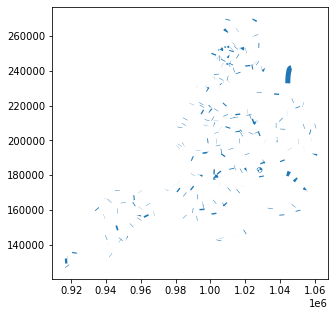

In [1582]:
streets.plot(figsize=(20,5), linewidth=5)

### 12.2.5 Crosses

In [1583]:
streets.crosses(nta_shape).value_counts()

False    194
True       1
dtype: int64

In [1584]:
streets.loc[streets.crosses(nta_shape) == True]

,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,bike_trafd,...,snow_pri,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry
174,1,31,None,34,10305,30,None,AVE,1622606701,None,...,C,5,TW,None,JEROME AVE,86662,JEROME,2007-11-29T00:00:00,139,"MULTILINESTRING ((962875.706 157004.294, 96331..."


In [1585]:
nta_shape.iloc[[174]]

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
174,SI14,40931632.6387,085,Grasmere-Arrochar-Ft. Wadsworth,39960.9748864,Staten Island,5,"MULTIPOLYGON (((961604.662 160174.839, 962652....","MULTIPOLYGON (((971604.662 170174.839, 972652....",POINT (964318.564 157997.805)


Text(0.5, 1.0, 'Crosses = True')

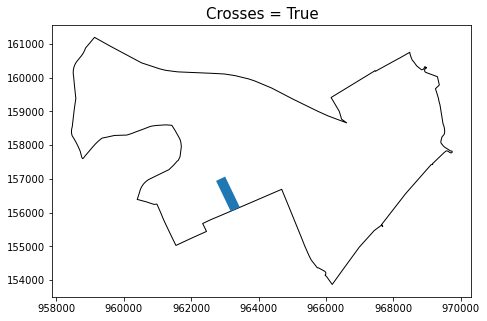

In [1586]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

streets.loc[streets.crosses(nta_shape) == True].plot(ax=ax, 
                                                     linewidth=10)

nta_shape.iloc[[174]].plot(ax=ax, 
                           color='none',
                           edgecolor='black')

ax.set_title('Crosses = True', fontsize=15)

Text(0.5, 1.0, 'Crosses = False')

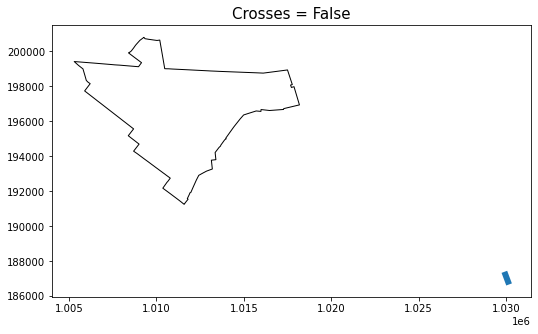

In [1587]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

streets.iloc[[30]].plot(ax=ax, linewidth=6)

nta_shape.iloc[[30]].plot(ax=ax, 
                          color='none',
                          edgecolor='black')

ax.set_title('Crosses = False', fontsize=15)

In [1588]:
nta_shape['geometry'].disjoint(nta_shape.set_geometry('offset')).value_counts()

True     185
False     10
dtype: int64

### 12.2.6 Overlaps

In [1589]:
nta_shape['geometry'].overlaps(nta_shape.set_geometry('offset')).value_counts()

False    185
True      10
dtype: int64

In [1590]:
nta_shape.loc[nta_shape['geometry'].overlaps(nta_shape.set_geometry('offset')) == True].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
59,SI01,141057788.612,085,Annadale-Huguenot-Prince's Bay-Eltingville,71174.5830099,Staten Island,5,"MULTIPOLYGON (((937062.469 143742.591, 937059....","MULTIPOLYGON (((947062.469 153742.591, 947059....",POINT (932069.309 131939.902)
76,SI11,145674612.035,085,Charleston-Richmond Valley-Tottenville,84848.4551217,Staten Island,5,"MULTIPOLYGON (((926730.616 142481.322, 926228....","MULTIPOLYGON (((936730.616 152481.322, 936228....",POINT (919322.784 130818.739)
97,QN05,61569261.2362,081,Rosedale,64163.7256455,Queens,4,"MULTIPOLYGON (((1060282.018 188318.545, 106027...","MULTIPOLYGON (((1070282.018 198318.545, 107027...",POINT (1056539.403 179052.939)
138,BX99,220837194.772,005,park-cemetery-etc-Bronx,223421.140891,Bronx,2,"MULTIPOLYGON (((1020356.163 236653.068, 102035...","MULTIPOLYGON (((1030356.163 246653.068, 103035...",POINT (1026256.366 257174.837)
172,SI05,327290184.59,085,New Springville-Bloomfield-Travis,109065.873453,Staten Island,5,"MULTIPOLYGON (((941550.555 162375.099, 941570....","MULTIPOLYGON (((951550.555 172375.099, 951570....",POINT (935269.175 156417.849)


Text(0.5, 1.0, 'Overlaps = True')

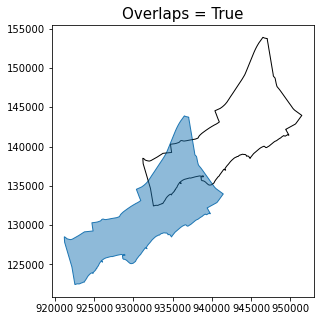

In [1591]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[59]].set_geometry('geometry').plot(ax=ax, 
                                                   color='none', 
                                                   edgecolor='#1f77b4')

nta_shape.iloc[[59]].set_geometry('offset').plot(ax=ax, 
                                                 color='none', 
                                                 edgecolor='black')

nta_shape.iloc[[59]].plot(ax=ax, alpha=.5)

ax.set_title('Overlaps = True', fontsize=15)

Text(0.5, 1.0, 'Overlaps = False')

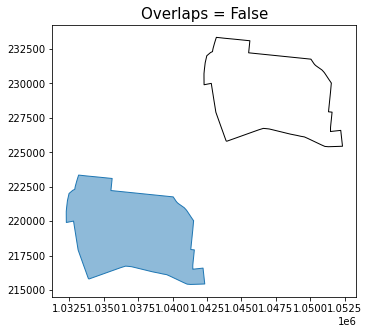

In [1592]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=ax, 
                                                  color='none', 
                                                  edgecolor='#1f77b4')

nta_shape.iloc[[1]].set_geometry('offset').plot(ax=ax, 
                                                color='none', 
                                                edgecolor='black')

nta_shape.iloc[[1]].plot(ax=ax, alpha=.5)

ax.set_title('Overlaps = False', fontsize=15)

In [1593]:
streets['centroid'] = streets.representative_point()

streets.head()

,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,bike_trafd,...,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry,centroid
0,6,None,None,0,10458,None,None,TRL,0,None,...,2,NV,None,MITSUBISHI WILD WETLAND TRL,164809,MITSUBISHI WILD WETLAND,2014-08-19T00:00:00,None,"MULTILINESTRING ((1017825.856 253319.853, 1017...",POINT (1017949.534 252821.992)
1,1,215-001,None,35,11360,215-000,None,AVE,112262650,None,...,4,TW,None,28 AVE,6110,28,2007-11-29T00:00:00,215-027,"MULTILINESTRING ((1047146.080 222733.432, 1047...",POINT (1047146.080 222733.432)
2,1,5631,None,42,10471,5602,None,AVE,1522601877,None,...,2,TW,None,ARLINGTON AVE,61140,ARLINGTON,2007-11-29T00:00:00,5699,"MULTILINESTRING ((1009926.638 269075.549, 1010...",POINT (1009926.638 269075.549)
3,1,317,None,50,11217,316,2,ST,1922612977,TW,...,3,TW,None,SCHERMERHORN ST,145494,SCHERMERHORN,2007-11-29T00:00:00,399,"MULTILINESTRING ((989292.818 189689.736, 98964...",POINT (989648.842 189530.271)
4,1,120-011,None,40,11415,0,None,BLVD,92269521,None,...,4,TF,None,QUEENS BLVD,12438,QUEENS,2007-11-29T00:00:00,120-011,"MULTILINESTRING ((1031371.427 199453.863, 1031...",POINT (1031412.588 199430.359)


### 12.2.7 Touches

In [1594]:
streets['geometry'].touches(streets['centroid']).value_counts()

True     140
False     55
dtype: int64

In [1595]:
streets.loc[streets['geometry'].touches(streets['centroid']) == False].head()

,rw_type,l_low_hn,pre_direct,st_width,r_zip,r_low_hn,bike_lane,post_type,r_blkfc_id,bike_trafd,...,borocode,trafdir,pre_modifi,st_label,physicalid,st_name,created,l_high_hn,geometry,centroid
0,6,None,None,0,10458,None,None,TRL,0,None,...,2,NV,None,MITSUBISHI WILD WETLAND TRL,164809,MITSUBISHI WILD WETLAND,2014-08-19T00:00:00,None,"MULTILINESTRING ((1017825.856 253319.853, 1017...",POINT (1017949.534 252821.992)
3,1,317,None,50,11217,316,2,ST,1922612977,TW,...,3,TW,None,SCHERMERHORN ST,145494,SCHERMERHORN,2007-11-29T00:00:00,399,"MULTILINESTRING ((989292.818 189689.736, 98964...",POINT (989648.842 189530.271)
10,14,None,None,0,None,None,None,RTE,0,None,...,2,NV,None,HIGHLANDS-MARTHAS VYD FERRY RTE,178314,MARTHA'S VYD-HIGHLANDS FERRY,2017-01-09T00:00:00,None,"MULTILINESTRING ((1044414.405 232775.423, 1044...",POINT (1044679.995 237583.134)
16,8,None,None,28,10040,None,None,None,1322600323,None,...,1,TW,None,DRIVEWAY,170875,DRIVEWAY,2015-12-15T00:00:00,None,"MULTILINESTRING ((1005681.023 252432.821, 1005...",POINT (1005892.564 252107.486)
20,1,2,None,30,10033,1,None,AVE,1322603144,None,...,1,TF,None,BENNETT AVE,183608,BENNETT,2007-11-29T00:00:00,64,"MULTILINESTRING ((1001772.937 249124.701, 1001...",POINT (1001899.326 249458.522)


Text(0.5, 1.0, 'Touches = True')

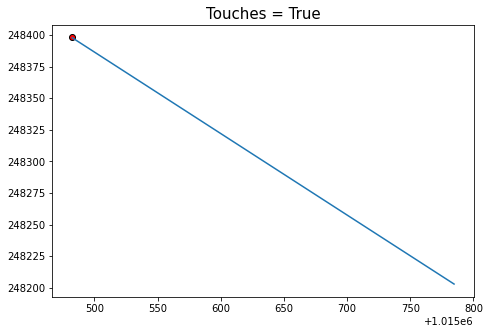

In [1596]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

streets.iloc[[6]].set_geometry('centroid').plot(ax=ax, color='red', edgecolor='black')

streets.iloc[[6]].plot(ax=ax)

ax.set_title('Touches = True', fontsize=15)

Text(0.5, 1.0, 'Touches = False')

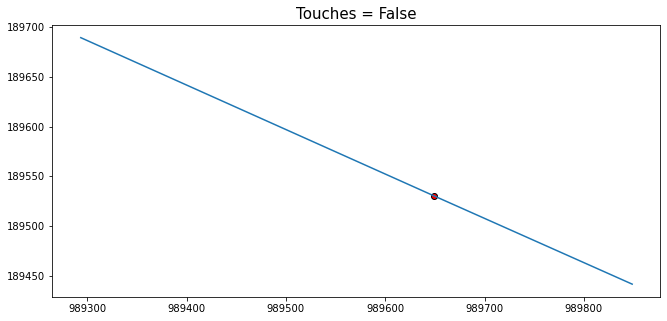

In [1597]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

streets.iloc[[3]].set_geometry('centroid').plot(ax=ax, color='red', edgecolor='black')

streets.iloc[[3]].plot(ax=ax)

ax.set_title('Touches = False', fontsize=15)

In [1598]:
nta_shape['centroid_column']  = nta_shape.centroid

nta_shape['geometry'].covers(nta_shape.set_geometry('centroid_column')).value_counts()

/Users/geribauer/anaconda3/lib/python3.7/site-packages/geopandas/base.py:61: FutureWarning:     You are passing non-geometry data to the GeoSeries constructor. Currently,
    it falls back to returning a pandas Series. But in the future, we will start
    to raise a TypeError instead.
  return GeoSeries(geoms.data, index=index, crs=this.crs)


True     186
False      9
dtype: int64

### 12.2.8 Covers

In [1599]:
nta_shape.loc[nta_shape['geometry'].covers(nta_shape.set_geometry('centroid_column')) == False].head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,offset,centroid_column
11,BX10,40134533.2335,005,Pelham Bay-Country Club-City Island,138249.436712,Bronx,2,"MULTIPOLYGON (((1042822.450 243439.814, 104255...","MULTIPOLYGON (((1052822.450 253439.814, 105255...",POINT (1037775.120 247764.710)
92,BX03,40256794.2545,005,Eastchester-Edenwald-Baychester,59164.9993069,Bronx,2,"MULTIPOLYGON (((1033004.041 263542.959, 103327...","MULTIPOLYGON (((1043004.041 273542.959, 104327...",POINT (1029422.433 260268.325)
110,MN99,91543352.7608,061,park-cemetery-etc-Manhattan,155354.846333,Manhattan,1,"MULTIPOLYGON (((981219.056 188655.316, 980940....","MULTIPOLYGON (((991219.056 198655.316, 990940....",POINT (996760.243 226350.078)
125,SI22,56030445.2217,085,West New Brighton-New Brighton-St. George,66054.251684,Staten Island,5,"MULTIPOLYGON (((964105.855 171704.149, 963907....","MULTIPOLYGON (((974105.855 181704.149, 973907....",POINT (955854.706 172087.534)
138,BX99,220837194.772,005,park-cemetery-etc-Bronx,223421.140891,Bronx,2,"MULTIPOLYGON (((1020356.163 236653.068, 102035...","MULTIPOLYGON (((1030356.163 246653.068, 103035...",POINT (1026256.366 257174.837)


Text(0.5, 1.0, 'Covers = True')

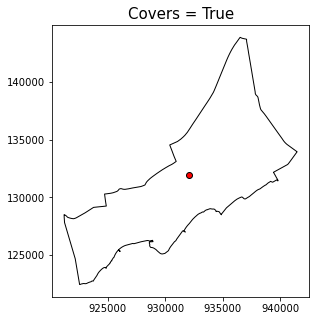

In [1600]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[59]].set_geometry('centroid_column').plot(ax=ax, 
                                                          color='red', 
                                                          edgecolor='black')

nta_shape.iloc[[59]].plot(ax=ax, 
                          color='none', 
                          edgecolor='black')

ax.set_title('Covers = True', fontsize=15)

Text(0.5, 1.0, 'Covers = False')

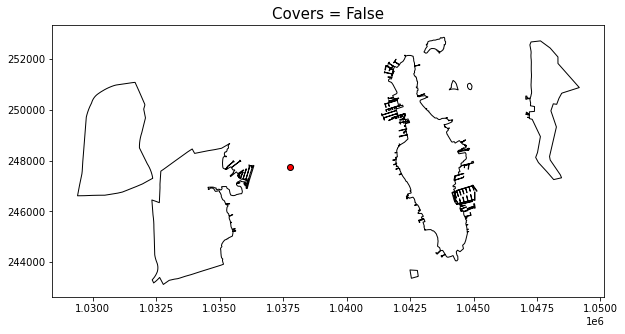

In [1601]:
fig, ax = plt.subplots(figsize=(20,5)) # creating a figure

nta_shape.iloc[[11]].set_geometry('centroid_column').plot(ax=ax, 
                                                          color='red', 
                                                          edgecolor='black')

nta_shape.iloc[[11]].plot(ax=ax, 
                          color='none', 
                          edgecolor='black')

ax.set_title('Covers = False', fontsize=15)

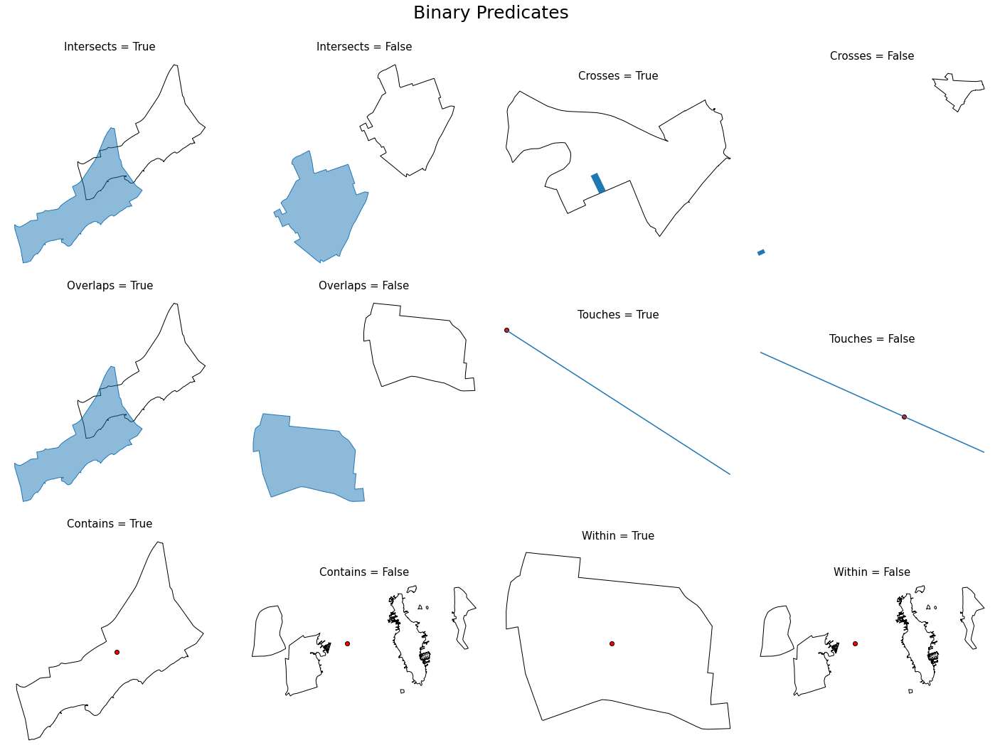

In [1603]:
fig, axs = plt.subplots(3, 4, sharey=False, figsize=(20,15))

nta_shape.iloc[[59]].set_geometry('geometry').plot(ax=axs[0, 0], 
                                                   color='none', 
                                                   edgecolor='#1f77b4')
nta_shape.iloc[[59]].set_geometry('offset').plot(ax=axs[0, 0], 
                                                 color='none', 
                                                 edgecolor='black')
nta_shape.iloc[[59]].plot(ax=axs[0, 0], alpha=.5)
axs[0, 0].set_title('Intersects = True', fontsize=15)
axs[0, 0].set_title('Intersects = True', fontsize=15)
axs[0, 0].axis('off')

nta_shape.iloc[[9]].set_geometry('geometry').plot(ax=axs[0, 1], 
                                                  color='none', 
                                                  edgecolor='#1f77b4')
nta_shape.iloc[[9]].set_geometry('offset').plot(ax=axs[0, 1], 
                                                color='none', 
                                                edgecolor='black')
nta_shape.iloc[[9]].plot(ax=axs[0, 1], alpha=.5)
axs[0, 1].set_title('Intersects = False', fontsize=15)
axs[0, 1].axis('off')


streets.loc[streets.crosses(nta_shape) == True].plot(ax=axs[0, 2], 
                                                     linewidth=10)
nta_shape.iloc[[174]].plot(ax=axs[0, 2], 
                           color='none',
                           edgecolor='black')
axs[0, 2].set_title('Crosses = True', fontsize=15)
axs[0, 2].axis('off')

streets.loc[streets.crosses(nta_shape) == True].plot(ax=axs[0, 3], linewidth=10)
nta_shape.iloc[[30]].plot(ax=axs[0, 3], 
                          color='none',
                          edgecolor='black')
axs[0, 3].set_title('Crosses = False', fontsize=15)
axs[0, 3].axis('off')


nta_shape.iloc[[59]].set_geometry('geometry').plot(ax=axs[1, 0], 
                                                   color='none', 
                                                   edgecolor='#1f77b4')
nta_shape.iloc[[59]].set_geometry('offset').plot(ax=axs[1, 0], 
                                                 color='none', 
                                                 edgecolor='black')
nta_shape.iloc[[59]].plot(ax=axs[1, 0], alpha=.5)
axs[1, 0].set_title('Overlaps = True', fontsize=15)
axs[1, 0].axis('off')

nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=axs[1, 1], 
                                                  color='none', 
                                                  edgecolor='#1f77b4')
nta_shape.iloc[[1]].set_geometry('offset').plot(ax=axs[1, 1], 
                                                color='none', 
                                                edgecolor='black')
nta_shape.iloc[[1]].plot(ax=axs[1,1], alpha=.5)
axs[1, 1].set_title('Overlaps = False', fontsize=15)
axs[1, 1].axis('off')

streets.iloc[[6]].set_geometry('centroid').plot(ax=axs[1, 2], color='red', edgecolor='black')
streets.iloc[[6]].plot(ax=axs[1, 2])
axs[1, 2].set_title('Touches = True', fontsize=15)
axs[1, 2].axis('off')

streets.iloc[[3]].set_geometry('centroid').plot(ax=axs[1, 3], color='red', edgecolor='black')
streets.iloc[[3]].plot(ax=axs[1, 3])
axs[1, 3].set_title('Touches = False', fontsize=15)
axs[1, 3].axis('off')


nta_shape.iloc[[59]].set_geometry('centroid_column').plot(ax=axs[2, 0], 
                                                          color='red', 
                                                          edgecolor='black')
nta_shape.iloc[[59]].plot(ax=axs[2, 0], 
                          color='none', 
                          edgecolor='black')
axs[2, 0].set_title('Contains = True', fontsize=15)
axs[2, 0].axis('off')

nta_shape.iloc[[11]].set_geometry('centroid_column').plot(ax=axs[2, 1], 
                                                          color='red', 
                                                          edgecolor='black')
nta_shape.iloc[[11]].plot(ax=axs[2, 1], 
                          color='none', 
                          edgecolor='black')
axs[2, 1].set_title('Contains = False', fontsize=15)
axs[2, 1].axis('off')


nta_shape.iloc[[1]].set_geometry('geometry').plot(ax=axs[2, 2], 
                                                   color='none', 
                                                   edgecolor='black')
nta_shape.iloc[[1]].set_geometry('centroid_column').plot(ax=axs[2, 2], 
                                                 color='red', 
                                                 edgecolor='black')
axs[2, 2].set_title('Within = True', fontsize=15)
axs[2, 2].axis('off')

nta_shape.iloc[[11]].set_geometry('geometry').plot(ax=axs[2, 3], 
                                                   color='none', 
                                                   edgecolor='black')
nta_shape.iloc[[11]].set_geometry('centroid_column').plot(ax=axs[2, 3], 
                                                 color='red', 
                                                 edgecolor='black')
axs[2, 3].set_title('Within = False', fontsize=15)
axs[2, 3].axis('off')


fig.suptitle("Binary Predicates\n", fontsize=25)
fig.subplots_adjust(top=0.90)
fig.tight_layout()
plt.savefig('figures/12-2-a')

## 12.3 Set-Theoretic Methods

In [1521]:
nta_shape.centroid_column.difference(nta_shape['geometry'])

0                         POINT EMPTY
1                         POINT EMPTY
2                         POINT EMPTY
3                         POINT EMPTY
4                         POINT EMPTY
                    ...              
190    POINT (1006576.015 166297.653)
191                       POINT EMPTY
192                       POINT EMPTY
193    POINT (1018636.191 147566.096)
194    POINT (1030807.168 190601.758)
Length: 195, dtype: geometry

In [1522]:
nta_shape.centroid_column.intersection(nta_shape['geometry'])

0       POINT (987397.463 169148.408)
1      POINT (1037005.224 219265.318)
2      POINT (1020706.745 217413.871)
3       POINT (997674.726 174677.650)
4      POINT (1050471.492 198271.804)
                    ...              
190                       POINT EMPTY
191    POINT (1031134.609 192361.611)
192    POINT (1041371.284 195964.278)
193                       POINT EMPTY
194                       POINT EMPTY
Length: 195, dtype: geometry

In [1523]:
nta_shape.centroid.symmetric_difference(nta_shape['geometry'])

0      POLYGON ((990897.900 169268.121, 990588.252 16...
1      POLYGON ((1038593.459 221913.355, 1039369.281 ...
2      POLYGON ((1022728.275 217530.808, 1023052.645 ...
3      POLYGON ((998608.334 171942.436, 998339.702 17...
4      POLYGON ((1051539.660 201007.013, 1051920.726 ...
                             ...                        
190    GEOMETRYCOLLECTION (POINT (1006576.015 166297....
191    POLYGON ((1035162.882 195252.025, 1035229.739 ...
192    POLYGON ((1048446.277 197901.245, 1048241.242 ...
193    GEOMETRYCOLLECTION (POINT (1018636.191 147566....
194    GEOMETRYCOLLECTION (POINT (1030807.168 190601....
Length: 195, dtype: geometry

Text(0.5, 1.0, 'symmetric difference')

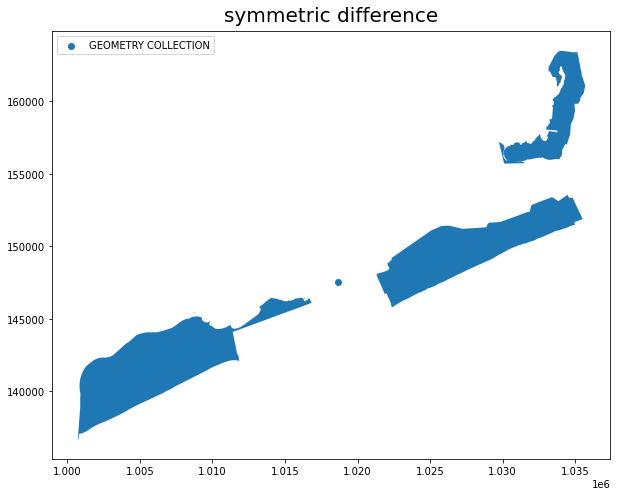

In [1524]:
fig, ax = plt.subplots(figsize=(10,15)) # creating a figure

nta_shape.centroid.symmetric_difference(nta_shape['geometry']).iloc[[193]].plot(ax=ax, 
                                                                                label='GEOMETRY COLLECTION')
plt.legend(loc=2)
plt.title('symmetric difference', fontsize=20, pad=10)

In [1525]:
nta_shape.centroid.union(nta_shape['geometry'])

0      POLYGON ((990897.900 169268.121, 990588.252 16...
1      POLYGON ((1038593.459 221913.355, 1039369.281 ...
2      POLYGON ((1022728.275 217530.808, 1023052.645 ...
3      POLYGON ((998608.334 171942.436, 998339.702 17...
4      POLYGON ((1051539.660 201007.013, 1051920.726 ...
                             ...                        
190    GEOMETRYCOLLECTION (POINT (1006576.015 166297....
191    POLYGON ((1035162.882 195252.025, 1035229.739 ...
192    POLYGON ((1048446.277 197901.245, 1048241.242 ...
193    GEOMETRYCOLLECTION (POINT (1018636.191 147566....
194    GEOMETRYCOLLECTION (POINT (1030807.168 190601....
Length: 195, dtype: geometry

Text(0.5, 1.0, 'union')

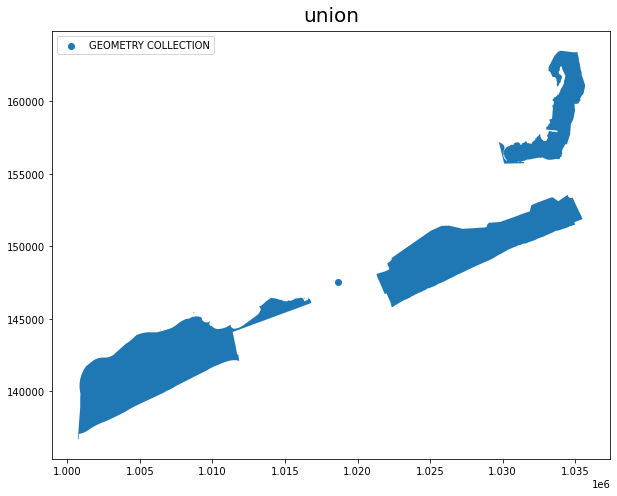

In [1526]:
fig, ax = plt.subplots(figsize=(10,15)) # creating a figure

nta_shape.centroid.union(nta_shape['geometry']).iloc[[193]].plot(ax=ax, 
                                                                 label='GEOMETRY COLLECTION')
plt.legend(loc=2)
plt.title('union', fontsize=20, pad=10)

## 12.4 Constructive Methods

In [1527]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

nta_shape.to_crs(epsg=2263, inplace=True)
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.900 169268.121, 990588...."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.459 221913.355, 103936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.275 217530.808, 102305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.334 171942.436, 998339...."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.660 201007.013, 105192..."


### 12.4.1 Buffer

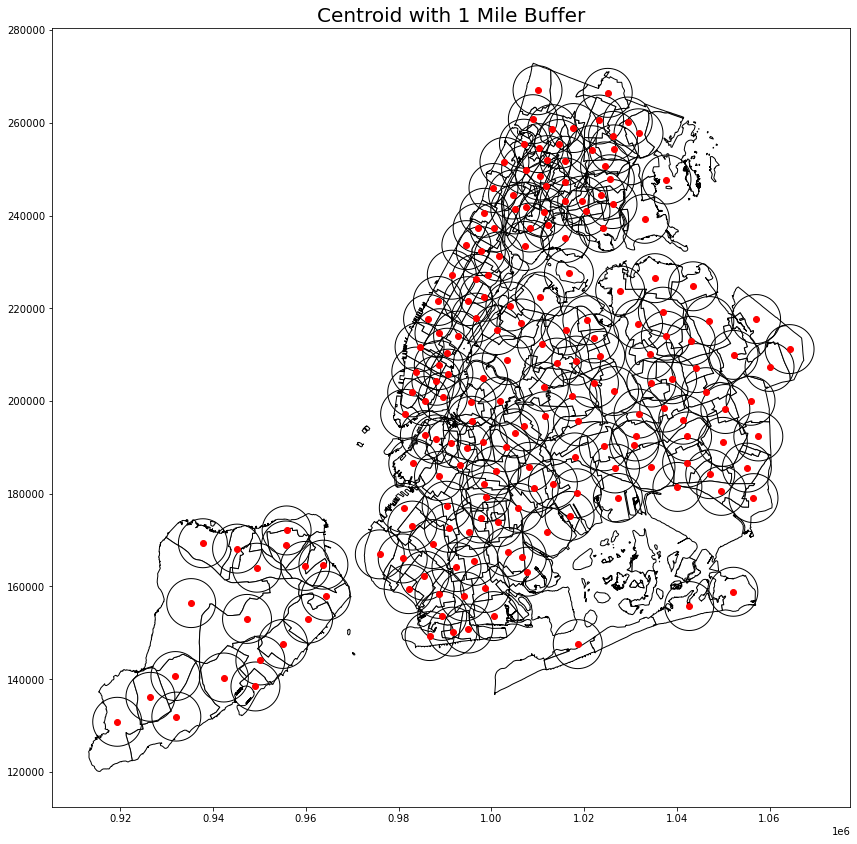

In [1528]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.centroid.buffer(5280).plot(ax=ax, 
                                     color='none', 
                                     edgecolor='black')

nta_shape.centroid.plot(ax=ax, 
                        color='red', 
                        edgecolor='red')

nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black', 
               zorder=0)

ax.set_title('Centroid with 1 Mile Buffer', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-4-a')

### 12.4.2 Convex Hull

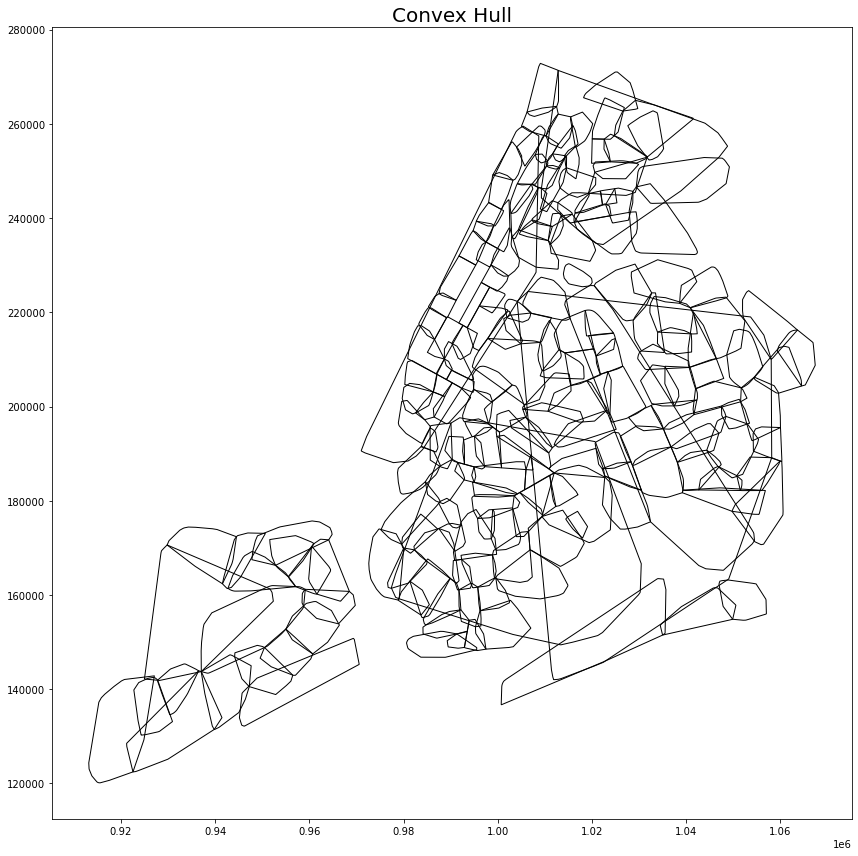

In [1529]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape['geometry'].convex_hull.plot(ax=ax, 
                                       color='none', 
                                       edgecolor='black')

ax.set_title('Convex Hull', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-4-b')

### 12.4.3 Envelope

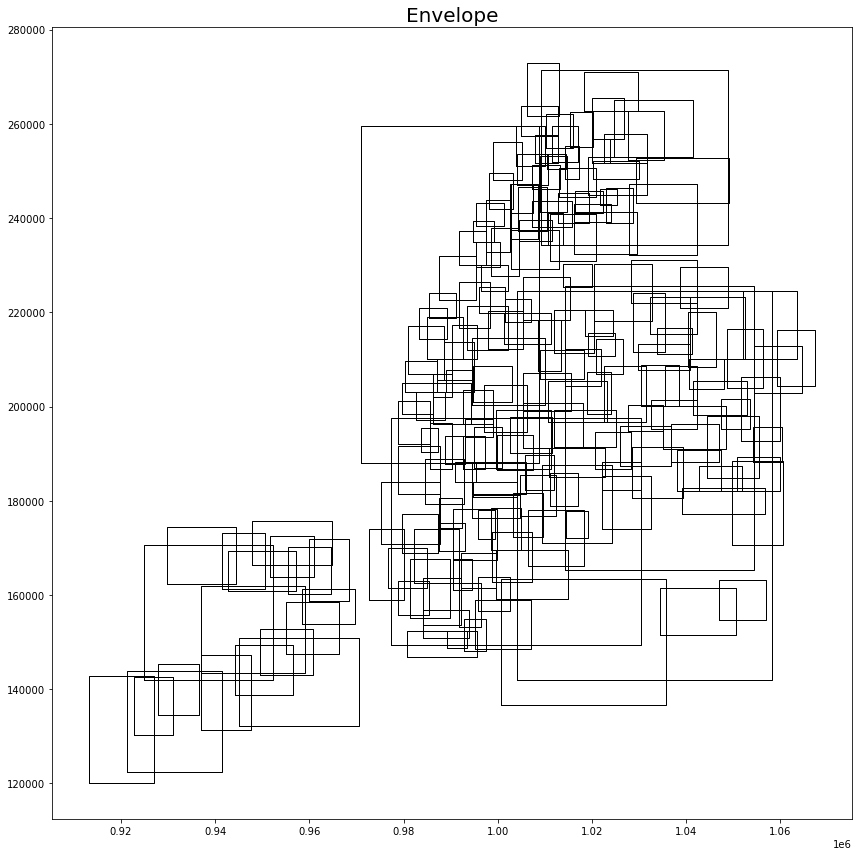

In [1530]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape['geometry'].envelope.plot(ax=ax, 
                                    color='none', 
                                    edgecolor='black')

ax.set_title('Envelope', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-4-c')

### 12.4.4 Simplify

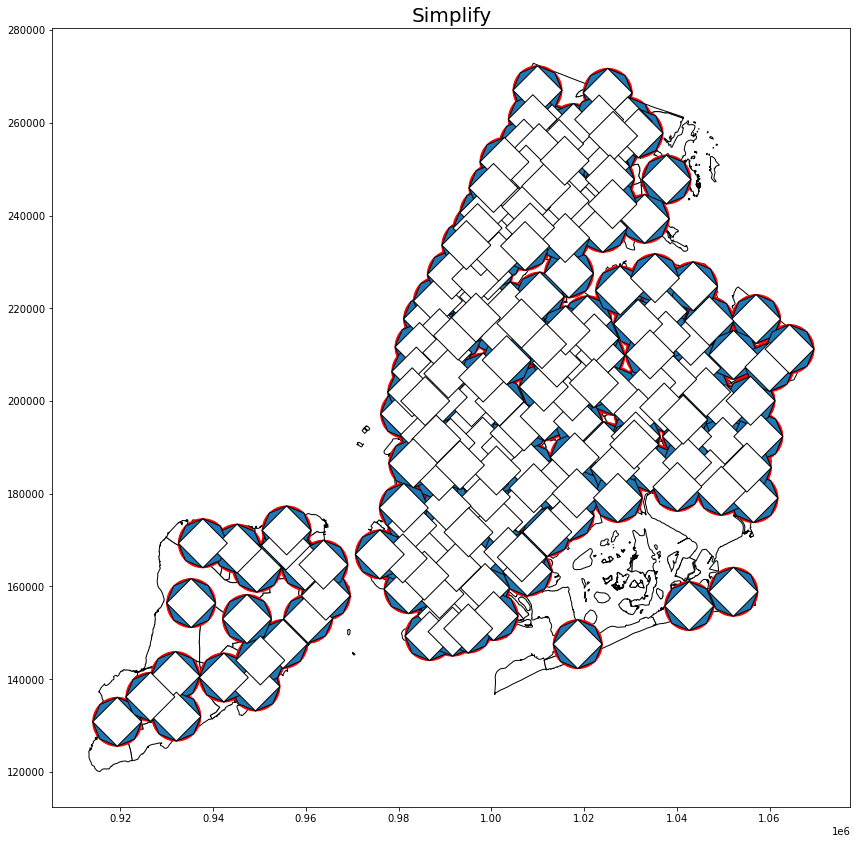

In [1531]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.centroid.buffer(5280).plot(ax=ax, 
                                     color='red', 
                                     edgecolor='red')

nta_shape.centroid.buffer(5280).simplify(1000).plot(ax=ax, 
                                                    edgecolor='black')

nta_shape.centroid.buffer(5280).simplify(10000).plot(ax=ax, 
                                                     color='white', 
                                                     edgecolor='black')

nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black',
               zorder=0)

ax.set_title('Simplify', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-4-d')

## 12.5 Affine Transformations

### 12.5.1 Rotate

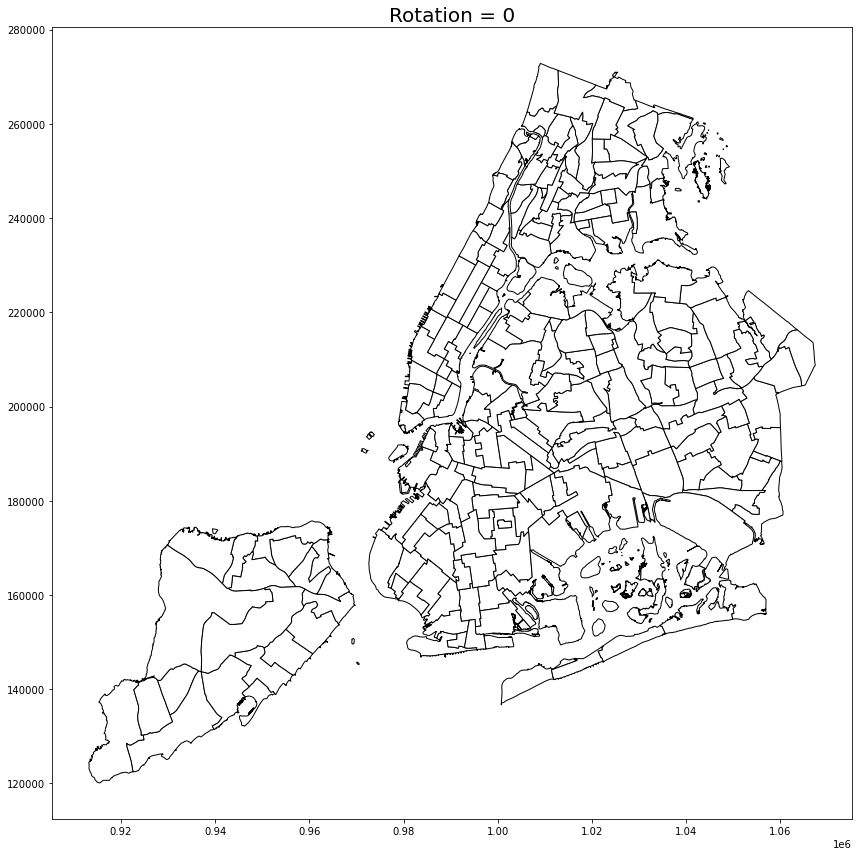

In [1532]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.rotate(0).plot(ax=ax, 
                         color='white', 
                         edgecolor='black')

ax.set_title('Rotation = 0', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-a')

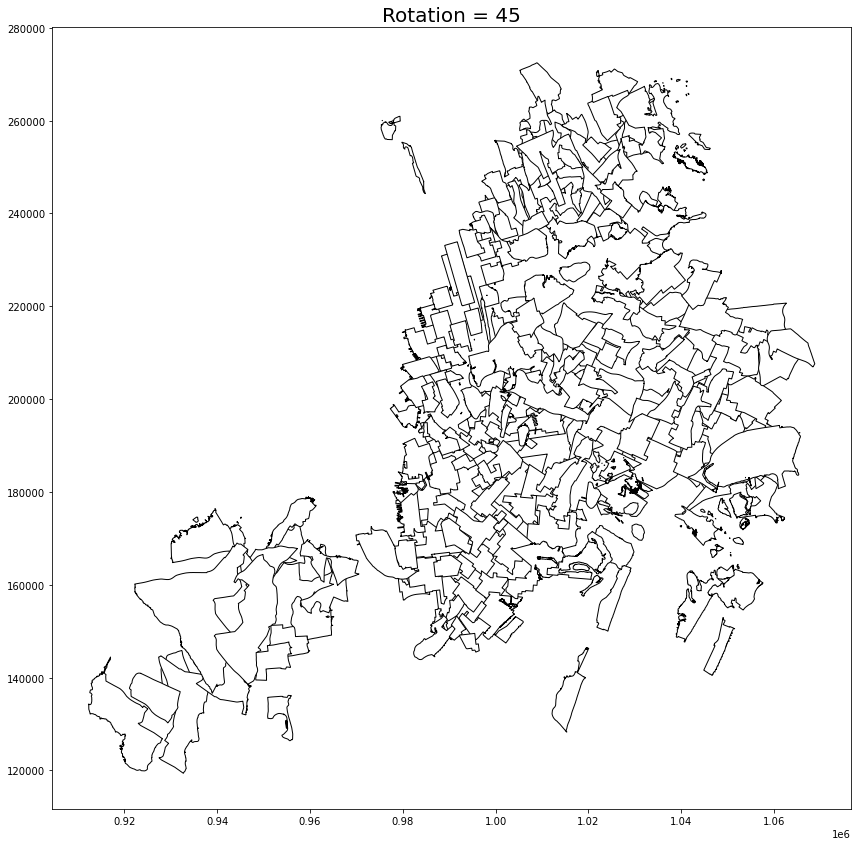

In [1533]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.rotate(45).plot(ax=ax, 
                          color='white', 
                          edgecolor='black')

ax.set_title('Rotation = 45', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-b')

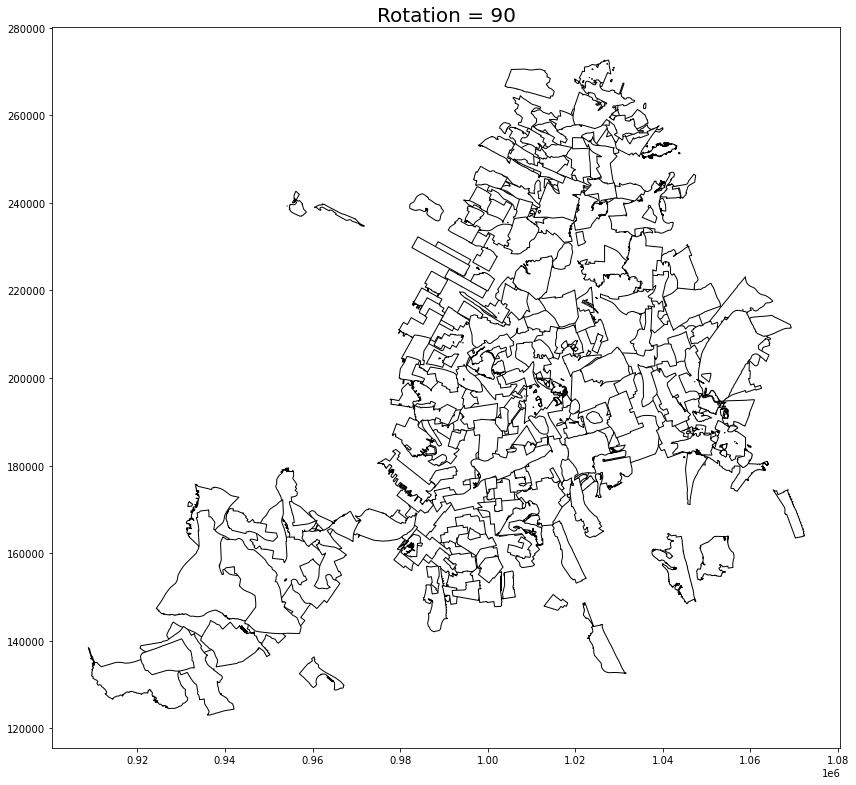

In [1534]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.rotate(90).plot(ax=ax, 
                          color='white', 
                          edgecolor='black')

ax.set_title('Rotation = 90', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-c')

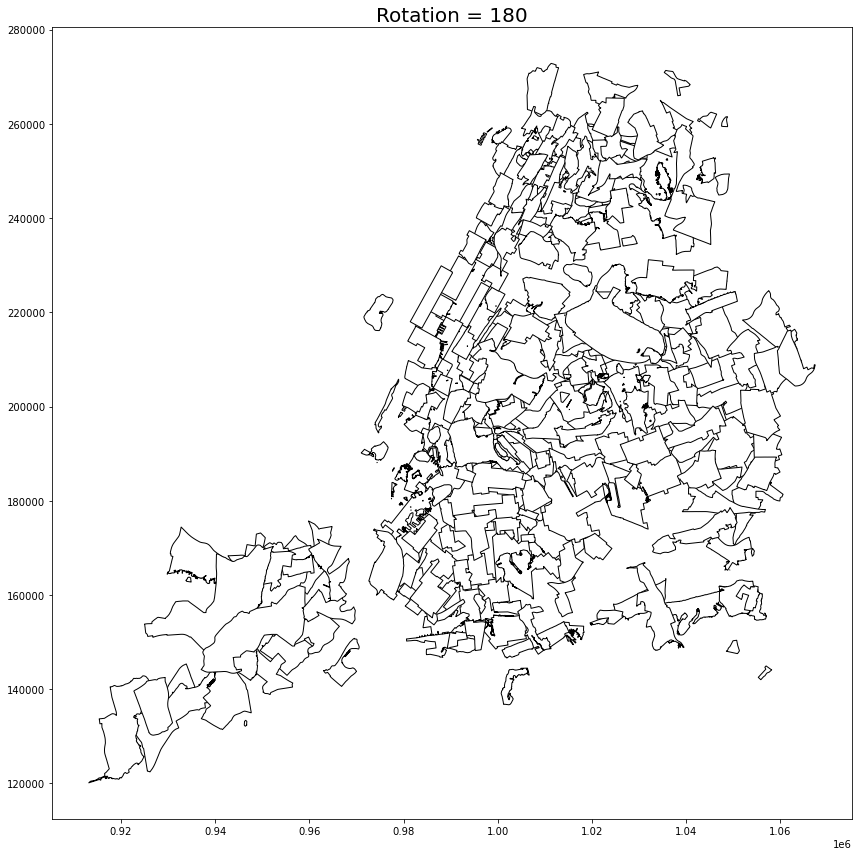

In [1535]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.rotate(180).plot(ax=ax, 
                           color='white', 
                           edgecolor='black')

ax.set_title('Rotation = 180', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-d')

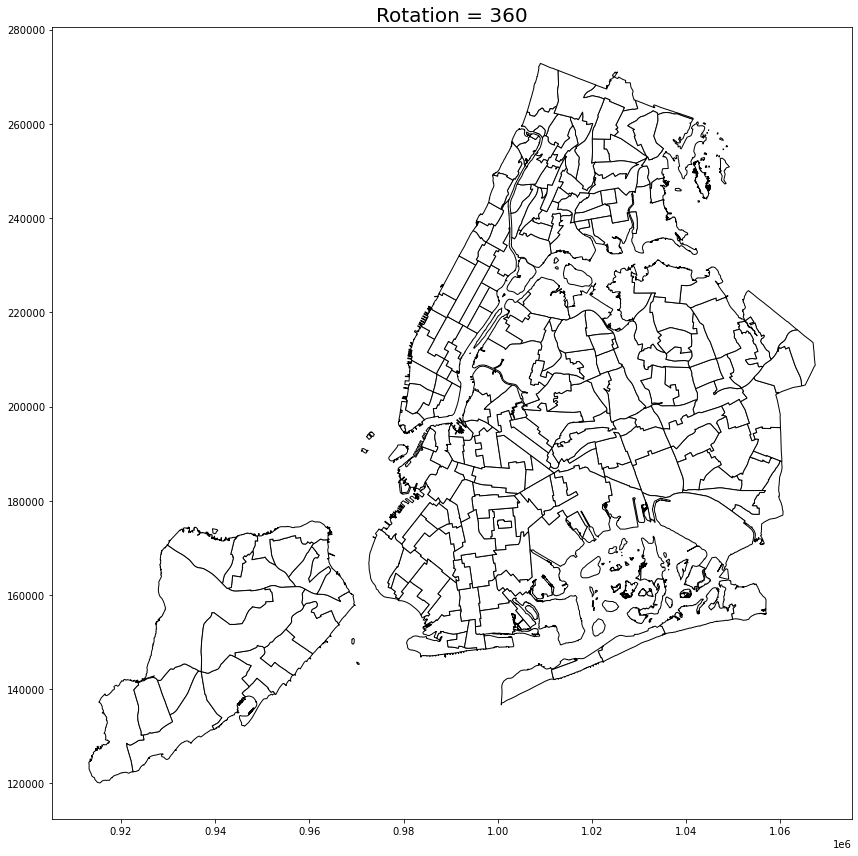

In [1536]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.rotate(360).plot(ax=ax, 
                           color='white', 
                           edgecolor='black')

ax.set_title('Rotation = 360', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-e')

### 12.5.2 Scale

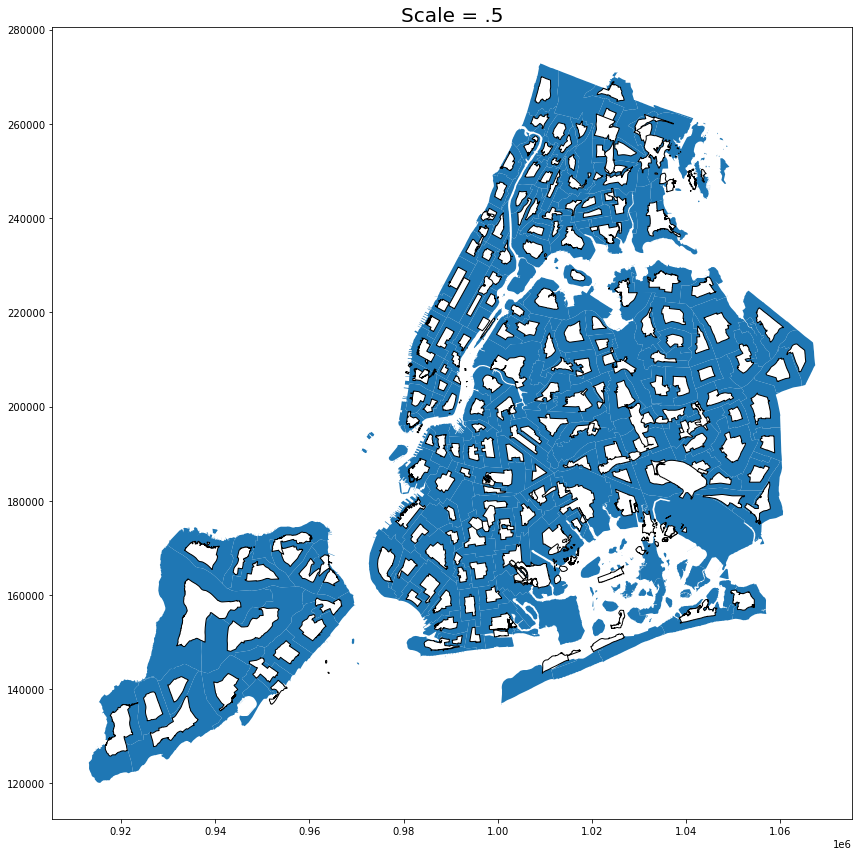

In [1537]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.scale(xfact=.5, yfact=.5).plot(ax=ax, 
                                         color='white', 
                                         edgecolor='black')

nta_shape.plot(ax=ax, 
               zorder=0)

ax.set_title('Scale = .5', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-f')

### 12.5.3 Skew

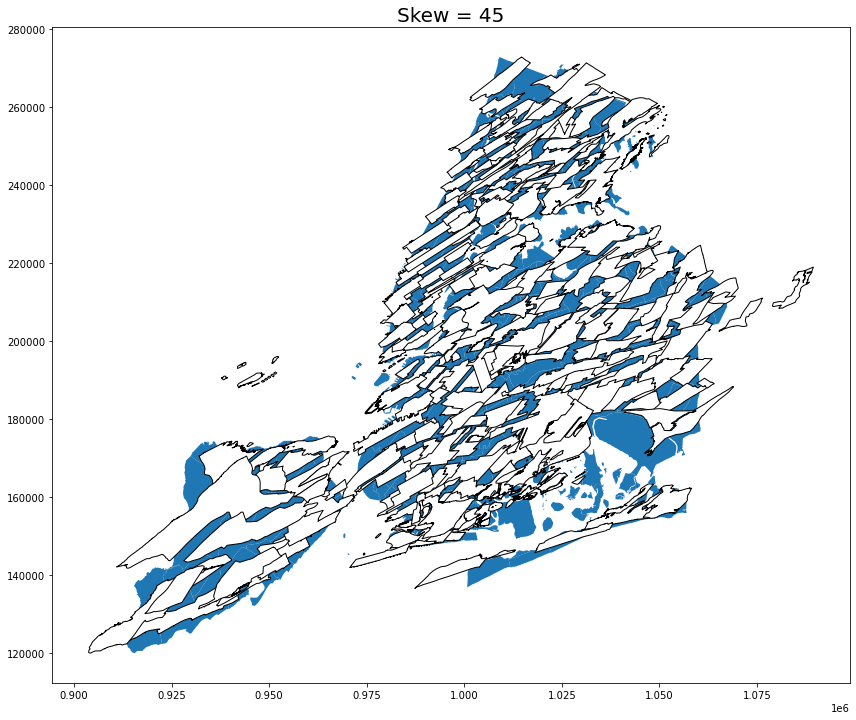

In [1538]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.skew(45).plot(ax=ax, 
                        color='white', 
                        edgecolor='black')

nta_shape.plot(ax=ax, 
               zorder=0)

ax.set_title('Skew = 45', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-g')

### 12.5.4 Translate/Offset

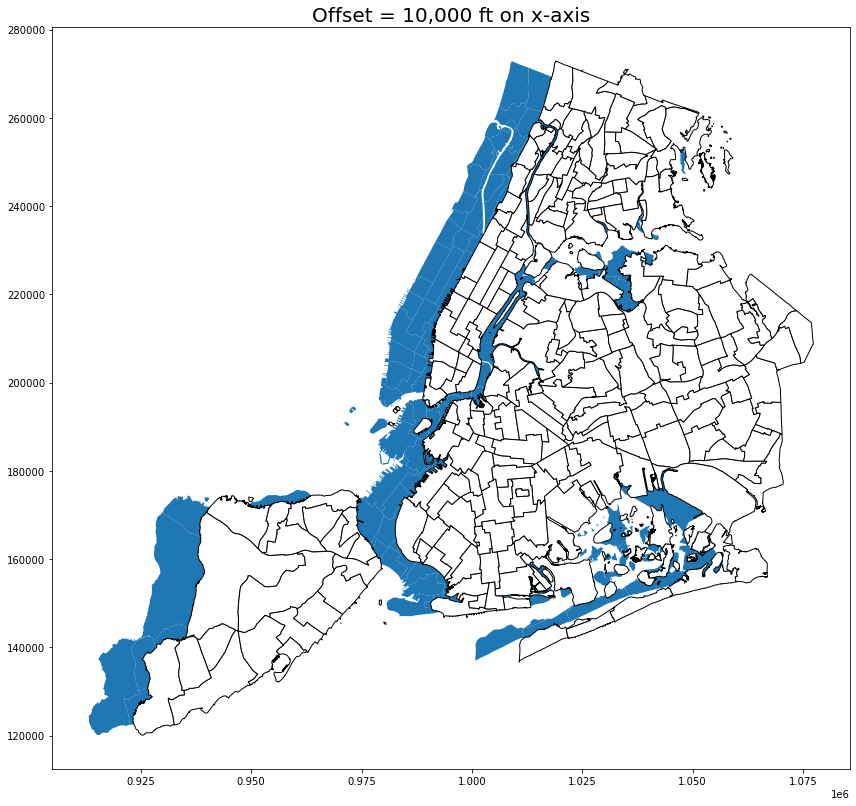

In [1539]:
fig, ax = plt.subplots(figsize=(12,12)) # creating a figure

nta_shape.translate(10000).plot(ax=ax, 
                                color='white', 
                                edgecolor='black')

nta_shape.plot(ax=ax, 
               zorder=0)

ax.set_title('Offset = 10,000 ft on x-axis', fontsize=20)
ax.set_aspect('equal', 'box')
fig.tight_layout()
plt.savefig('figures/12-5-h')